<a href="https://colab.research.google.com/github/lexmar07/Deep-Legendre-Transform/blob/main/appendix/Appendix_Tables_9_10_Experiments_with_Non_Separable_functions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Experiments with Non-Separable Functions

## Experimental Setup

All experiments employ ResNet approximators with 2 blocks of 128 hidden units each, trained using the Duality Learning Transformer (DLT) framework. We train for 120,000 iterations with a learning rate of 10⁻³ and Huber loss (δ=1.0) to ensure robust convergence. The DLT implementation maintains fresh randomness at every step without replay buffers, and crucially never backpropagates through the target function f. For each function class, we apply domain-specific whitening transformations to the gradient samples: symmetric whitening via eigendecomposition for quadratic functions, analytic mean and rank-1 covariance for exponential-minus-linear, and probe-based statistics for ICNN and soft-plus functions. Training samples x are drawn from appropriate domains (see table below), with batch sizes adaptively set to 25% of dimension (B = ⌊0.25d⌋). We evaluate performance at dimensions d ∈ {10, 20, 50} and report results averaged over 3 independent trials with different random seeds.

## Performance on Non-Separable Functions

To demonstrate DLT's capability beyond simple separable functions, we evaluate its performance on several challenging non-separable convex functions where classical methods struggle or fail entirely.

### Test Functions

**Quadratic Form with Random SPD Matrix**: We test f(x) = ½xᵀQx where Q is a randomly generated symmetric positive definite matrix with controlled condition number κ ≈ 10². The coupling through Q makes this strongly non-separable, requiring the approximator to learn the full quadratic form structure.

**Exponential-minus-Linear**: The function f(x) = exp(⟨a,x⟩) - ⟨b,x⟩ where a,b ∈ S^(d-1) are independently sampled unit vectors. Specifically, we sample a_raw, b_raw ~ N(0,I_d) and normalize them as a = a_raw/||a_raw||₂ and b = b_raw/||b_raw||₂.

**Pre-trained ICNN**: We first train a 2-layer ICNN (128 hidden units per layer) for 50,000 iterations to approximate a target quadratic function, then freeze it and use it as the convex function f. This represents a realistic scenario where the target function itself is a learned model from data.

**Coupled Soft-plus**: The function f(x) = Σᵢ<ⱼ log(1 + exp(xᵢ + xⱼ)) explicitly couples all pairs of variables with O(d²) interaction terms. This severely challenges classical methods due to the combinatorial explosion of terms.

### Sampling Domains

| Function | Primal Domain C | Dual Domain D = ∇f(C) |
|----------|-----------------|------------------------|
| Quadratic SPD | [-3,3]ᵈ (std. normal ±3σ) | [-3\\|Q\\|₂, 3\\|Q\\|₂]ᵈ (≈[-3,3]ᵈ when normalized) |
| Exp-minus-Lin | [-3,3]ᵈ (std. normal ±3σ) | [exp(-3√d)-1, exp(3√d)-1]ᵈ (exponentially wide) |
| ICNN (2-layer) | [-3s, 3s]ᵈ (s ∈ [0.1,10] auto-scaled) | Learned, data-dependent (≈[-3,3]ᵈ after whitening) |
| Soft-plus pairs | [-1.5,1.5]ᵈ | [0, d-1]ᵈ (sigmoid-bounded) |

## Results


Performance of DLT with ResNet approximators on non-separable functions. Absolute RMSE, relative RMSE (normalized by function scale), and training times are reported as mean ± standard deviation over 3 independent trials.

| Function | d | RMSE | Relative RMSE | Time (s) |
|----------|---|------|---------------|----------|
| **Quadratic SPD** | | | | |
| | 10 | 1.15e-2 ± 3.7e-3 | 1.05e-2 ± 3.9e-3 | 584 ± 9 |
| | 20 | 5.13e-3 ± 1.1e-3 | 3.98e-3 ± 6.3e-4 | 1016 ± 10 |
| | 50 | 2.01e-3 ± 2.0e-3 | 1.05e-3 ± 1.1e-3 | 2709 ± 2 |
| **Exp-minus-Lin** | | | | |
| | 10 | 9.18e-2 ± 3.6e-2 | 2.50e-2 ± 1.0e-2 | 599 ± 9 |
| | 20 | 5.78e-2 ± 3.3e-2 | 1.60e-2 ± 8.8e-3 | 1035 ± 14 |
| | 50 | 5.41e-2 ± 4.7e-2 | 1.41e-2 ± 1.2e-2 | 2712 ± 0.2 |
| **ICNN (2-layer)** | | | | |
| | 10 | 2.37e-2 ± 7.1e-3 | 6.17e-3 ± 1.4e-3 | 706 ± 7 |
| | 20 | 1.92e-2 ± 5.3e-3 | 6.06e-3 ± 1.6e-3 | 1200 ± 10 |
| | 50 | 1.13e-2 ± 2.4e-3 | 3.69e-3 ± 8.1e-4 | 2759 ± 1 |
| **Soft-plus pairs** | | | | |
| | 10 | 1.14e-2 ± 7.9e-3 | 5.21e-3 ± 3.6e-3 | 965 ± 9 |
| | 20 | 2.63e-2 ± 9.4e-3 | 4.14e-3 ± 1.5e-3 | 2181 ± 11 |
| | 50 | 1.25e-1 ± 4.3e-2 | 4.95e-3 ± 1.7e-3 | 5498 ± 13 |

The results demonstrate that DLT successfully learns all four non-separable function classes, achieving low RMSE errors across different dimensions. The quadratic SPD function shows the best performance with errors decreasing as dimension increases (from 1.15 × 10⁻² at d=10 to 2.01 × 10⁻³ at d=50), with relative errors dropping below 0.4% at higher dimensions. The exponential-minus-linear function presents greater challenges due to its unbounded gradient domain, yet DLT maintains relative errors around 1.4-2.5%, showing robust performance despite the exponential scaling. The pre-trained ICNN case validates DLT's ability to approximate learned neural network functions with relative errors consistently below 1%, a key requirement for practical applications.

Notably, the coupled soft-plus function requires approximately 2× longer training time at d=20 and d=50 due to its O(d²) pairwise interaction terms, but maintains relative errors below 0.6% across all dimensions despite the absolute RMSE increasing at d=50. This consistent relative accuracy (all functions achieving relative RMSE < 2.5%, with most below 1%) confirms that DLT provides approximations suitable for downstream optimization tasks. These experiments establish that DLT with simple ResNet architectures can effectively handle diverse non-separable convex functions that would be intractable for classical decomposition methods.

Device: cuda, torch 2.8.0+cu126

============================ TRIAL 1/3 (seed=42) ============================

================= quad_spd — d=10 =================
Quadratic SPD: ||Q||₂≈1.010, κ=81.94; features: z = Q^-0.5 y (+ z^2)
Model:    ResNet(width=384, depth=4), params=1.20M
Sampler:  MACRO | batch=640 (B_macro) | steps=120000 | lr=1.00e-03
[  1.7%] train loss=1.842e-04 | train RMSE=2.027e-02 | eval RMSE=1.391e-02 (rel=1.322e-02, tstd=1.052e+00) | calib RNMSE≈1.920e-02, σ_t≈1.056e+00, RNMSE×σ_t≈2.027e-02
[  3.3%] train loss=3.209e-05 | train RMSE=8.442e-03 | eval RMSE=8.465e-03 (rel=8.098e-03, tstd=1.045e+00) | calib RNMSE≈8.011e-03, σ_t≈1.054e+00, RNMSE×σ_t≈8.442e-03
[  5.0%] train loss=1.323e-05 | train RMSE=5.462e-03 | eval RMSE=9.207e-03 (rel=8.909e-03, tstd=1.033e+00) | calib RNMSE≈5.143e-03, σ_t≈1.062e+00, RNMSE×σ_t≈5.462e-03
[  6.7%] train loss=7.042e-05 | train RMSE=1.253e-02 | eval RMSE=7.564e-03 (rel=7.119e-03, tstd=1.063e+00) | calib RNMSE≈1.187e-02, σ_t≈1.056e+00, R

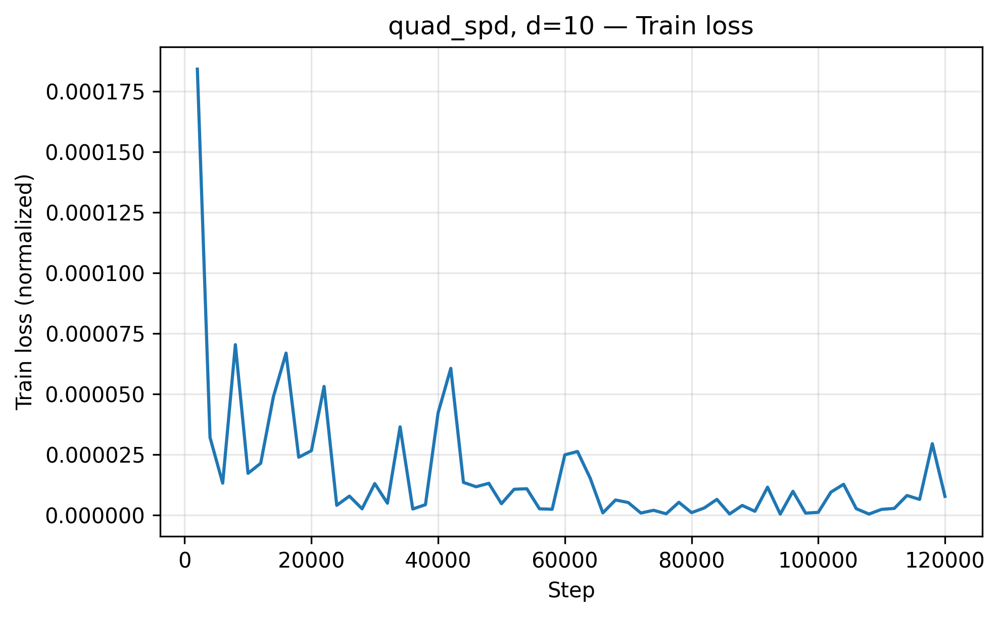

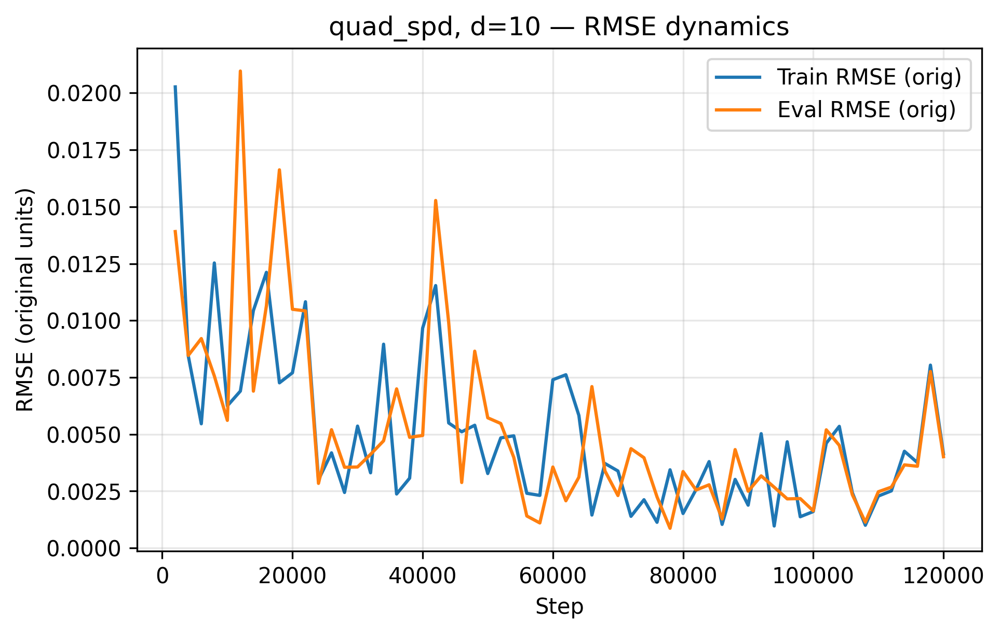

[csv] saved dlt_outputs/history_quad_spd_d10.csv

================= quad_spd — d=20 =================
Quadratic SPD: ||Q||₂≈1.010, κ=72.80; features: z = Q^-0.5 y (+ z^2)
Model:    ResNet(width=512, depth=5), params=2.66M
Sampler:  MACRO | batch=1280 (B_macro) | steps=180000 | lr=1.00e-03
[  1.7%] train loss=5.428e-05 | train RMSE=1.386e-02 | eval RMSE=1.311e-02 (rel=9.784e-03, tstd=1.340e+00) | calib RNMSE≈1.042e-02, σ_t≈1.331e+00, RNMSE×σ_t≈1.386e-02
[  3.3%] train loss=2.273e-04 | train RMSE=2.838e-02 | eval RMSE=2.586e-02 (rel=1.923e-02, tstd=1.345e+00) | calib RNMSE≈2.132e-02, σ_t≈1.331e+00, RNMSE×σ_t≈2.838e-02
[  5.0%] train loss=8.412e-04 | train RMSE=5.464e-02 | eval RMSE=3.777e-02 (rel=2.870e-02, tstd=1.316e+00) | calib RNMSE≈4.102e-02, σ_t≈1.332e+00, RNMSE×σ_t≈5.464e-02
[  6.7%] train loss=1.425e-04 | train RMSE=2.244e-02 | eval RMSE=2.544e-02 (rel=1.936e-02, tstd=1.314e+00) | calib RNMSE≈1.688e-02, σ_t≈1.329e+00, RNMSE×σ_t≈2.244e-02
[  8.3%] train loss=9.081e-05 | train RMSE

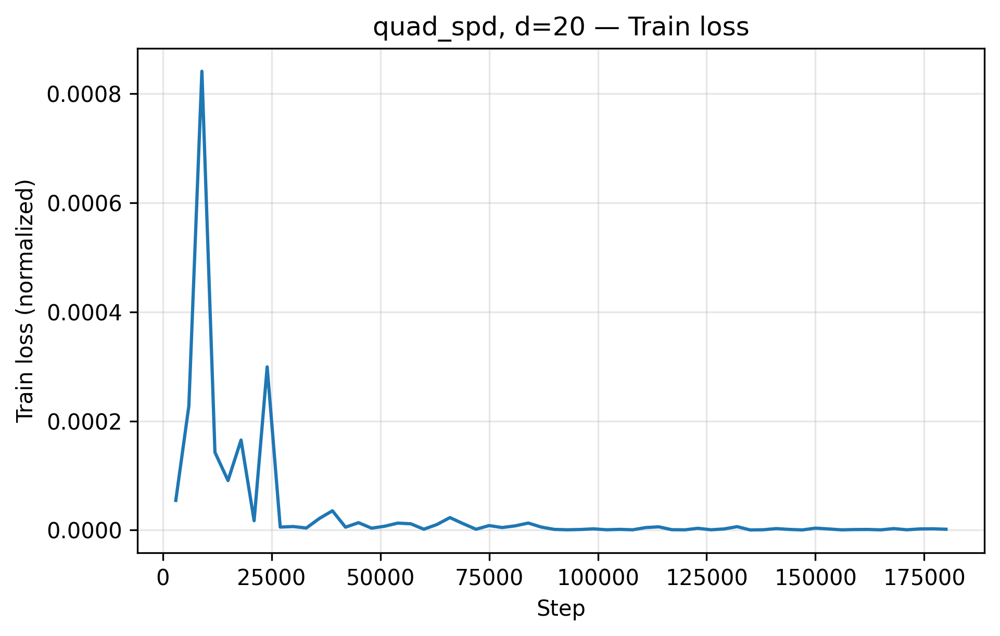

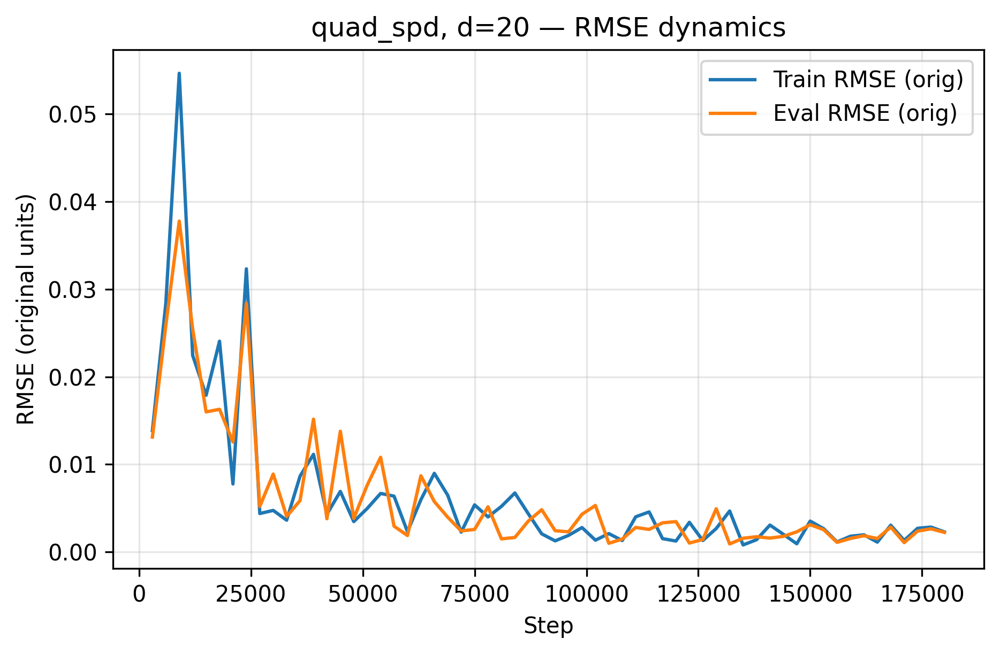

[csv] saved dlt_outputs/history_quad_spd_d20.csv

================= quad_spd — d=50 =================
Quadratic SPD: ||Q||₂≈1.010, κ=100.13; features: z = Q^-0.5 y (+ z^2)
Model:    ResNet(width=768, depth=6), params=7.19M
Sampler:  MACRO | batch=3200 (B_macro) | steps=240000 | lr=1.00e-03
[  1.7%] train loss=1.101e-04 | train RMSE=2.892e-02 | eval RMSE=2.501e-02 (rel=1.293e-02, tstd=1.935e+00) | calib RNMSE≈1.484e-02, σ_t≈1.949e+00, RNMSE×σ_t≈2.892e-02
[  3.3%] train loss=1.627e-04 | train RMSE=3.513e-02 | eval RMSE=1.667e-02 (rel=8.646e-03, tstd=1.928e+00) | calib RNMSE≈1.804e-02, σ_t≈1.947e+00, RNMSE×σ_t≈3.513e-02
[  5.0%] train loss=4.338e-05 | train RMSE=1.818e-02 | eval RMSE=1.901e-02 (rel=9.697e-03, tstd=1.960e+00) | calib RNMSE≈9.314e-03, σ_t≈1.952e+00, RNMSE×σ_t≈1.818e-02
[  6.7%] train loss=2.236e-04 | train RMSE=4.121e-02 | eval RMSE=4.028e-02 (rel=2.067e-02, tstd=1.949e+00) | calib RNMSE≈2.115e-02, σ_t≈1.949e+00, RNMSE×σ_t≈4.121e-02
[  8.3%] train loss=2.195e-04 | train RMS

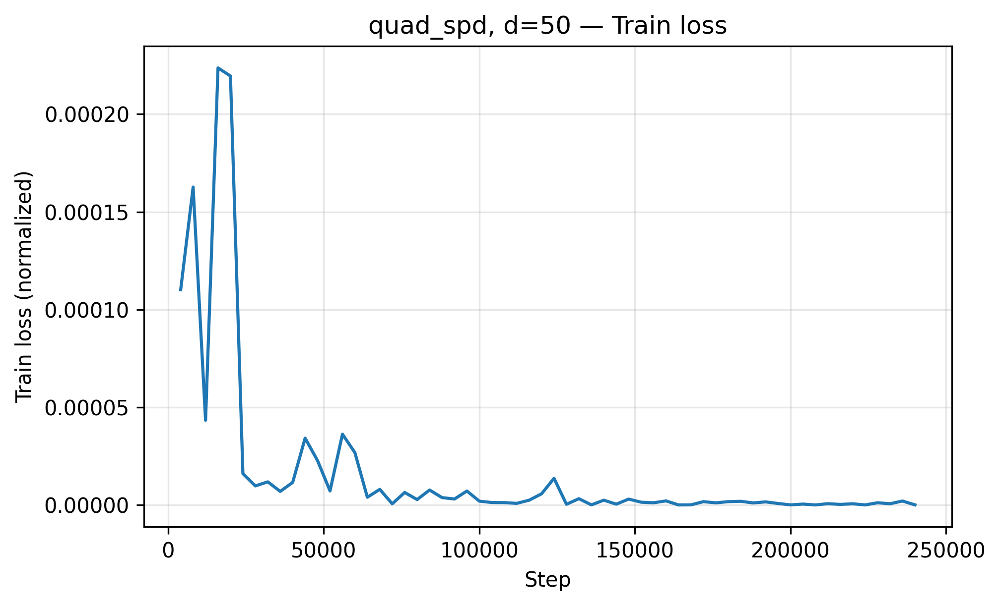

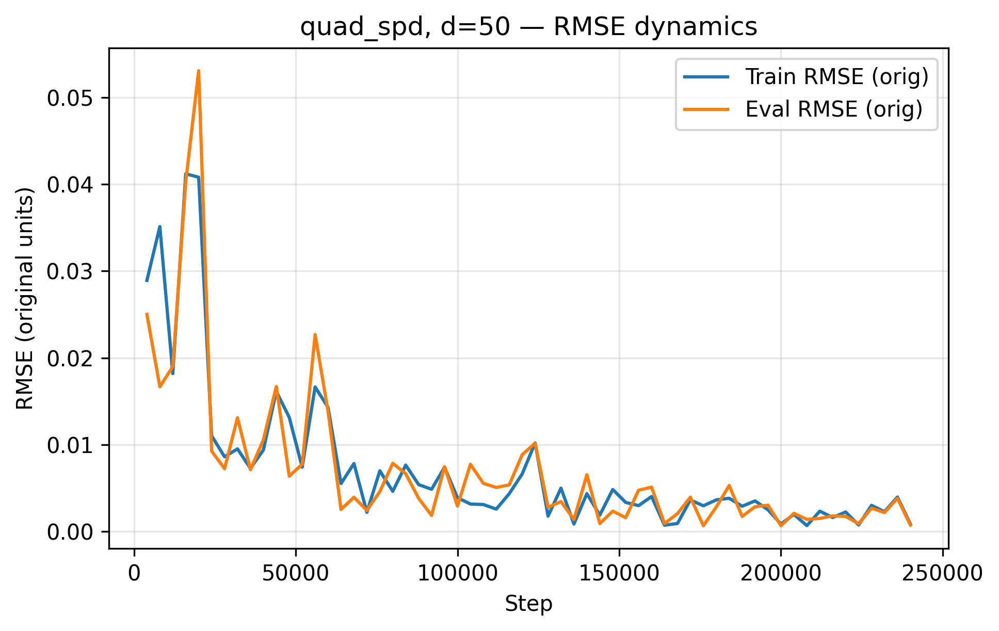

[csv] saved dlt_outputs/history_quad_spd_d50.csv

================= exp_minus_lin — d=10 =================
Exp−Linear: unit a,b; analytic μ(y), rank-1 cov + εI; symmetric whitening (+ z^2)
Model:    ResNet(width=384, depth=4), params=1.20M
Sampler:  MACRO | batch=640 (B_macro) | steps=120000 | lr=1.00e-03
[  1.7%] train loss=7.322e-04 | train RMSE=1.436e-01 | eval RMSE=1.044e+00 (rel=2.850e-01, tstd=3.664e+00) | calib RNMSE≈3.827e-02, σ_t≈3.754e+00, RNMSE×σ_t≈1.436e-01
[  3.3%] train loss=2.193e-04 | train RMSE=7.499e-02 | eval RMSE=7.871e-02 (rel=2.080e-02, tstd=3.784e+00) | calib RNMSE≈2.094e-02, σ_t≈3.581e+00, RNMSE×σ_t≈7.499e-02
[  5.0%] train loss=1.568e-03 | train RMSE=2.005e-01 | eval RMSE=1.107e-01 (rel=2.938e-02, tstd=3.769e+00) | calib RNMSE≈5.600e-02, σ_t≈3.581e+00, RNMSE×σ_t≈2.005e-01
[  6.7%] train loss=7.375e-04 | train RMSE=1.429e-01 | eval RMSE=6.849e-02 (rel=1.605e-02, tstd=4.269e+00) | calib RNMSE≈3.841e-02, σ_t≈3.720e+00, RNMSE×σ_t≈1.429e-01
[  8.3%] train loss=2.397

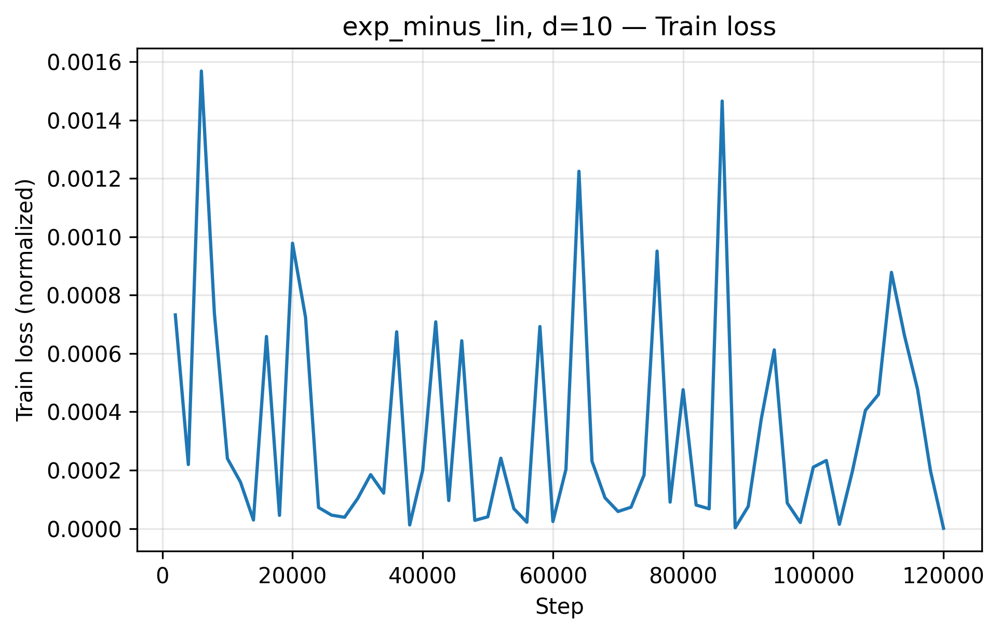

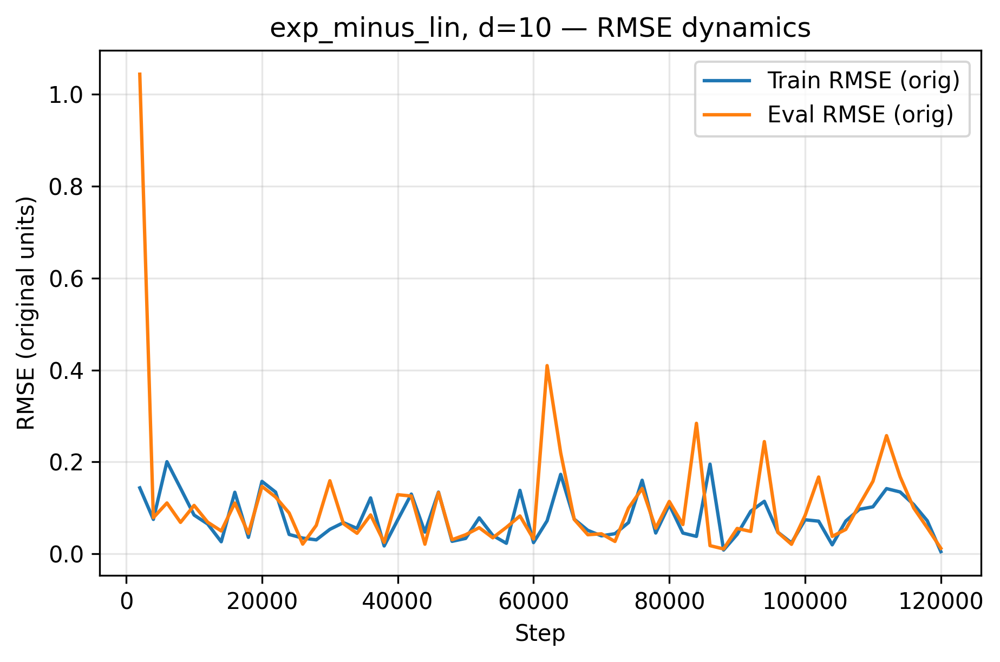

[csv] saved dlt_outputs/history_exp_minus_lin_d10.csv

================= exp_minus_lin — d=20 =================
Exp−Linear: unit a,b; analytic μ(y), rank-1 cov + εI; symmetric whitening (+ z^2)
Model:    ResNet(width=512, depth=5), params=2.66M
Sampler:  MACRO | batch=1280 (B_macro) | steps=180000 | lr=1.00e-03
[  1.7%] train loss=1.671e-02 | train RMSE=6.773e-01 | eval RMSE=6.059e-01 (rel=1.851e-01, tstd=3.274e+00) | calib RNMSE≈1.828e-01, σ_t≈3.706e+00, RNMSE×σ_t≈6.773e-01
[  3.3%] train loss=3.803e-04 | train RMSE=9.904e-02 | eval RMSE=1.041e-01 (rel=2.750e-02, tstd=3.785e+00) | calib RNMSE≈2.758e-02, σ_t≈3.591e+00, RNMSE×σ_t≈9.904e-02
[  5.0%] train loss=2.044e-04 | train RMSE=7.386e-02 | eval RMSE=1.937e-01 (rel=4.266e-02, tstd=4.540e+00) | calib RNMSE≈2.022e-02, σ_t≈3.653e+00, RNMSE×σ_t≈7.386e-02
[  6.7%] train loss=1.931e-04 | train RMSE=7.041e-02 | eval RMSE=8.340e-02 (rel=2.332e-02, tstd=3.577e+00) | calib RNMSE≈1.965e-02, σ_t≈3.582e+00, RNMSE×σ_t≈7.041e-02
[  8.3%] train loss

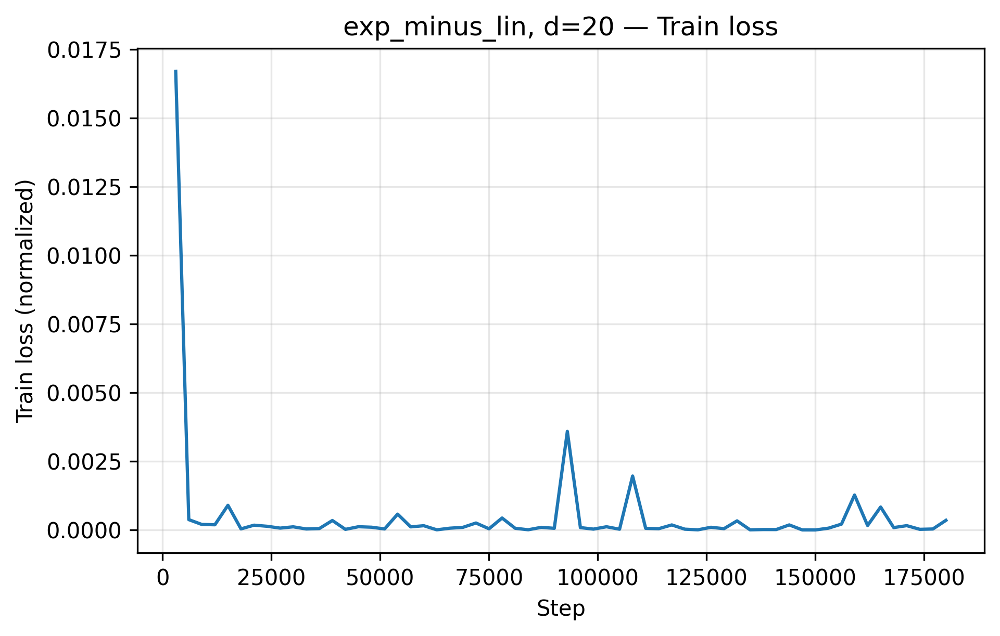

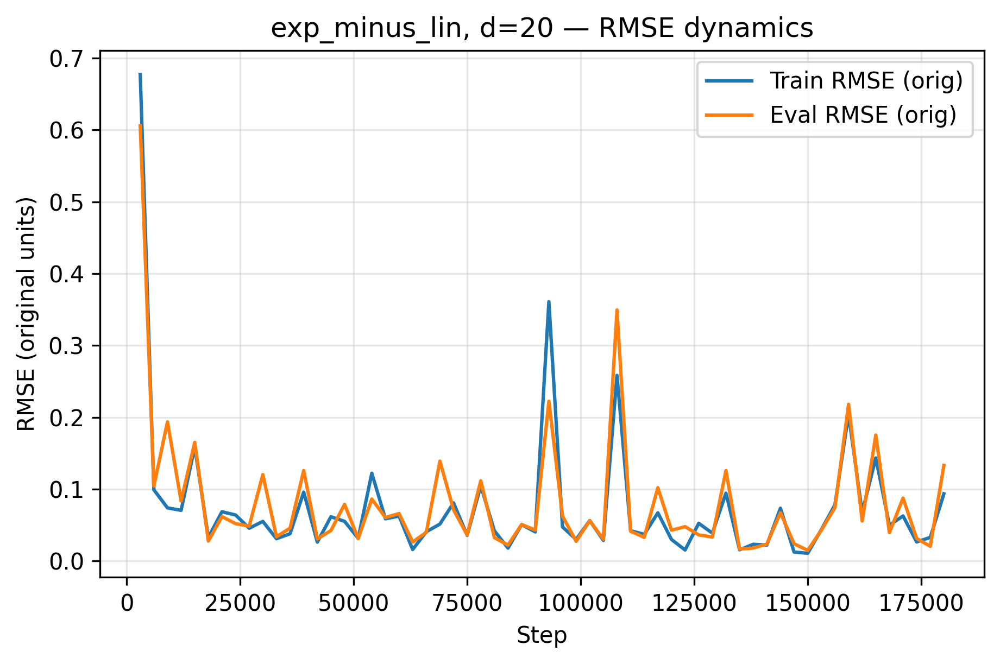

[csv] saved dlt_outputs/history_exp_minus_lin_d20.csv

================= exp_minus_lin — d=50 =================
Exp−Linear: unit a,b; analytic μ(y), rank-1 cov + εI; symmetric whitening (+ z^2)
Model:    ResNet(width=768, depth=6), params=7.19M
Sampler:  MACRO | batch=3200 (B_macro) | steps=240000 | lr=1.00e-03
[  1.7%] train loss=3.656e-03 | train RMSE=3.357e-01 | eval RMSE=1.470e-01 (rel=4.095e-02, tstd=3.591e+00) | calib RNMSE≈8.551e-02, σ_t≈3.925e+00, RNMSE×σ_t≈3.357e-01
[  3.3%] train loss=3.463e-05 | train RMSE=3.146e-02 | eval RMSE=8.704e-02 (rel=2.279e-02, tstd=3.819e+00) | calib RNMSE≈8.322e-03, σ_t≈3.780e+00, RNMSE×σ_t≈3.146e-02
[  5.0%] train loss=3.252e-05 | train RMSE=2.915e-02 | eval RMSE=5.378e-02 (rel=1.667e-02, tstd=3.227e+00) | calib RNMSE≈8.064e-03, σ_t≈3.615e+00, RNMSE×σ_t≈2.915e-02
[  6.7%] train loss=2.594e-04 | train RMSE=8.589e-02 | eval RMSE=1.053e-01 (rel=3.169e-02, tstd=3.324e+00) | calib RNMSE≈2.278e-02, σ_t≈3.771e+00, RNMSE×σ_t≈8.589e-02
[  8.3%] train loss

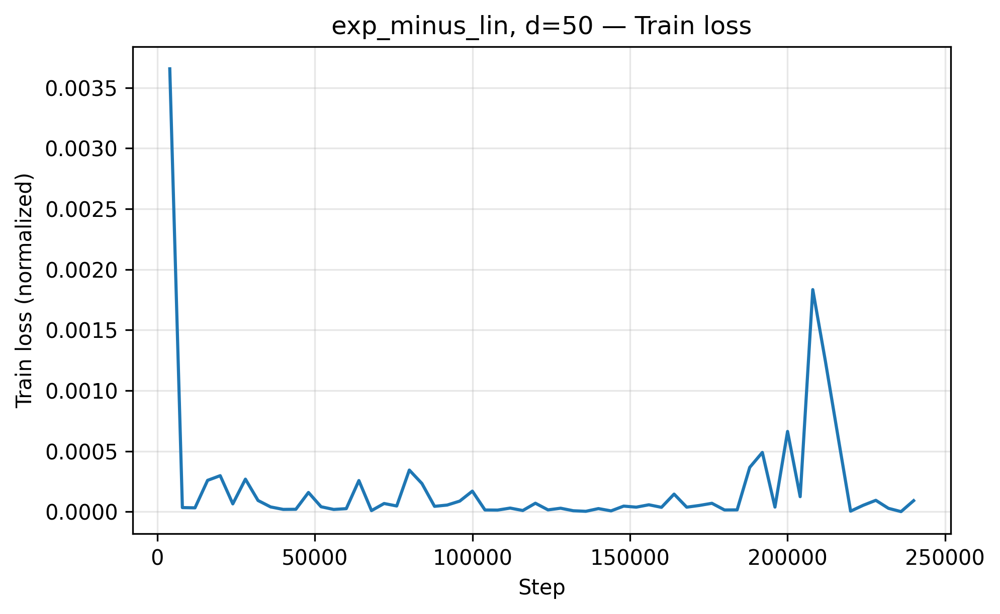

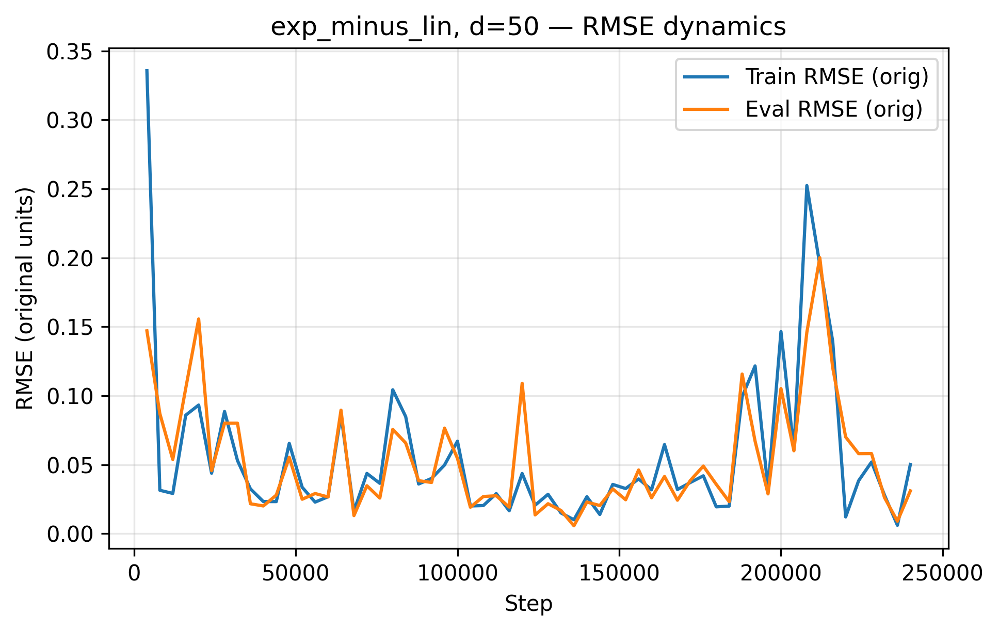

[csv] saved dlt_outputs/history_exp_minus_lin_d50.csv
ICNN pre-learn → quadratic: steps=50000, batch=2048, lr=1.00e-03, ||Q||₂≈1.010, κ=59.96, ridge=0.01
[pre  20.0%] train MSE=3.688e-03 | eval RMSE=5.953e-02
[pre  40.0%] train MSE=8.376e-04 | eval RMSE=2.773e-02
[pre  60.0%] train MSE=3.116e-04 | eval RMSE=1.804e-02
[pre  80.0%] train MSE=2.339e-04 | eval RMSE=1.542e-02
[pre 100.0%] train MSE=2.440e-04 | eval RMSE=1.521e-02
ICNN pre-learn done in 95.8s

================= rand_icnn2 — d=10 =================
ICNN(2) prelearn 50000 steps; median||y|| target=3.00 (obs=1.46 → scale=2.05); symmetric whitening
Model:    ResNet(width=384, depth=4), params=1.20M
Sampler:  MACRO | batch=640 (B_macro) | steps=120000 | lr=1.00e-03
[  1.7%] train loss=3.144e-03 | train RMSE=2.837e-01 | eval RMSE=2.678e-01 (rel=7.518e-02, tstd=3.562e+00) | calib RNMSE≈7.930e-02, σ_t≈3.578e+00, RNMSE×σ_t≈2.837e-01
[  3.3%] train loss=8.835e-04 | train RMSE=1.495e-01 | eval RMSE=1.187e-01 (rel=3.323e-02, tstd=3.573e+

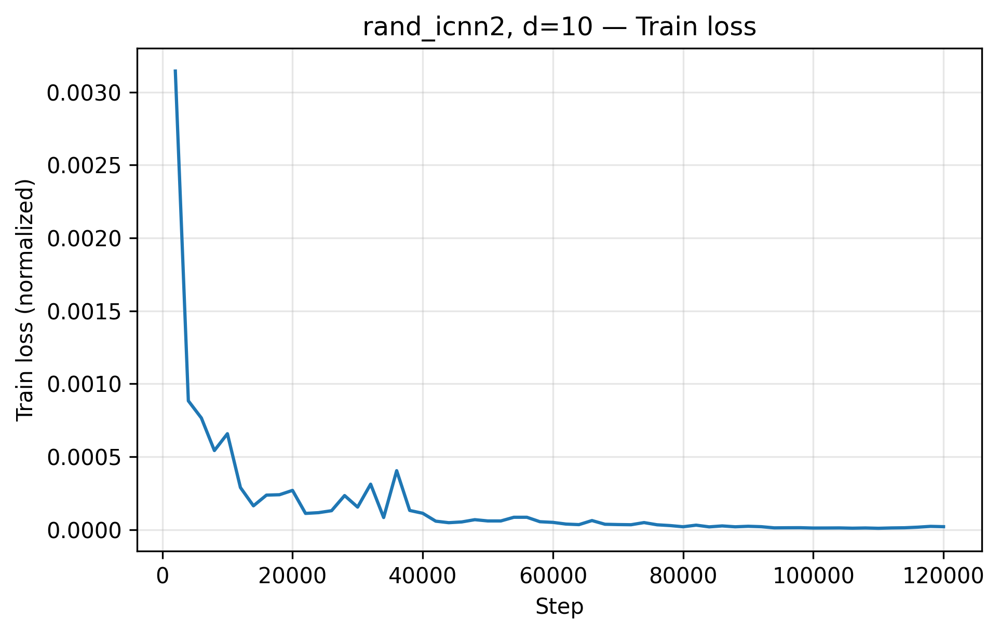

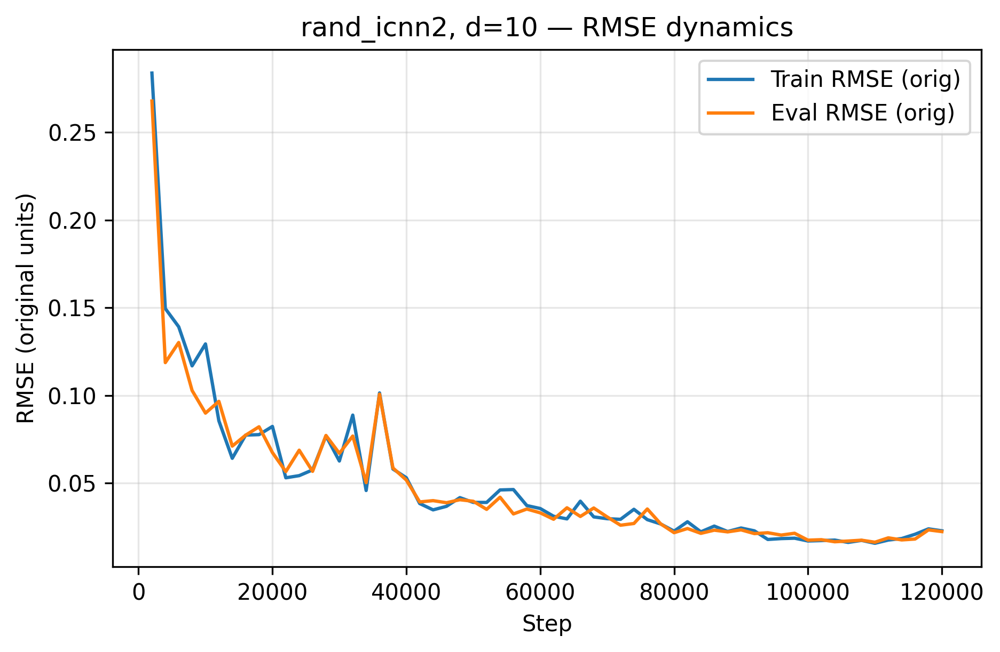

[csv] saved dlt_outputs/history_rand_icnn2_d10.csv
ICNN pre-learn → quadratic: steps=50000, batch=2048, lr=1.00e-03, ||Q||₂≈1.010, κ=79.28, ridge=0.01
[pre  20.0%] train MSE=4.582e-03 | eval RMSE=6.878e-02
[pre  40.0%] train MSE=2.175e-03 | eval RMSE=4.810e-02
[pre  60.0%] train MSE=1.374e-03 | eval RMSE=3.727e-02
[pre  80.0%] train MSE=1.084e-03 | eval RMSE=3.183e-02
[pre 100.0%] train MSE=1.006e-03 | eval RMSE=3.196e-02
ICNN pre-learn done in 93.8s

================= rand_icnn2 — d=20 =================
ICNN(2) prelearn 50000 steps; median||y|| target=3.00 (obs=1.82 → scale=1.65); symmetric whitening
Model:    ResNet(width=512, depth=5), params=2.66M
Sampler:  MACRO | batch=1280 (B_macro) | steps=180000 | lr=1.00e-03
[  1.7%] train loss=1.096e-03 | train RMSE=1.473e-01 | eval RMSE=1.641e-01 (rel=5.243e-02, tstd=3.131e+00) | calib RNMSE≈4.683e-02, σ_t≈3.145e+00, RNMSE×σ_t≈1.473e-01
[  3.3%] train loss=9.317e-04 | train RMSE=1.359e-01 | eval RMSE=1.331e-01 (rel=4.218e-02, tstd=3.156e+00

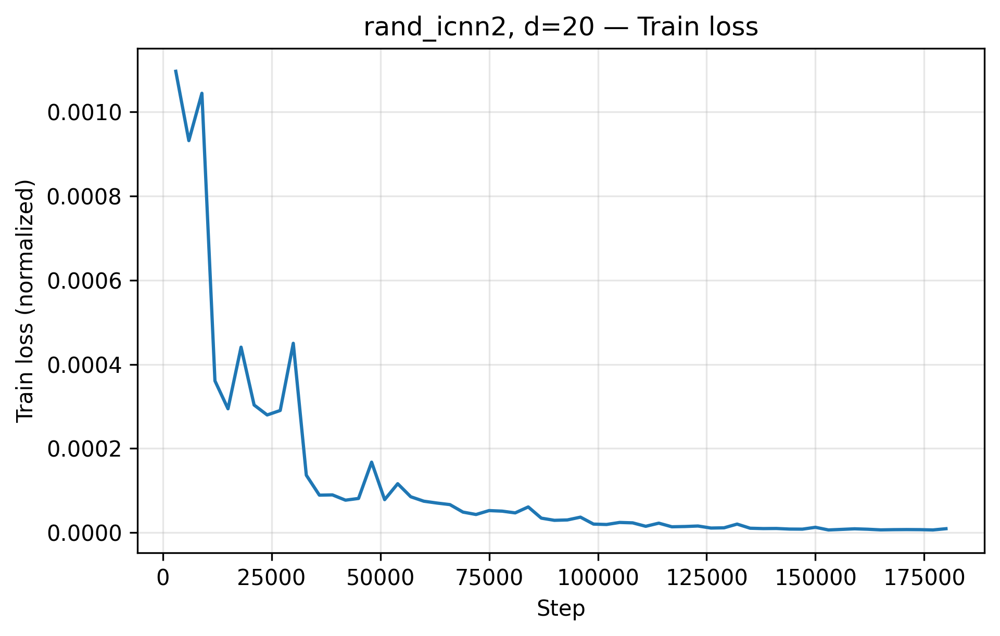

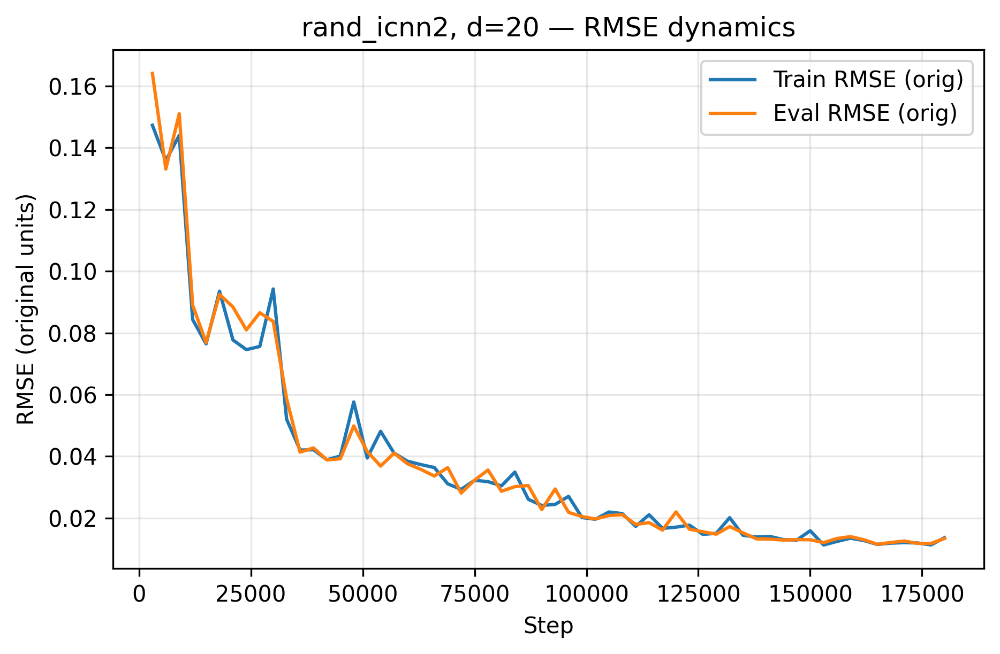

[csv] saved dlt_outputs/history_rand_icnn2_d20.csv
ICNN pre-learn → quadratic: steps=50000, batch=2048, lr=1.00e-03, ||Q||₂≈1.010, κ=100.92, ridge=0.01
[pre  20.0%] train MSE=1.507e-02 | eval RMSE=1.210e-01
[pre  40.0%] train MSE=8.627e-03 | eval RMSE=9.271e-02
[pre  60.0%] train MSE=6.389e-03 | eval RMSE=7.703e-02
[pre  80.0%] train MSE=5.666e-03 | eval RMSE=7.197e-02
[pre 100.0%] train MSE=5.375e-03 | eval RMSE=7.065e-02
ICNN pre-learn done in 95.3s

================= rand_icnn2 — d=50 =================
ICNN(2) prelearn 50000 steps; median||y|| target=3.00 (obs=2.64 → scale=1.14); symmetric whitening
Model:    ResNet(width=768, depth=6), params=7.19M
Sampler:  MACRO | batch=3200 (B_macro) | steps=240000 | lr=1.00e-03
[  1.7%] train loss=9.182e-03 | train RMSE=4.169e-01 | eval RMSE=4.195e-01 (rel=1.359e-01, tstd=3.087e+00) | calib RNMSE≈1.355e-01, σ_t≈3.076e+00, RNMSE×σ_t≈4.169e-01
[  3.3%] train loss=1.212e-03 | train RMSE=1.513e-01 | eval RMSE=1.743e-01 (rel=5.637e-02, tstd=3.093e+0

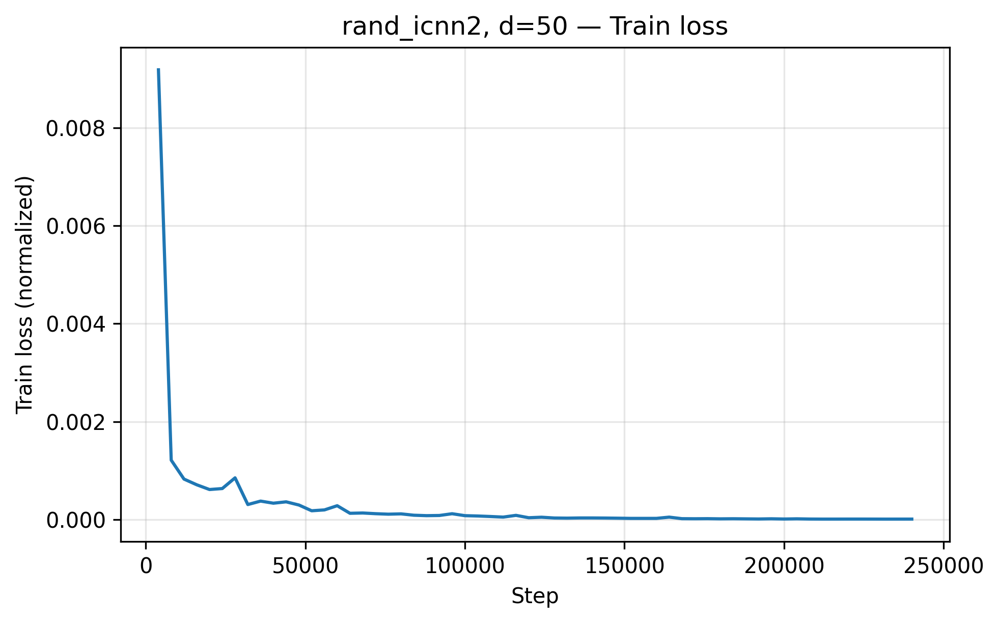

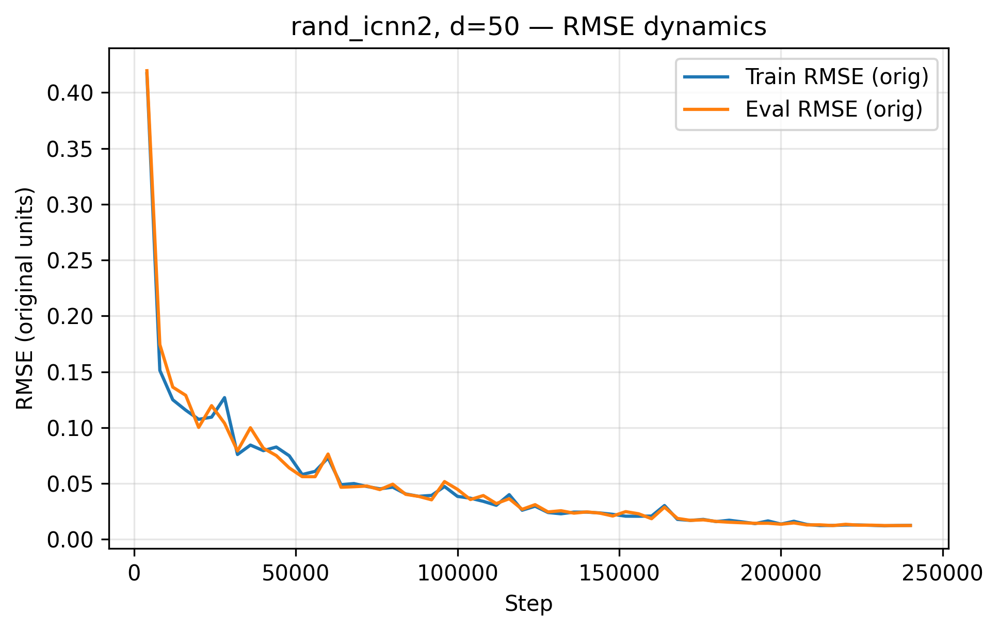

[csv] saved dlt_outputs/history_rand_icnn2_d50.csv

================= softplus_pairs — d=10 =================
Coupled Soft-plus: x_scale=1.0, block=64; symmetric whitening
Model:    ResNet(width=384, depth=4), params=1.20M
Sampler:  MACRO | batch=640 (B_macro) | steps=120000 | lr=1.00e-03
[  1.7%] train loss=1.937e-04 | train RMSE=4.322e-02 | eval RMSE=4.335e-02 (rel=1.966e-02, tstd=2.204e+00) | calib RNMSE≈1.968e-02, σ_t≈2.196e+00, RNMSE×σ_t≈4.322e-02
[  3.3%] train loss=8.539e-04 | train RMSE=9.035e-02 | eval RMSE=6.846e-02 (rel=3.139e-02, tstd=2.181e+00) | calib RNMSE≈4.132e-02, σ_t≈2.186e+00, RNMSE×σ_t≈9.035e-02
[  5.0%] train loss=9.428e-04 | train RMSE=9.501e-02 | eval RMSE=1.095e-01 (rel=5.048e-02, tstd=2.169e+00) | calib RNMSE≈4.342e-02, σ_t≈2.188e+00, RNMSE×σ_t≈9.501e-02
[  6.7%] train loss=3.396e-04 | train RMSE=5.701e-02 | eval RMSE=4.602e-02 (rel=2.098e-02, tstd=2.194e+00) | calib RNMSE≈2.606e-02, σ_t≈2.188e+00, RNMSE×σ_t≈5.701e-02
[  8.3%] train loss=5.457e-05 | train RMSE

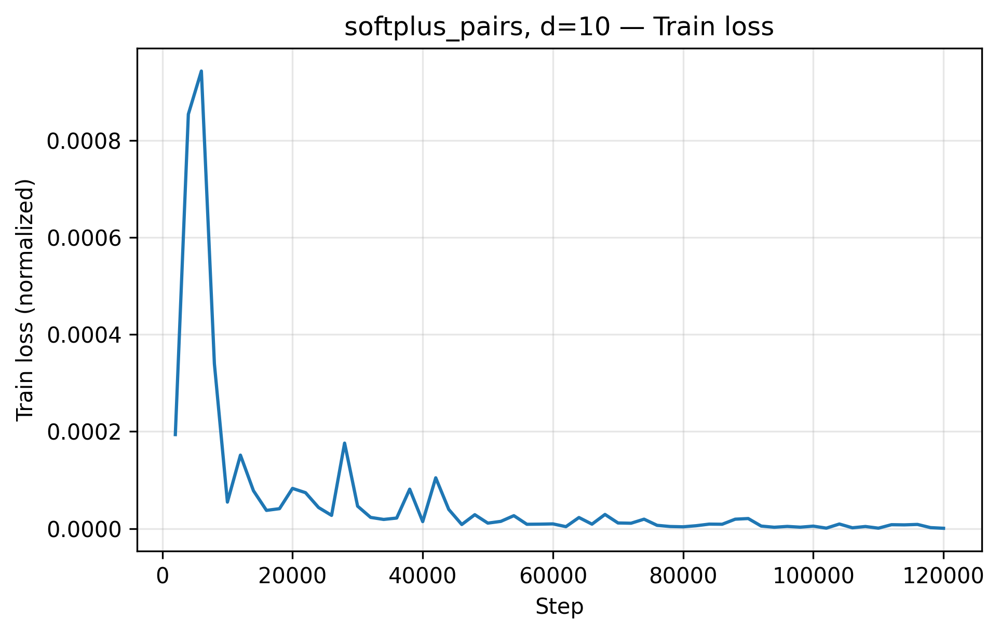

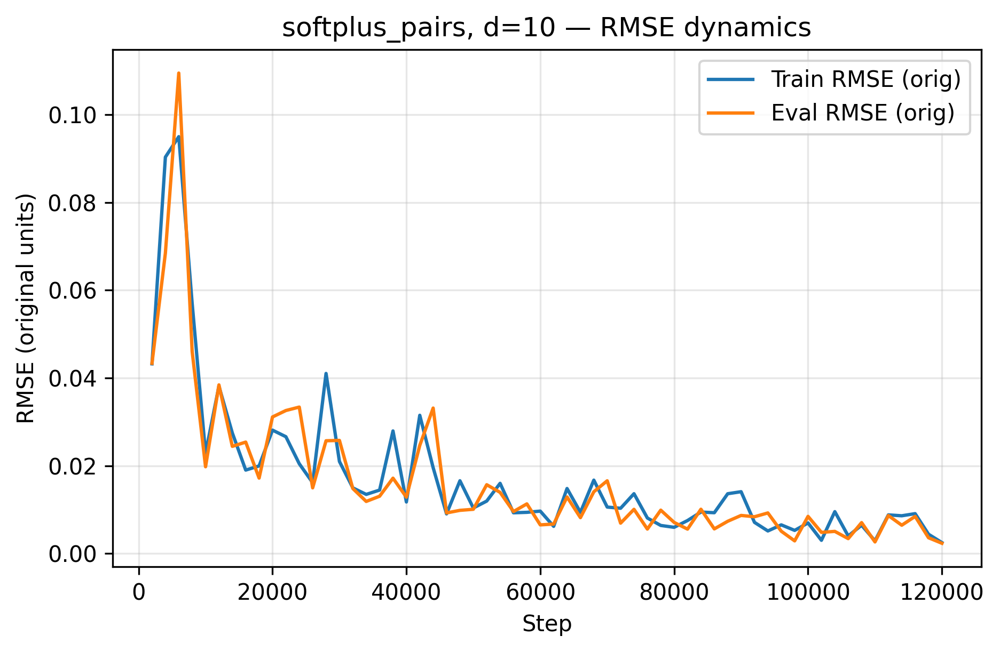

[csv] saved dlt_outputs/history_softplus_pairs_d10.csv

================= softplus_pairs — d=20 =================
Coupled Soft-plus: x_scale=1.0, block=64; symmetric whitening
Model:    ResNet(width=512, depth=5), params=2.66M
Sampler:  MACRO | batch=1280 (B_macro) | steps=180000 | lr=1.00e-03
[  1.7%] train loss=2.330e-04 | train RMSE=1.364e-01 | eval RMSE=1.441e-01 (rel=2.252e-02, tstd=6.401e+00) | calib RNMSE≈2.159e-02, σ_t≈6.318e+00, RNMSE×σ_t≈1.364e-01
[  3.3%] train loss=2.300e-04 | train RMSE=1.358e-01 | eval RMSE=1.369e-01 (rel=2.139e-02, tstd=6.398e+00) | calib RNMSE≈2.145e-02, σ_t≈6.329e+00, RNMSE×σ_t≈1.358e-01
[  5.0%] train loss=4.496e-04 | train RMSE=1.897e-01 | eval RMSE=2.221e-01 (rel=3.474e-02, tstd=6.392e+00) | calib RNMSE≈2.999e-02, σ_t≈6.324e+00, RNMSE×σ_t≈1.897e-01
[  6.7%] train loss=3.149e-04 | train RMSE=1.589e-01 | eval RMSE=1.961e-01 (rel=3.115e-02, tstd=6.296e+00) | calib RNMSE≈2.510e-02, σ_t≈6.332e+00, RNMSE×σ_t≈1.589e-01
[  8.3%] train loss=2.464e-04 | train

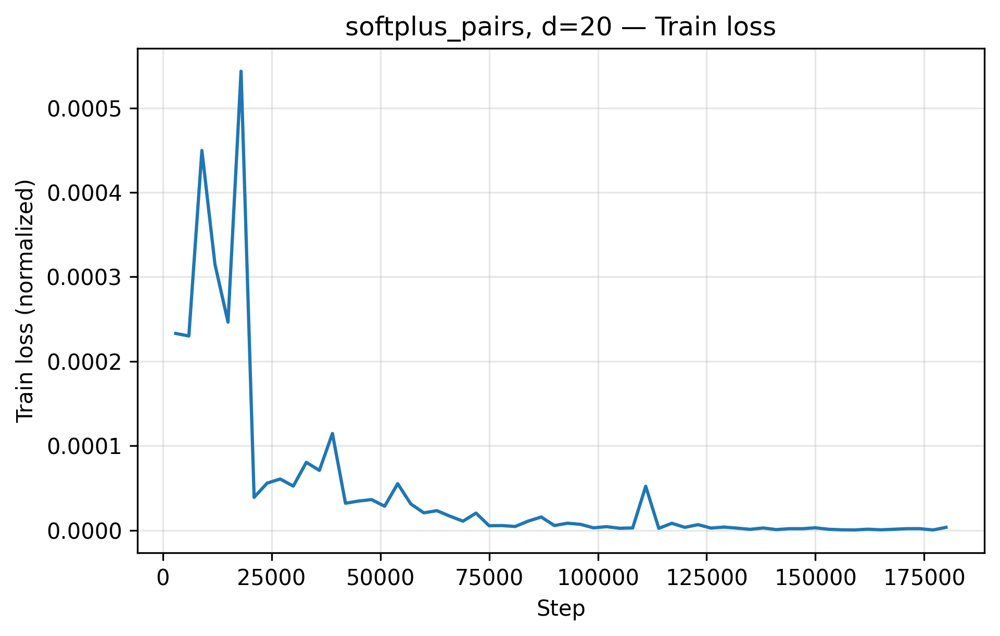

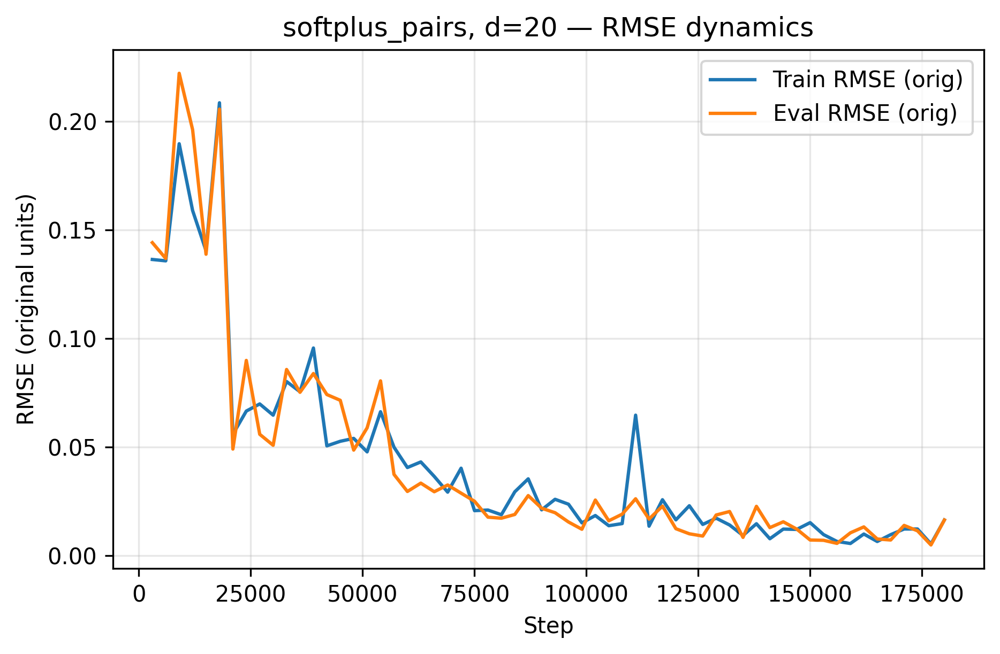

[csv] saved dlt_outputs/history_softplus_pairs_d20.csv

================= softplus_pairs — d=50 =================
Coupled Soft-plus: x_scale=1.0, block=64; symmetric whitening
Model:    ResNet(width=768, depth=6), params=7.19M
Sampler:  MACRO | batch=3200 (B_macro) | steps=240000 | lr=1.00e-03
[  1.7%] train loss=6.004e-03 | train RMSE=2.779e+00 | eval RMSE=2.882e+00 (rel=1.134e-01, tstd=2.542e+01) | calib RNMSE≈1.096e-01, σ_t≈2.536e+01, RNMSE×σ_t≈2.779e+00
[  3.3%] train loss=1.693e-03 | train RMSE=1.474e+00 | eval RMSE=1.553e+00 (rel=6.144e-02, tstd=2.527e+01) | calib RNMSE≈5.819e-02, σ_t≈2.533e+01, RNMSE×σ_t≈1.474e+00
[  5.0%] train loss=6.754e-04 | train RMSE=9.314e-01 | eval RMSE=8.834e-01 (rel=3.485e-02, tstd=2.535e+01) | calib RNMSE≈3.675e-02, σ_t≈2.534e+01, RNMSE×σ_t≈9.314e-01
[  6.7%] train loss=1.469e-04 | train RMSE=4.334e-01 | eval RMSE=4.573e-01 (rel=1.798e-02, tstd=2.543e+01) | calib RNMSE≈1.714e-02, σ_t≈2.528e+01, RNMSE×σ_t≈4.334e-01
[  8.3%] train loss=3.871e-04 | train

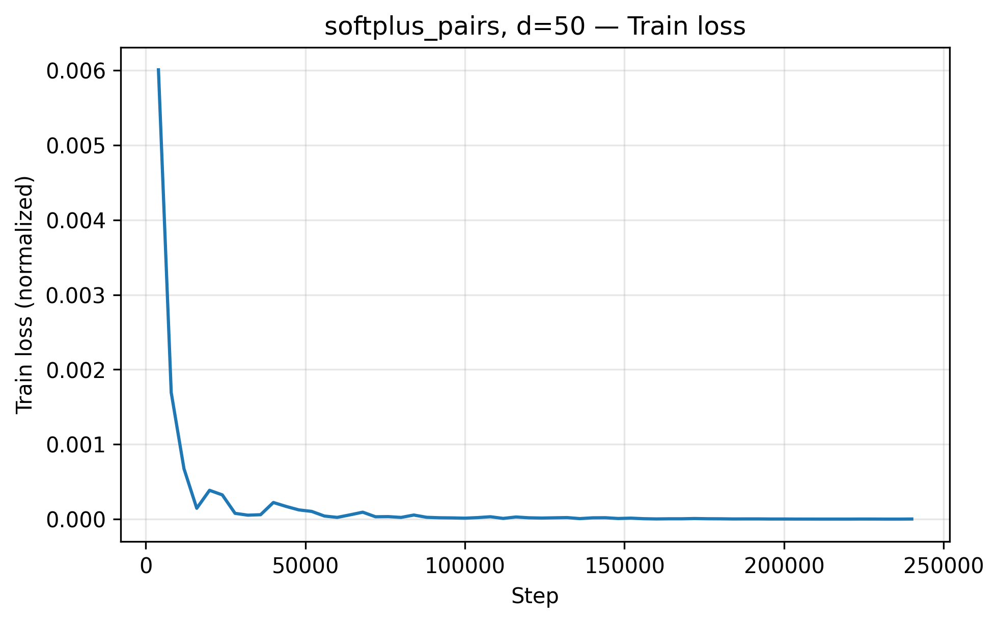

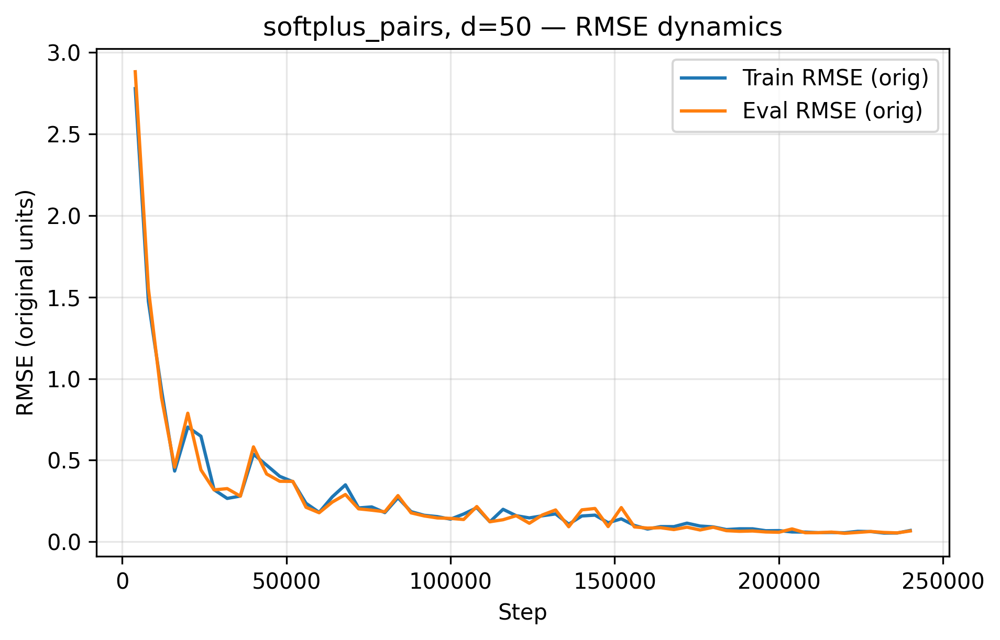

[csv] saved dlt_outputs/history_softplus_pairs_d50.csv

============================ TRIAL 2/3 (seed=1000045) ============================

================= quad_spd — d=10 =================
Quadratic SPD: ||Q||₂≈1.010, κ=66.89; features: z = Q^-0.5 y (+ z^2)
Model:    ResNet(width=384, depth=4), params=1.20M
Sampler:  MACRO | batch=640 (B_macro) | steps=120000 | lr=1.00e-03
[  1.7%] train loss=1.755e-05 | train RMSE=7.275e-03 | eval RMSE=1.217e-02 (rel=9.835e-03, tstd=1.237e+00) | calib RNMSE≈5.925e-03, σ_t≈1.228e+00, RNMSE×σ_t≈7.275e-03
[  3.3%] train loss=1.059e-05 | train RMSE=5.615e-03 | eval RMSE=7.535e-03 (rel=6.113e-03, tstd=1.233e+00) | calib RNMSE≈4.603e-03, σ_t≈1.220e+00, RNMSE×σ_t≈5.615e-03
[  5.0%] train loss=7.026e-04 | train RMSE=4.637e-02 | eval RMSE=4.131e-02 (rel=3.335e-02, tstd=1.239e+00) | calib RNMSE≈3.748e-02, σ_t≈1.237e+00, RNMSE×σ_t≈4.637e-02
[  6.7%] train loss=2.033e-04 | train RMSE=2.472e-02 | eval RMSE=2.931e-02 (rel=2.384e-02, tstd=1.229e+00) | calib RNMSE

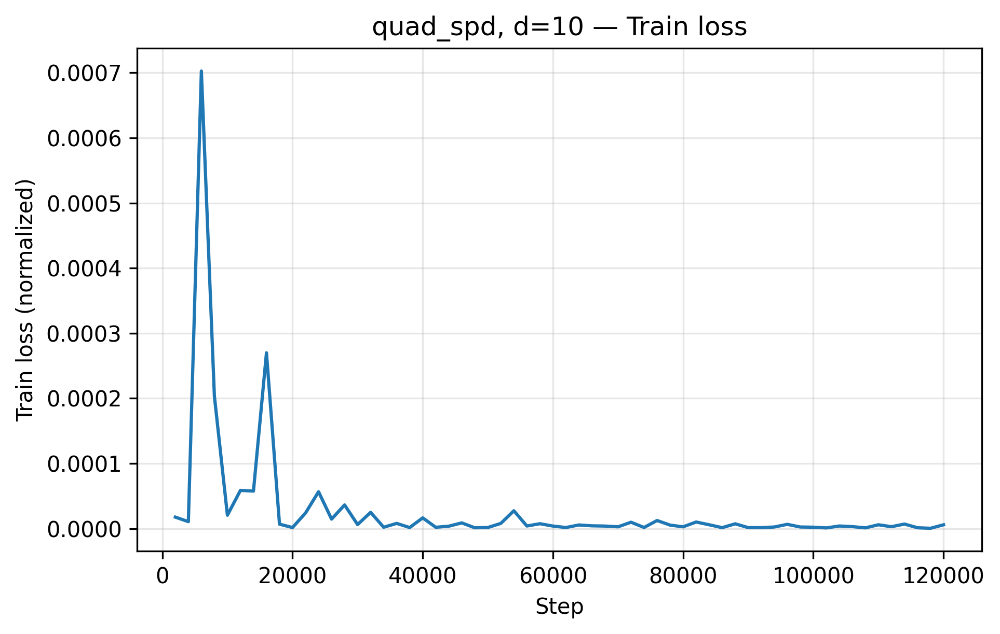

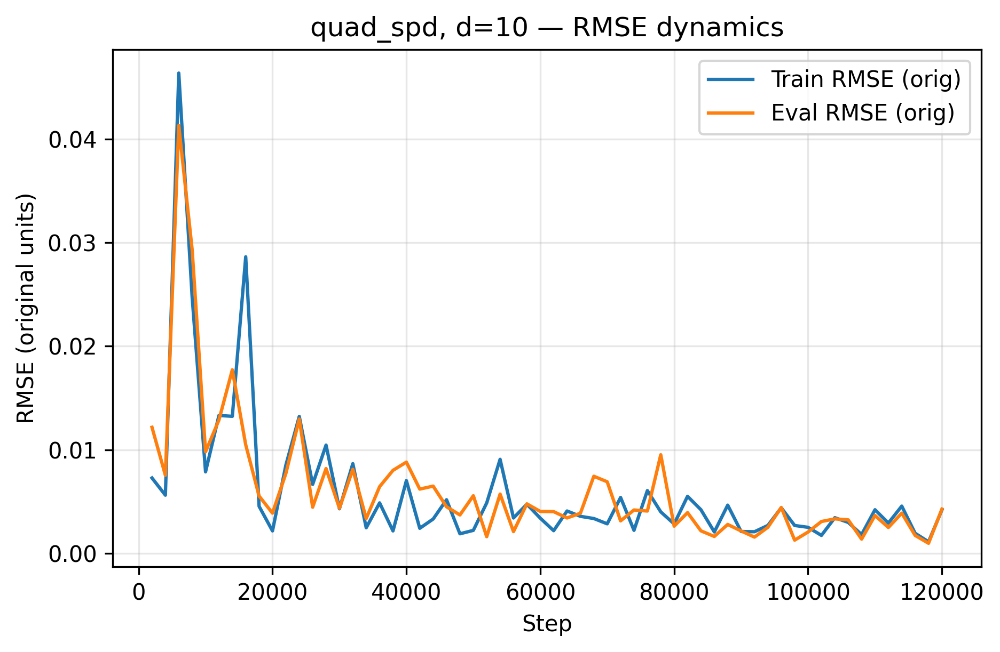

[csv] saved dlt_outputs/history_quad_spd_d10.csv

================= quad_spd — d=20 =================
Quadratic SPD: ||Q||₂≈1.010, κ=100.34; features: z = Q^-0.5 y (+ z^2)
Model:    ResNet(width=512, depth=5), params=2.66M
Sampler:  MACRO | batch=1280 (B_macro) | steps=180000 | lr=1.00e-03
[  1.7%] train loss=9.250e-05 | train RMSE=1.798e-02 | eval RMSE=1.765e-02 (rel=1.332e-02, tstd=1.325e+00) | calib RNMSE≈1.360e-02, σ_t≈1.322e+00, RNMSE×σ_t≈1.798e-02
[  3.3%] train loss=4.618e-05 | train RMSE=1.266e-02 | eval RMSE=1.625e-02 (rel=1.205e-02, tstd=1.349e+00) | calib RNMSE≈9.610e-03, σ_t≈1.318e+00, RNMSE×σ_t≈1.266e-02
[  5.0%] train loss=2.139e-04 | train RMSE=2.729e-02 | eval RMSE=2.759e-02 (rel=2.097e-02, tstd=1.316e+00) | calib RNMSE≈2.068e-02, σ_t≈1.319e+00, RNMSE×σ_t≈2.729e-02
[  6.7%] train loss=2.155e-04 | train RMSE=2.722e-02 | eval RMSE=3.159e-02 (rel=2.391e-02, tstd=1.321e+00) | calib RNMSE≈2.076e-02, σ_t≈1.311e+00, RNMSE×σ_t≈2.722e-02
[  8.3%] train loss=3.662e-05 | train RMS

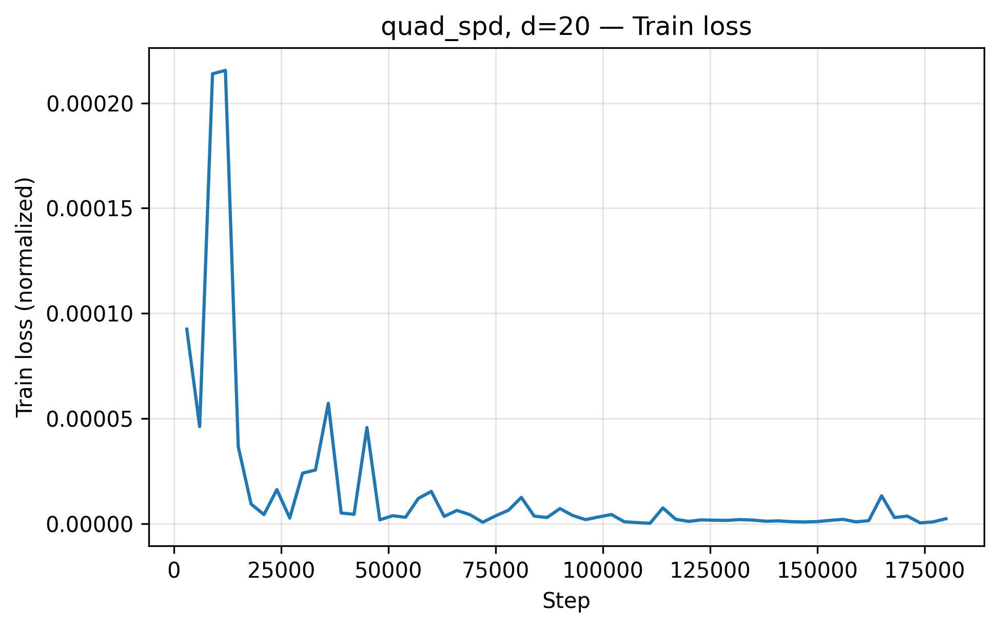

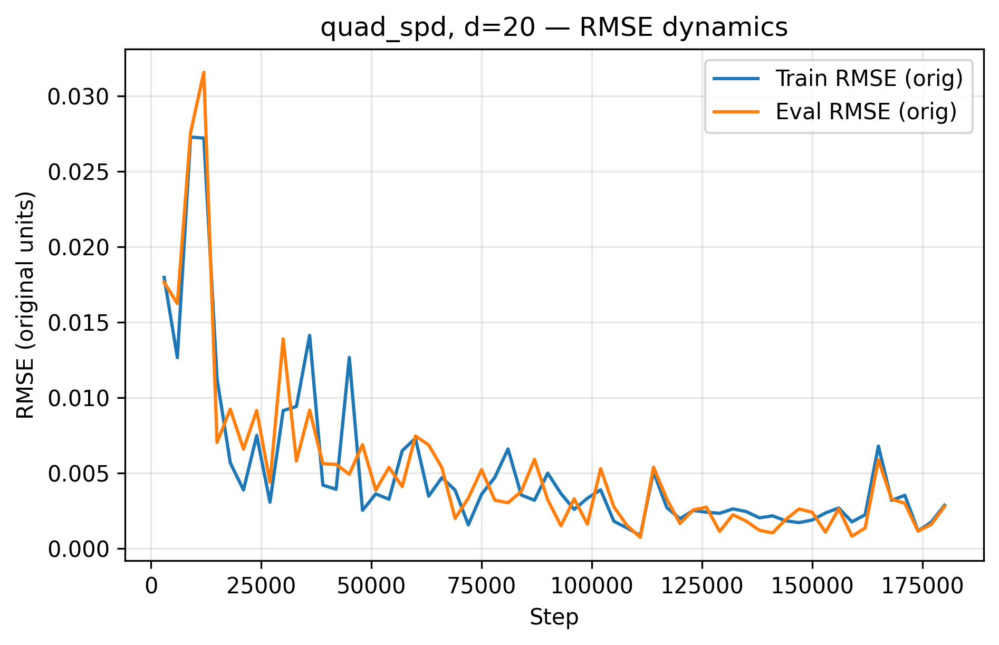

[csv] saved dlt_outputs/history_quad_spd_d20.csv

================= quad_spd — d=50 =================
Quadratic SPD: ||Q||₂≈1.010, κ=100.06; features: z = Q^-0.5 y (+ z^2)
Model:    ResNet(width=768, depth=6), params=7.19M
Sampler:  MACRO | batch=3200 (B_macro) | steps=240000 | lr=1.00e-03
[  1.7%] train loss=8.179e-05 | train RMSE=2.377e-02 | eval RMSE=2.293e-02 (rel=1.241e-02, tstd=1.847e+00) | calib RNMSE≈1.279e-02, σ_t≈1.859e+00, RNMSE×σ_t≈2.377e-02
[  3.3%] train loss=4.848e-05 | train RMSE=1.836e-02 | eval RMSE=1.967e-02 (rel=1.061e-02, tstd=1.854e+00) | calib RNMSE≈9.847e-03, σ_t≈1.865e+00, RNMSE×σ_t≈1.836e-02
[  5.0%] train loss=1.081e-05 | train RMSE=8.651e-03 | eval RMSE=7.163e-03 (rel=3.917e-03, tstd=1.829e+00) | calib RNMSE≈4.649e-03, σ_t≈1.861e+00, RNMSE×σ_t≈8.651e-03
[  6.7%] train loss=7.907e-06 | train RMSE=7.403e-03 | eval RMSE=7.676e-03 (rel=4.142e-03, tstd=1.853e+00) | calib RNMSE≈3.977e-03, σ_t≈1.862e+00, RNMSE×σ_t≈7.403e-03
[  8.3%] train loss=1.505e-05 | train RMS

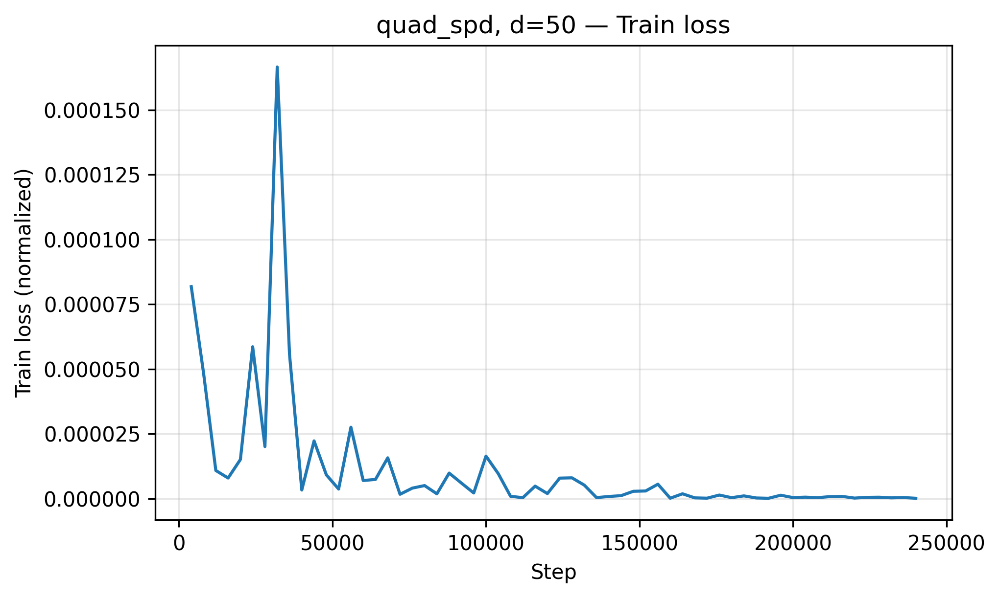

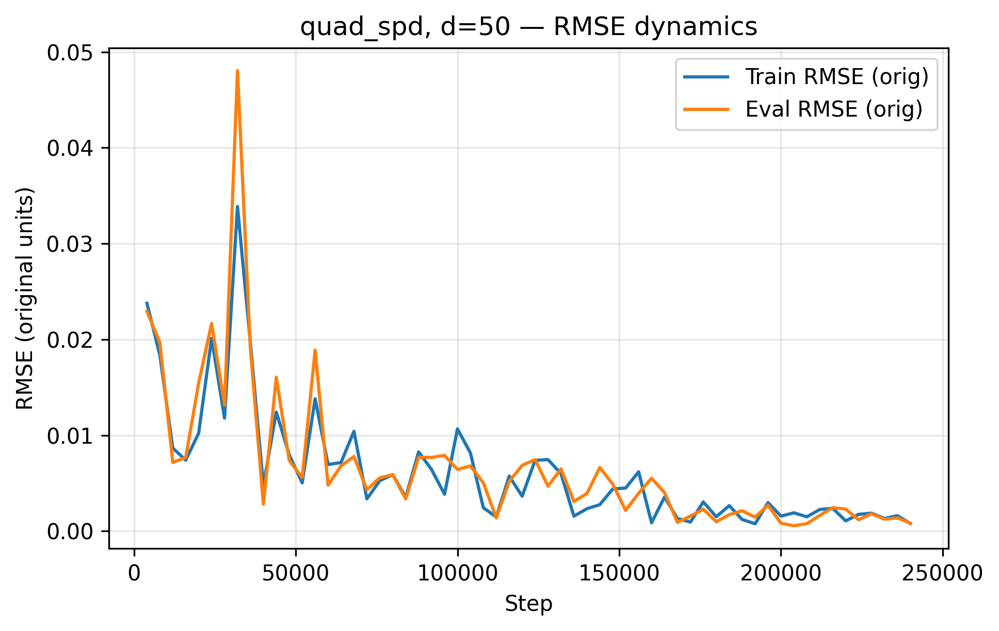

[csv] saved dlt_outputs/history_quad_spd_d50.csv

================= exp_minus_lin — d=10 =================
Exp−Linear: unit a,b; analytic μ(y), rank-1 cov + εI; symmetric whitening (+ z^2)
Model:    ResNet(width=384, depth=4), params=1.20M
Sampler:  MACRO | batch=640 (B_macro) | steps=120000 | lr=1.00e-03
[  1.7%] train loss=6.006e-03 | train RMSE=6.063e-01 | eval RMSE=7.314e-02 (rel=2.104e-02, tstd=3.476e+00) | calib RNMSE≈1.096e-01, σ_t≈3.649e+00, RNMSE×σ_t≈4.000e-01
[  3.3%] train loss=1.063e-04 | train RMSE=4.981e-02 | eval RMSE=5.698e-01 (rel=1.401e-01, tstd=4.068e+00) | calib RNMSE≈1.458e-02, σ_t≈3.417e+00, RNMSE×σ_t≈4.981e-02
[  5.0%] train loss=1.541e-04 | train RMSE=6.116e-02 | eval RMSE=5.493e-02 (rel=1.584e-02, tstd=3.468e+00) | calib RNMSE≈1.755e-02, σ_t≈3.484e+00, RNMSE×σ_t≈6.116e-02
[  6.7%] train loss=8.426e-03 | train RMSE=7.947e-01 | eval RMSE=1.325e-01 (rel=3.424e-02, tstd=3.871e+00) | calib RNMSE≈1.298e-01, σ_t≈3.652e+00, RNMSE×σ_t≈4.741e-01
[  8.3%] train loss=4.432

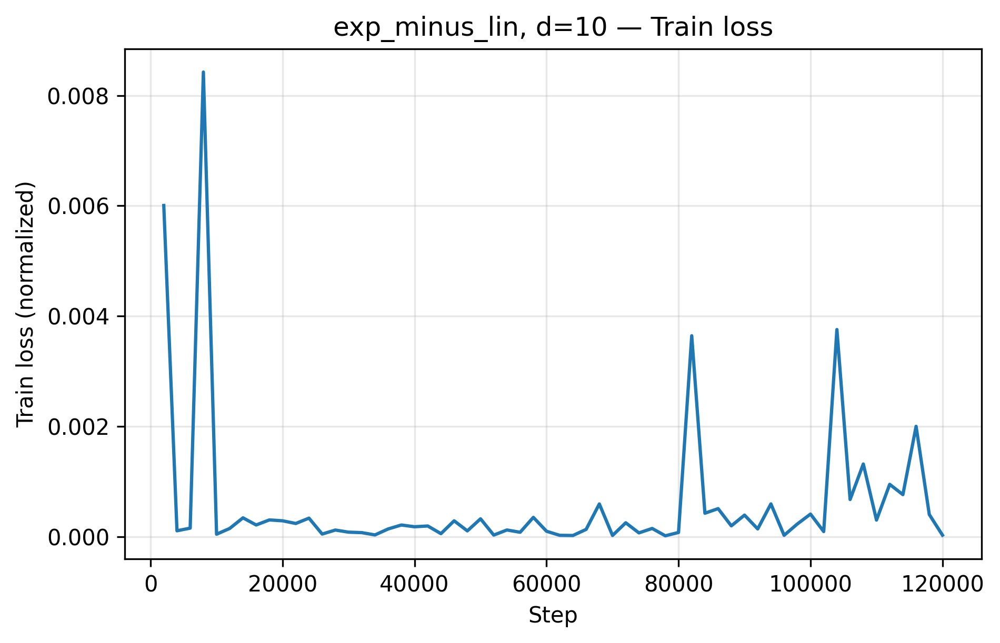

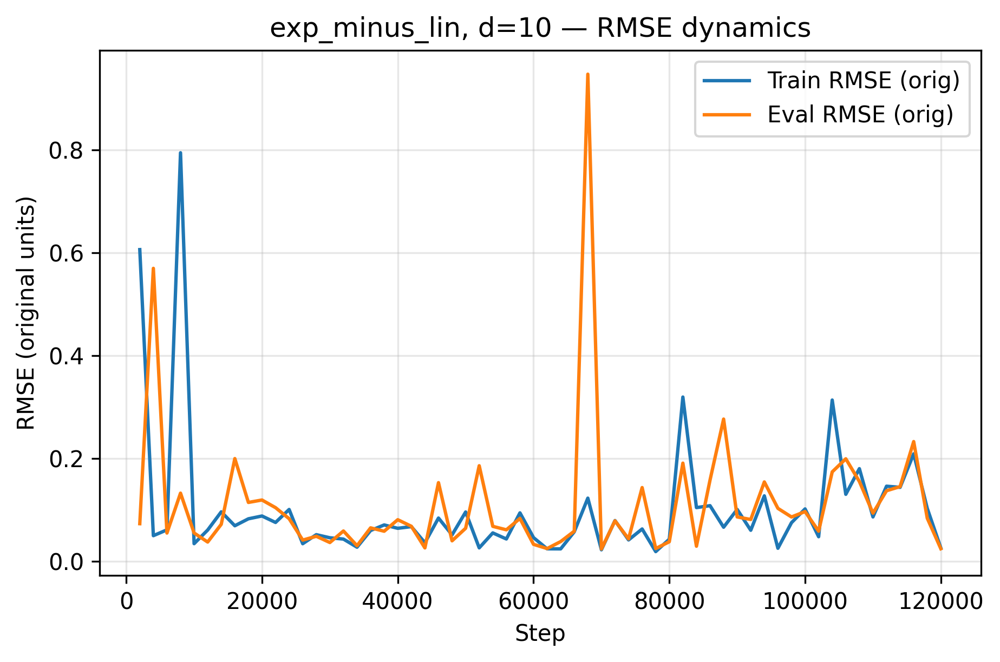

[csv] saved dlt_outputs/history_exp_minus_lin_d10.csv

================= exp_minus_lin — d=20 =================
Exp−Linear: unit a,b; analytic μ(y), rank-1 cov + εI; symmetric whitening (+ z^2)
Model:    ResNet(width=512, depth=5), params=2.66M
Sampler:  MACRO | batch=1280 (B_macro) | steps=180000 | lr=1.00e-03
[  1.7%] train loss=2.038e-02 | train RMSE=2.758e+00 | eval RMSE=2.354e-01 (rel=5.306e-02, tstd=4.438e+00) | calib RNMSE≈2.019e-01, σ_t≈3.949e+00, RNMSE×σ_t≈7.973e-01
[  3.3%] train loss=1.960e-03 | train RMSE=2.311e-01 | eval RMSE=4.566e-01 (rel=1.116e-01, tstd=4.090e+00) | calib RNMSE≈6.261e-02, σ_t≈3.691e+00, RNMSE×σ_t≈2.311e-01
[  5.0%] train loss=7.686e-04 | train RMSE=1.444e-01 | eval RMSE=9.706e-02 (rel=2.779e-02, tstd=3.493e+00) | calib RNMSE≈3.921e-02, σ_t≈3.683e+00, RNMSE×σ_t≈1.444e-01
[  6.7%] train loss=6.052e-05 | train RMSE=4.129e-02 | eval RMSE=4.871e-02 (rel=1.276e-02, tstd=3.817e+00) | calib RNMSE≈1.100e-02, σ_t≈3.753e+00, RNMSE×σ_t≈4.129e-02
[  8.3%] train loss

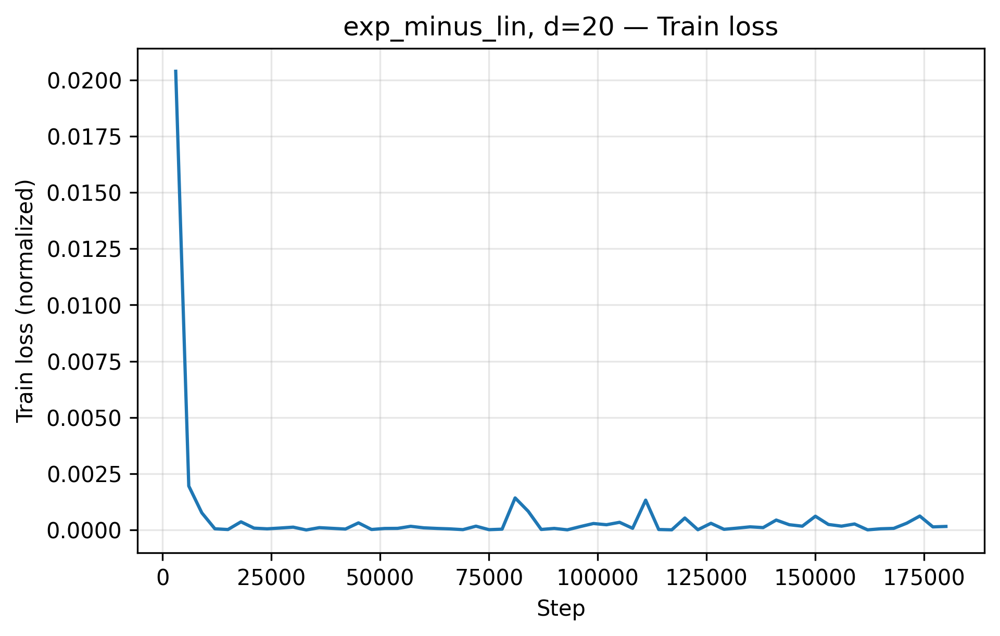

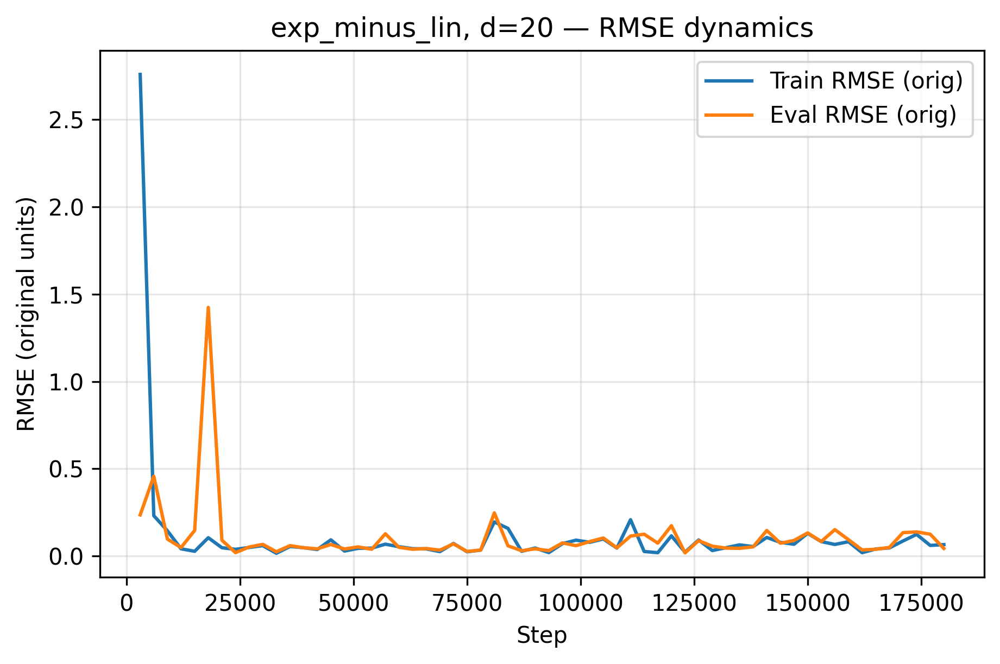

[csv] saved dlt_outputs/history_exp_minus_lin_d20.csv

================= exp_minus_lin — d=50 =================
Exp−Linear: unit a,b; analytic μ(y), rank-1 cov + εI; symmetric whitening (+ z^2)
Model:    ResNet(width=768, depth=6), params=7.19M
Sampler:  MACRO | batch=3200 (B_macro) | steps=240000 | lr=1.00e-03
[  1.7%] train loss=2.177e-05 | train RMSE=2.379e-02 | eval RMSE=4.928e-02 (rel=1.272e-02, tstd=3.873e+00) | calib RNMSE≈6.599e-03, σ_t≈3.605e+00, RNMSE×σ_t≈2.379e-02
[  3.3%] train loss=5.229e-05 | train RMSE=3.835e-02 | eval RMSE=4.752e-02 (rel=1.192e-02, tstd=3.988e+00) | calib RNMSE≈1.023e-02, σ_t≈3.750e+00, RNMSE×σ_t≈3.835e-02
[  5.0%] train loss=3.184e-04 | train RMSE=9.539e-02 | eval RMSE=6.081e-02 (rel=1.556e-02, tstd=3.908e+00) | calib RNMSE≈2.523e-02, σ_t≈3.758e+00, RNMSE×σ_t≈9.481e-02
[  6.7%] train loss=5.109e-04 | train RMSE=1.233e-01 | eval RMSE=1.254e-01 (rel=3.599e-02, tstd=3.485e+00) | calib RNMSE≈3.197e-02, σ_t≈3.857e+00, RNMSE×σ_t≈1.233e-01
[  8.3%] train loss

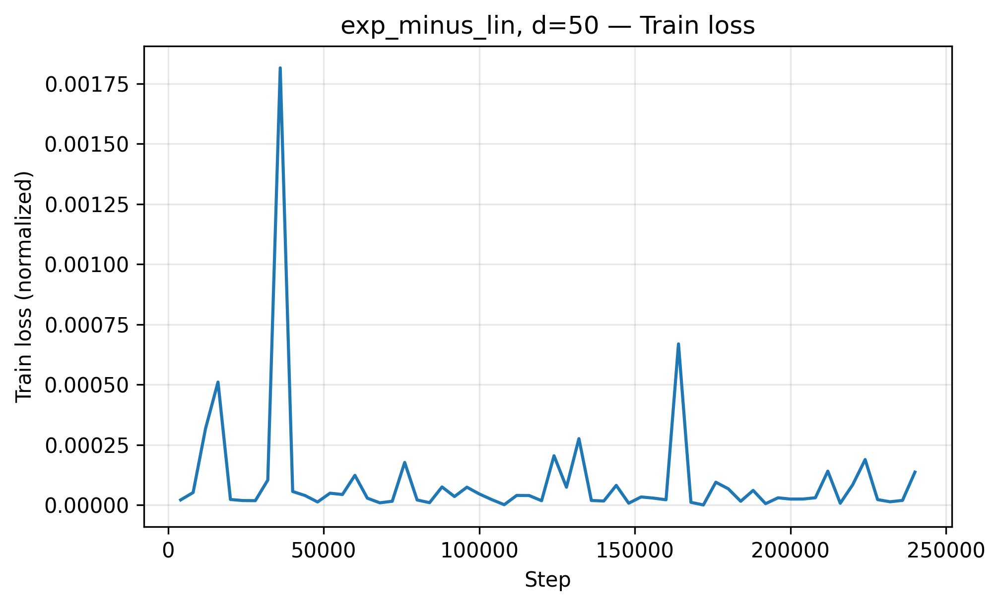

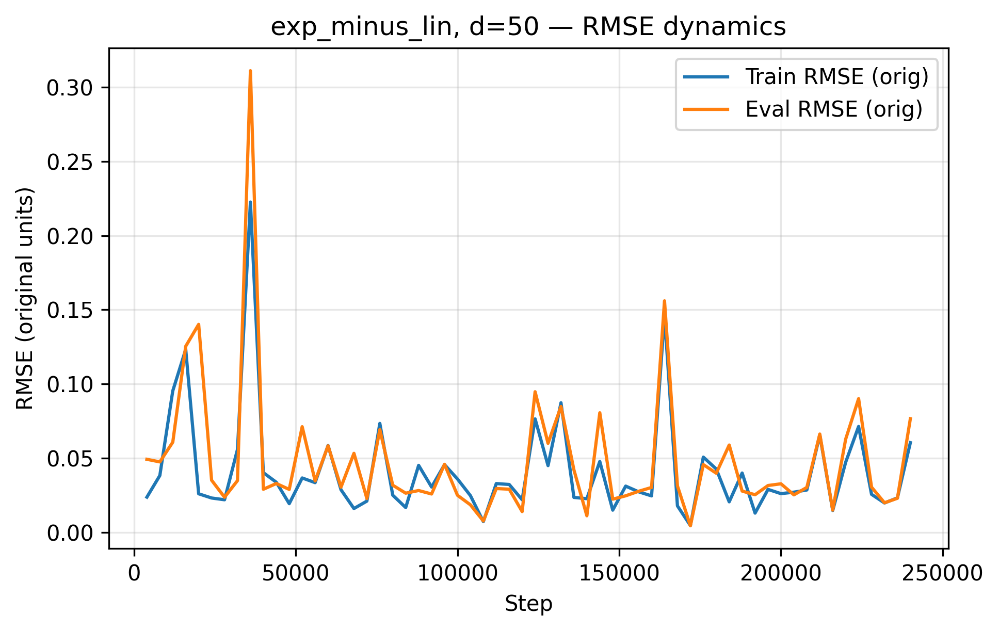

[csv] saved dlt_outputs/history_exp_minus_lin_d50.csv
ICNN pre-learn → quadratic: steps=50000, batch=2048, lr=1.00e-03, ||Q||₂≈1.010, κ=92.22, ridge=0.01
[pre  20.0%] train MSE=3.995e-03 | eval RMSE=5.880e-02
[pre  40.0%] train MSE=6.972e-04 | eval RMSE=2.568e-02
[pre  60.0%] train MSE=2.346e-04 | eval RMSE=1.485e-02
[pre  80.0%] train MSE=1.933e-04 | eval RMSE=1.259e-02
[pre 100.0%] train MSE=1.890e-04 | eval RMSE=1.257e-02
ICNN pre-learn done in 97.0s

================= rand_icnn2 — d=10 =================
ICNN(2) prelearn 50000 steps; median||y|| target=3.00 (obs=1.19 → scale=2.53); symmetric whitening
Model:    ResNet(width=384, depth=4), params=1.20M
Sampler:  MACRO | batch=640 (B_macro) | steps=120000 | lr=1.00e-03
[  1.7%] train loss=1.109e-03 | train RMSE=1.737e-01 | eval RMSE=1.873e-01 (rel=5.153e-02, tstd=3.634e+00) | calib RNMSE≈4.709e-02, σ_t≈3.689e+00, RNMSE×σ_t≈1.737e-01
[  3.3%] train loss=1.071e-03 | train RMSE=1.696e-01 | eval RMSE=1.539e-01 (rel=4.177e-02, tstd=3.684e+

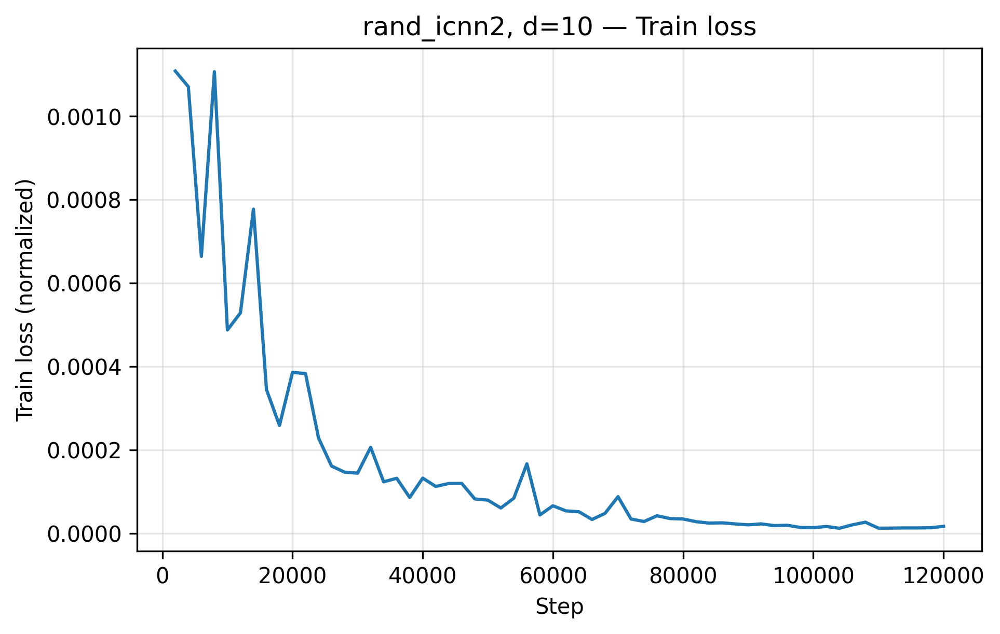

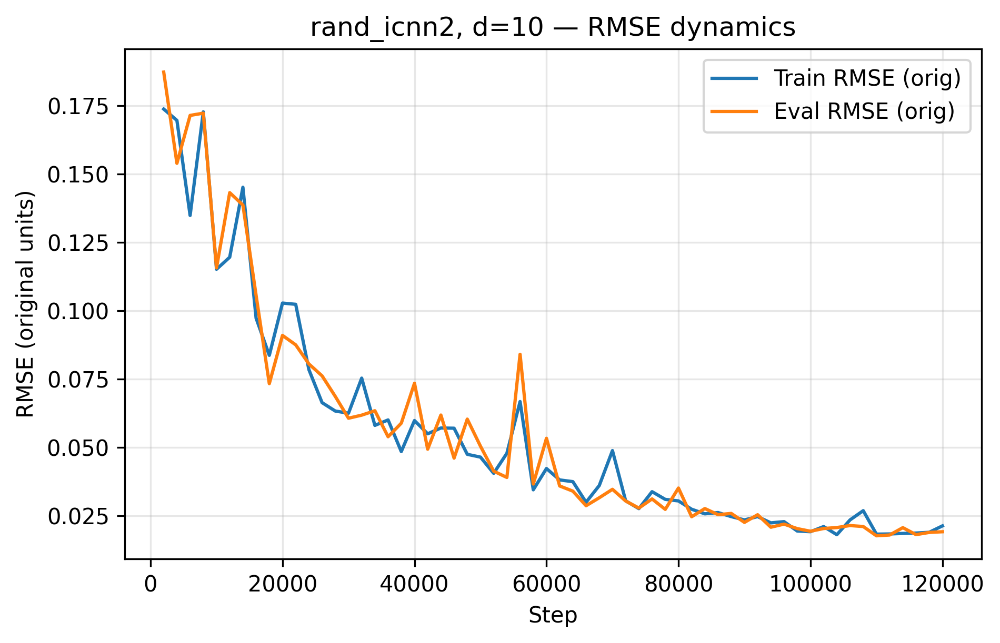

[csv] saved dlt_outputs/history_rand_icnn2_d10.csv
ICNN pre-learn → quadratic: steps=50000, batch=2048, lr=1.00e-03, ||Q||₂≈1.010, κ=99.10, ridge=0.01
[pre  20.0%] train MSE=5.280e-03 | eval RMSE=7.351e-02
[pre  40.0%] train MSE=2.248e-03 | eval RMSE=4.900e-02
[pre  60.0%] train MSE=1.535e-03 | eval RMSE=3.664e-02
[pre  80.0%] train MSE=1.094e-03 | eval RMSE=3.545e-02
[pre 100.0%] train MSE=9.881e-04 | eval RMSE=3.275e-02
ICNN pre-learn done in 96.2s

================= rand_icnn2 — d=20 =================
ICNN(2) prelearn 50000 steps; median||y|| target=3.00 (obs=1.93 → scale=1.55); symmetric whitening
Model:    ResNet(width=512, depth=5), params=2.66M
Sampler:  MACRO | batch=1280 (B_macro) | steps=180000 | lr=1.00e-03
[  1.7%] train loss=1.545e-02 | train RMSE=5.433e-01 | eval RMSE=5.016e-01 (rel=1.591e-01, tstd=3.153e+00) | calib RNMSE≈1.758e-01, σ_t≈3.091e+00, RNMSE×σ_t≈5.433e-01
[  3.3%] train loss=8.909e-04 | train RMSE=1.308e-01 | eval RMSE=1.259e-01 (rel=4.053e-02, tstd=3.106e+00

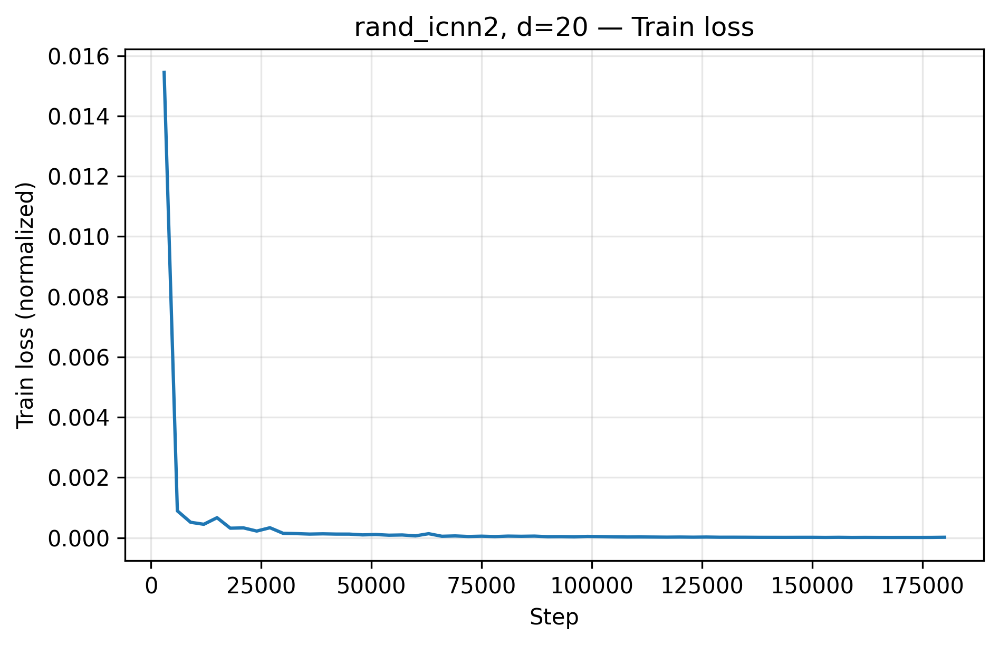

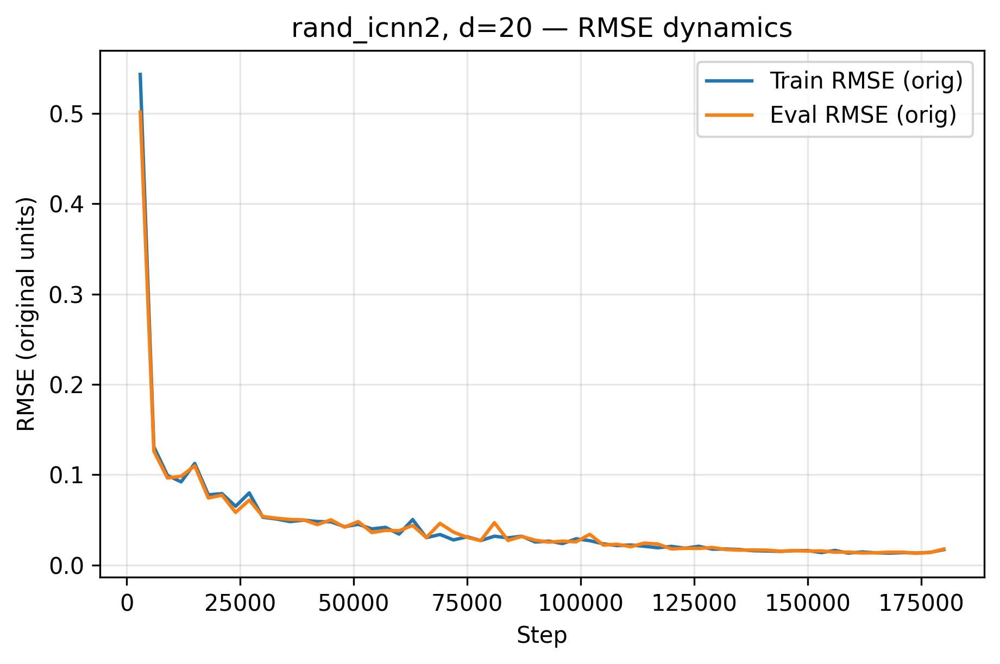

[csv] saved dlt_outputs/history_rand_icnn2_d20.csv
ICNN pre-learn → quadratic: steps=50000, batch=2048, lr=1.00e-03, ||Q||₂≈1.010, κ=98.67, ridge=0.01
[pre  20.0%] train MSE=1.711e-02 | eval RMSE=1.243e-01
[pre  40.0%] train MSE=9.312e-03 | eval RMSE=9.406e-02
[pre  60.0%] train MSE=6.142e-03 | eval RMSE=8.040e-02
[pre  80.0%] train MSE=6.217e-03 | eval RMSE=7.689e-02
[pre 100.0%] train MSE=5.719e-03 | eval RMSE=7.467e-02
ICNN pre-learn done in 96.7s

================= rand_icnn2 — d=50 =================
ICNN(2) prelearn 50000 steps; median||y|| target=3.00 (obs=2.72 → scale=1.10); symmetric whitening
Model:    ResNet(width=768, depth=6), params=7.19M
Sampler:  MACRO | batch=3200 (B_macro) | steps=240000 | lr=1.00e-03
[  1.7%] train loss=1.716e-02 | train RMSE=5.584e-01 | eval RMSE=7.592e-01 (rel=2.523e-01, tstd=3.009e+00) | calib RNMSE≈1.853e-01, σ_t≈3.014e+00, RNMSE×σ_t≈5.584e-01
[  3.3%] train loss=8.095e-04 | train RMSE=1.213e-01 | eval RMSE=1.238e-01 (rel=4.095e-02, tstd=3.023e+00

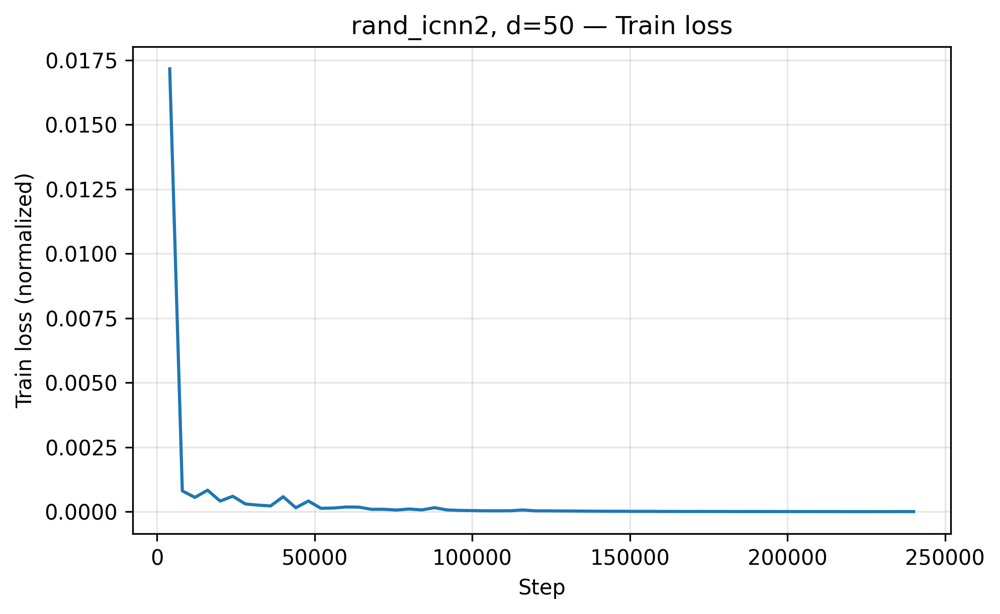

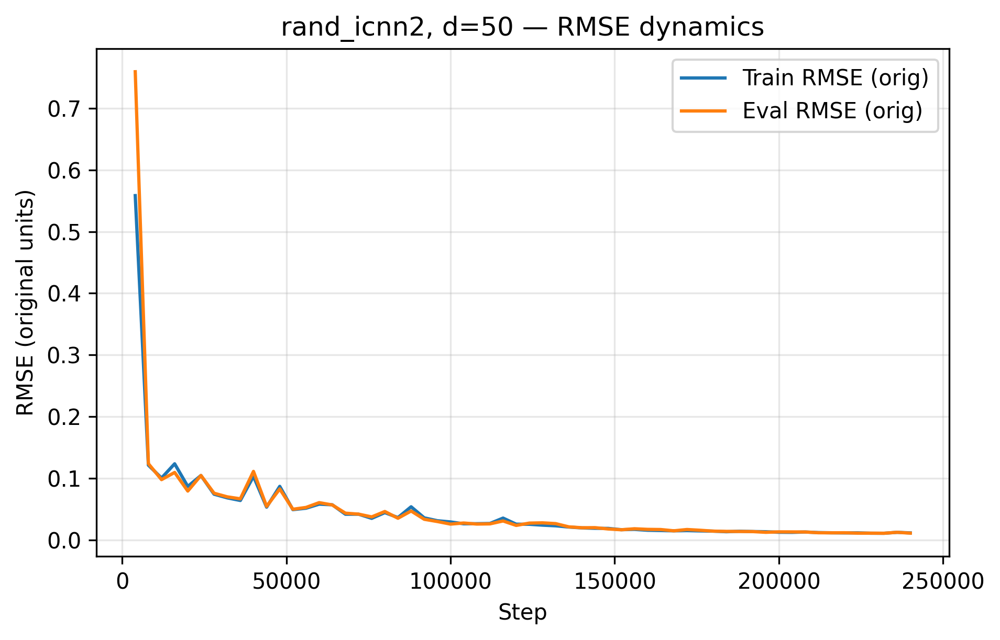

[csv] saved dlt_outputs/history_rand_icnn2_d50.csv

================= softplus_pairs — d=10 =================
Coupled Soft-plus: x_scale=1.0, block=64; symmetric whitening
Model:    ResNet(width=384, depth=4), params=1.20M
Sampler:  MACRO | batch=640 (B_macro) | steps=120000 | lr=1.00e-03
[  1.7%] train loss=2.525e-04 | train RMSE=4.929e-02 | eval RMSE=4.970e-02 (rel=2.271e-02, tstd=2.188e+00) | calib RNMSE≈2.247e-02, σ_t≈2.193e+00, RNMSE×σ_t≈4.929e-02
[  3.3%] train loss=9.062e-03 | train RMSE=2.956e-01 | eval RMSE=1.448e-01 (rel=6.585e-02, tstd=2.200e+00) | calib RNMSE≈1.346e-01, σ_t≈2.196e+00, RNMSE×σ_t≈2.956e-01
[  5.0%] train loss=5.921e-04 | train RMSE=7.499e-02 | eval RMSE=4.844e-02 (rel=2.190e-02, tstd=2.212e+00) | calib RNMSE≈3.441e-02, σ_t≈2.179e+00, RNMSE×σ_t≈7.499e-02
[  6.7%] train loss=2.301e-04 | train RMSE=4.693e-02 | eval RMSE=6.107e-02 (rel=2.837e-02, tstd=2.153e+00) | calib RNMSE≈2.145e-02, σ_t≈2.187e+00, RNMSE×σ_t≈4.693e-02
[  8.3%] train loss=8.766e-05 | train RMSE

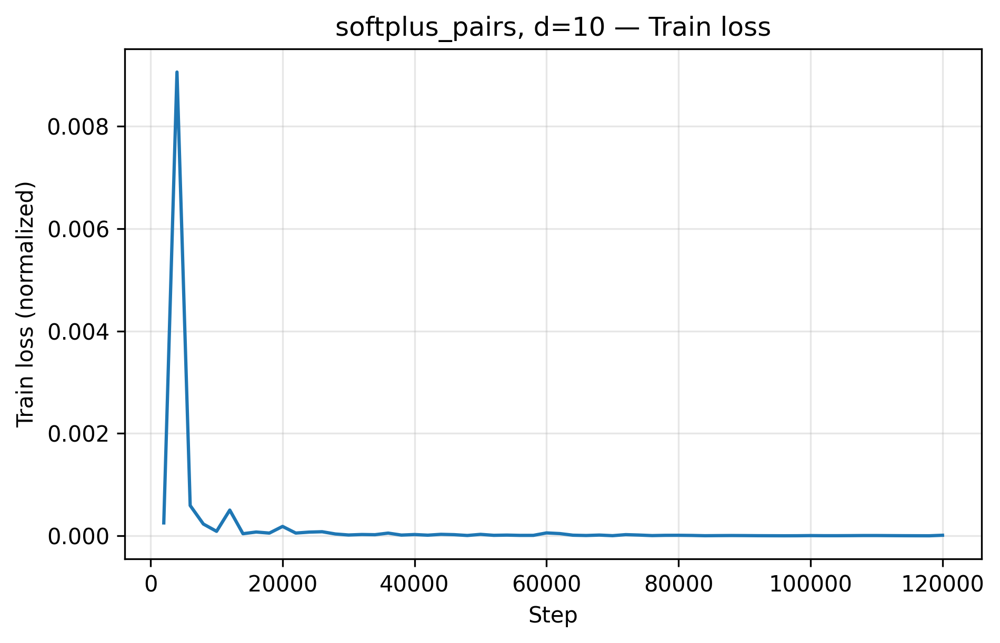

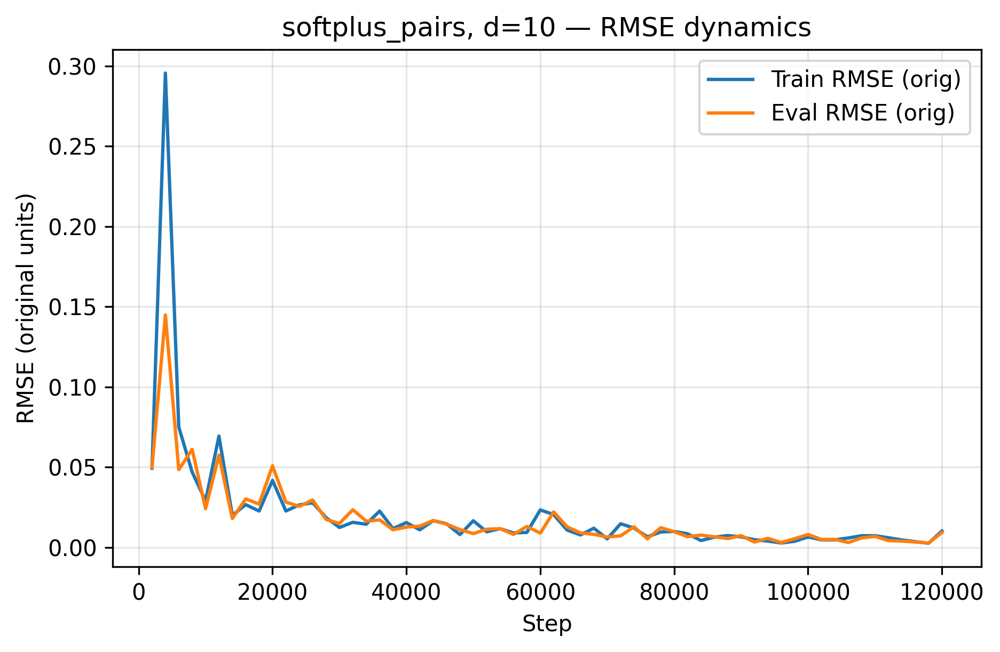

[csv] saved dlt_outputs/history_softplus_pairs_d10.csv

================= softplus_pairs — d=20 =================
Coupled Soft-plus: x_scale=1.0, block=64; symmetric whitening
Model:    ResNet(width=512, depth=5), params=2.66M
Sampler:  MACRO | batch=1280 (B_macro) | steps=180000 | lr=1.00e-03
[  1.7%] train loss=1.627e-04 | train RMSE=1.146e-01 | eval RMSE=1.310e-01 (rel=2.081e-02, tstd=6.294e+00) | calib RNMSE≈1.804e-02, σ_t≈6.351e+00, RNMSE×σ_t≈1.146e-01
[  3.3%] train loss=2.890e-04 | train RMSE=1.519e-01 | eval RMSE=1.490e-01 (rel=2.351e-02, tstd=6.340e+00) | calib RNMSE≈2.404e-02, σ_t≈6.319e+00, RNMSE×σ_t≈1.519e-01
[  5.0%] train loss=2.026e-04 | train RMSE=1.274e-01 | eval RMSE=1.508e-01 (rel=2.404e-02, tstd=6.275e+00) | calib RNMSE≈2.013e-02, σ_t≈6.330e+00, RNMSE×σ_t≈1.274e-01
[  6.7%] train loss=1.272e-04 | train RMSE=1.012e-01 | eval RMSE=1.174e-01 (rel=1.854e-02, tstd=6.331e+00) | calib RNMSE≈1.595e-02, σ_t≈6.345e+00, RNMSE×σ_t≈1.012e-01
[  8.3%] train loss=7.543e-05 | train

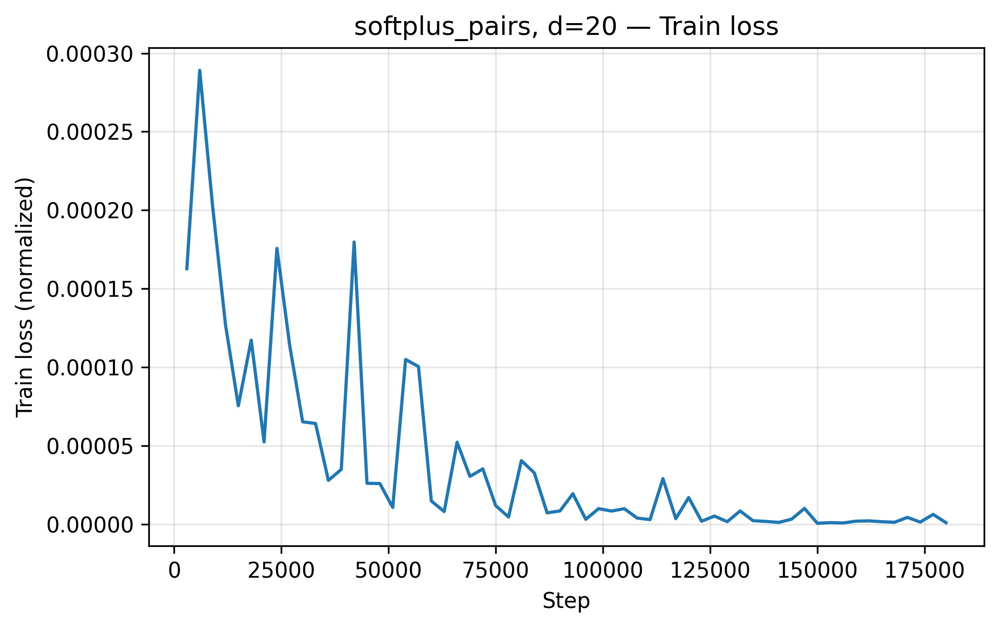

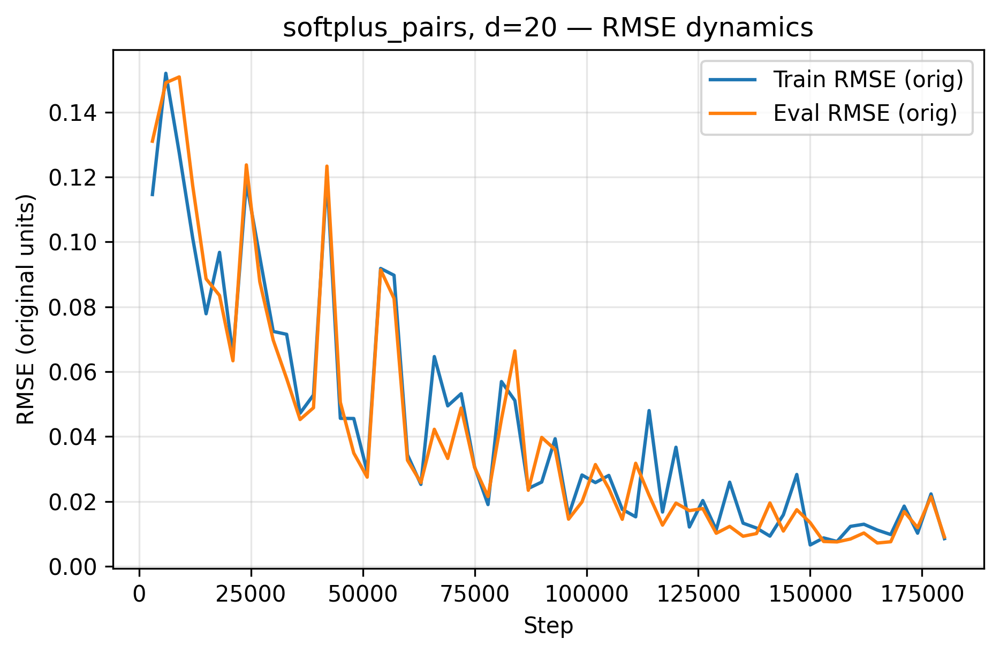

[csv] saved dlt_outputs/history_softplus_pairs_d20.csv

================= softplus_pairs — d=50 =================
Coupled Soft-plus: x_scale=1.0, block=64; symmetric whitening
Model:    ResNet(width=768, depth=6), params=7.19M
Sampler:  MACRO | batch=3200 (B_macro) | steps=240000 | lr=1.00e-03
[  1.7%] train loss=4.236e-03 | train RMSE=2.329e+00 | eval RMSE=2.010e+00 (rel=7.970e-02, tstd=2.522e+01) | calib RNMSE≈9.204e-02, σ_t≈2.531e+01, RNMSE×σ_t≈2.329e+00
[  3.3%] train loss=2.563e-03 | train RMSE=1.815e+00 | eval RMSE=1.301e+00 (rel=5.126e-02, tstd=2.538e+01) | calib RNMSE≈7.160e-02, σ_t≈2.535e+01, RNMSE×σ_t≈1.815e+00
[  5.0%] train loss=3.321e-04 | train RMSE=6.519e-01 | eval RMSE=5.833e-01 (rel=2.319e-02, tstd=2.515e+01) | calib RNMSE≈2.577e-02, σ_t≈2.530e+01, RNMSE×σ_t≈6.519e-01
[  6.7%] train loss=2.675e-04 | train RMSE=5.865e-01 | eval RMSE=5.772e-01 (rel=2.266e-02, tstd=2.547e+01) | calib RNMSE≈2.313e-02, σ_t≈2.536e+01, RNMSE×σ_t≈5.865e-01
[  8.3%] train loss=1.130e-04 | train

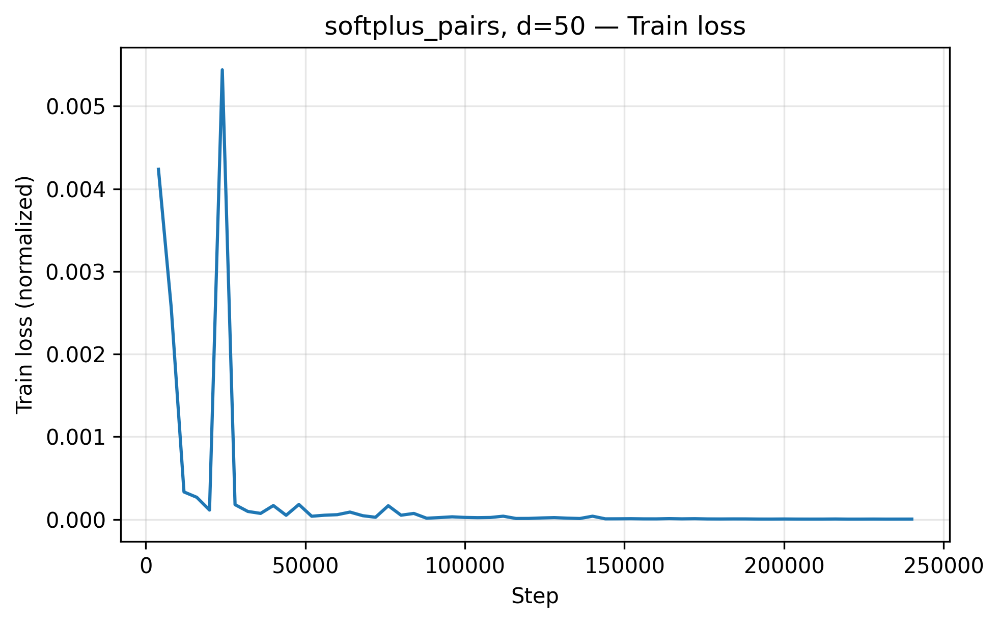

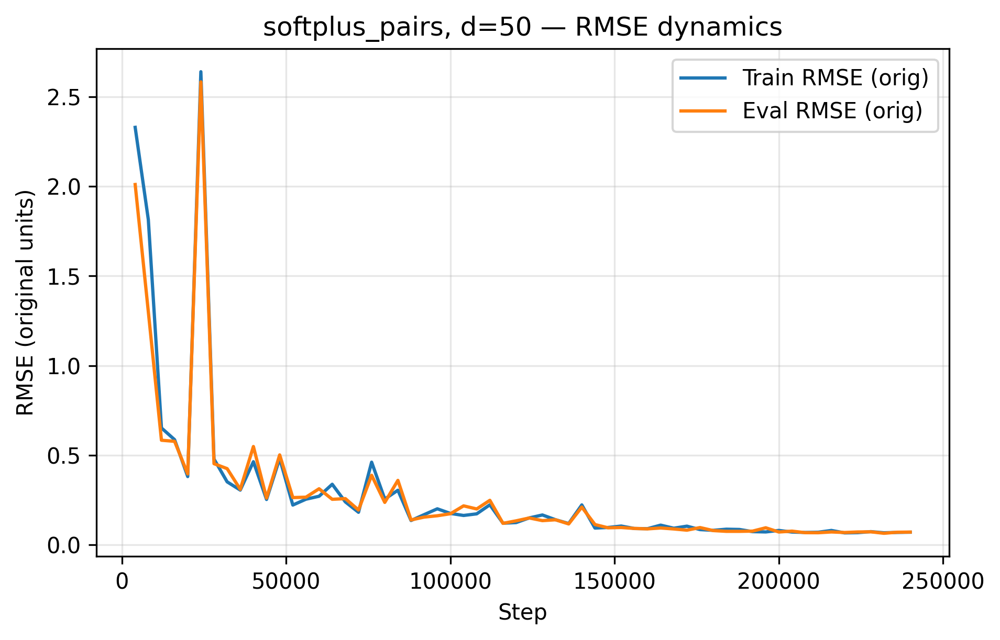

[csv] saved dlt_outputs/history_softplus_pairs_d50.csv

============================ TRIAL 3/3 (seed=2000048) ============================

================= quad_spd — d=10 =================
Quadratic SPD: ||Q||₂≈1.010, κ=75.55; features: z = Q^-0.5 y (+ z^2)
Model:    ResNet(width=384, depth=4), params=1.20M
Sampler:  MACRO | batch=640 (B_macro) | steps=120000 | lr=1.00e-03
[  1.7%] train loss=4.960e-05 | train RMSE=1.030e-02 | eval RMSE=1.231e-02 (rel=1.151e-02, tstd=1.070e+00) | calib RNMSE≈9.960e-03, σ_t≈1.034e+00, RNMSE×σ_t≈1.030e-02
[  3.3%] train loss=4.731e-04 | train RMSE=3.199e-02 | eval RMSE=2.186e-02 (rel=2.106e-02, tstd=1.038e+00) | calib RNMSE≈3.076e-02, σ_t≈1.040e+00, RNMSE×σ_t≈3.199e-02
[  5.0%] train loss=1.027e-04 | train RMSE=1.495e-02 | eval RMSE=1.030e-02 (rel=9.793e-03, tstd=1.052e+00) | calib RNMSE≈1.433e-02, σ_t≈1.043e+00, RNMSE×σ_t≈1.495e-02
[  6.7%] train loss=5.342e-05 | train RMSE=1.079e-02 | eval RMSE=1.630e-02 (rel=1.597e-02, tstd=1.021e+00) | calib RNMSE

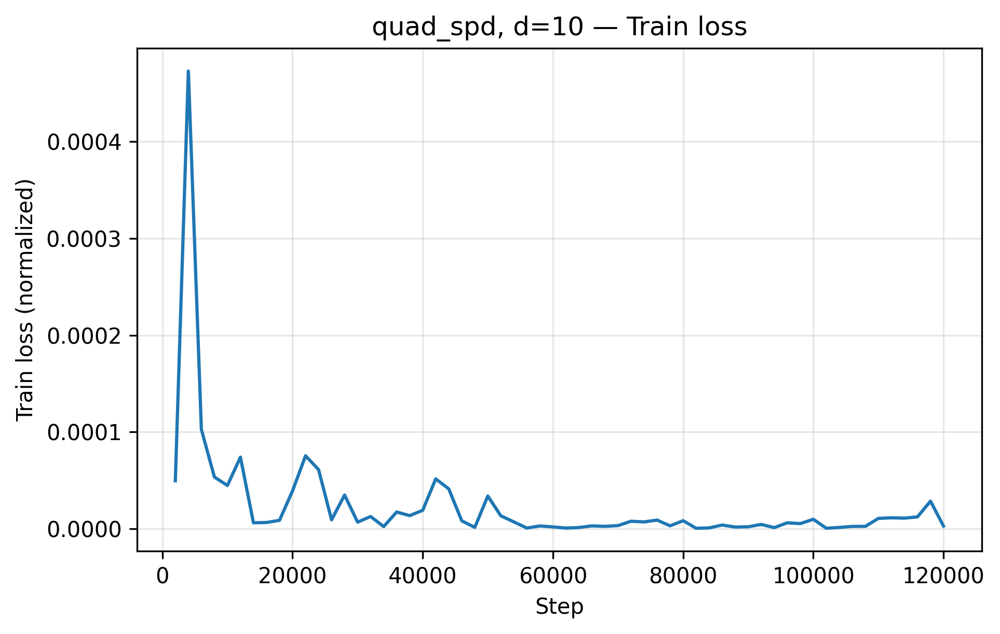

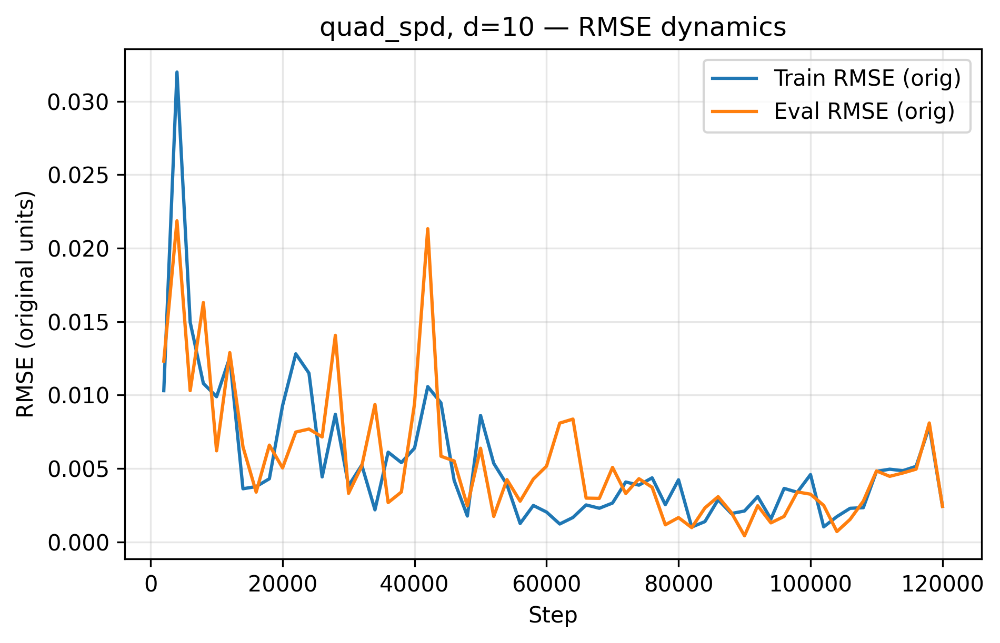

[csv] saved dlt_outputs/history_quad_spd_d10.csv

================= quad_spd — d=20 =================
Quadratic SPD: ||Q||₂≈1.010, κ=86.76; features: z = Q^-0.5 y (+ z^2)
Model:    ResNet(width=512, depth=5), params=2.66M
Sampler:  MACRO | batch=1280 (B_macro) | steps=180000 | lr=1.00e-03
[  1.7%] train loss=1.255e-04 | train RMSE=1.915e-02 | eval RMSE=1.742e-02 (rel=1.462e-02, tstd=1.192e+00) | calib RNMSE≈1.584e-02, σ_t≈1.209e+00, RNMSE×σ_t≈1.915e-02
[  3.3%] train loss=4.823e-04 | train RMSE=3.729e-02 | eval RMSE=3.513e-02 (rel=2.959e-02, tstd=1.187e+00) | calib RNMSE≈3.106e-02, σ_t≈1.201e+00, RNMSE×σ_t≈3.729e-02
[  5.0%] train loss=3.689e-04 | train RMSE=3.273e-02 | eval RMSE=2.556e-02 (rel=2.140e-02, tstd=1.194e+00) | calib RNMSE≈2.716e-02, σ_t≈1.205e+00, RNMSE×σ_t≈3.273e-02
[  6.7%] train loss=1.061e-04 | train RMSE=1.752e-02 | eval RMSE=1.738e-02 (rel=1.454e-02, tstd=1.195e+00) | calib RNMSE≈1.457e-02, σ_t≈1.203e+00, RNMSE×σ_t≈1.752e-02
[  8.3%] train loss=4.005e-05 | train RMSE

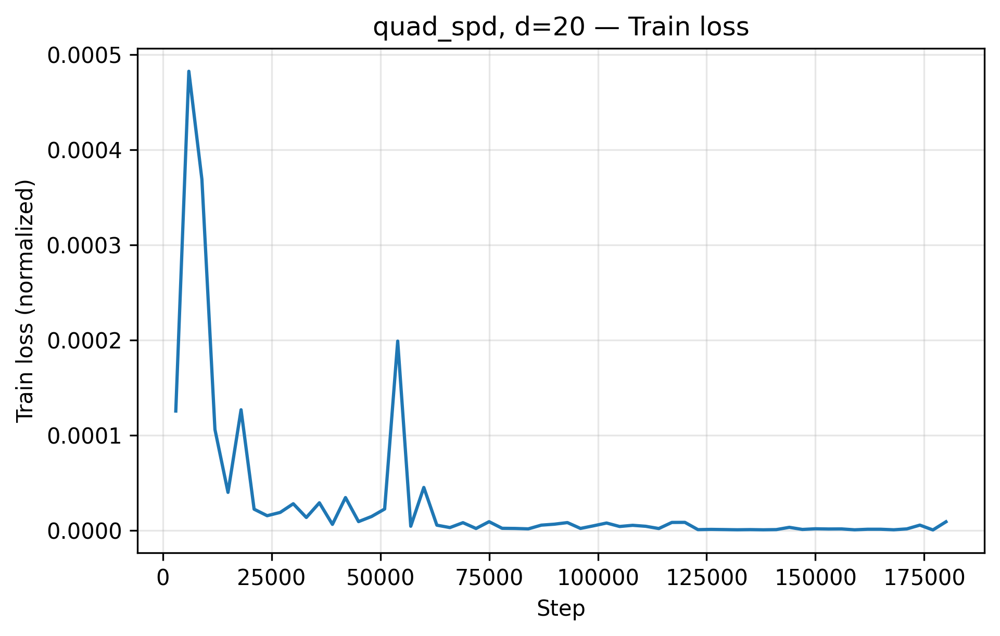

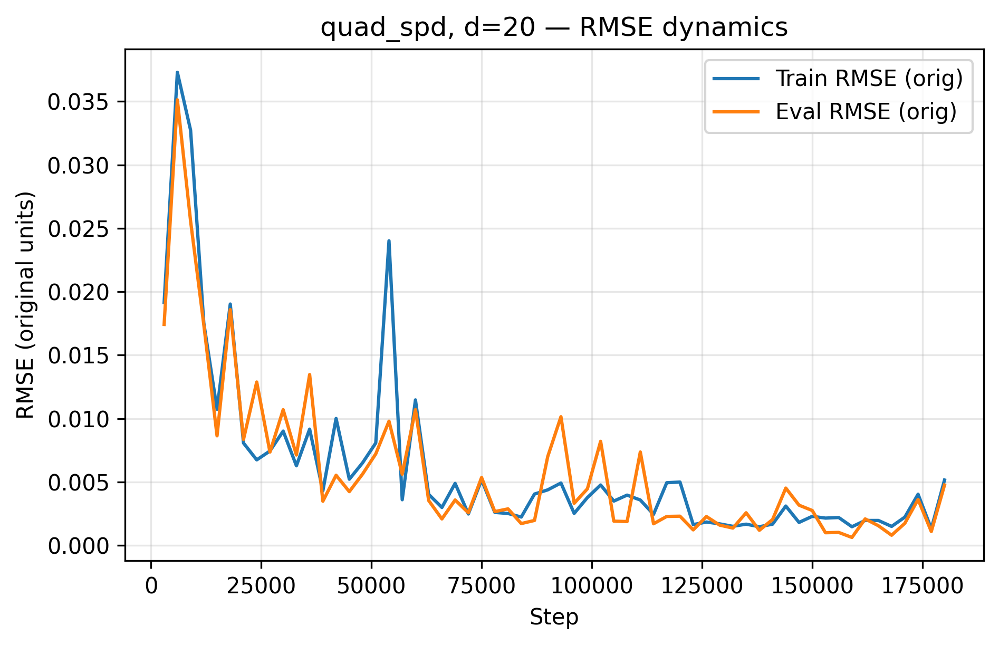

[csv] saved dlt_outputs/history_quad_spd_d20.csv

================= quad_spd — d=50 =================
Quadratic SPD: ||Q||₂≈1.010, κ=100.71; features: z = Q^-0.5 y (+ z^2)
Model:    ResNet(width=768, depth=6), params=7.19M
Sampler:  MACRO | batch=3200 (B_macro) | steps=240000 | lr=1.00e-03
[  1.7%] train loss=3.791e-05 | train RMSE=1.754e-02 | eval RMSE=1.640e-02 (rel=8.021e-03, tstd=2.045e+00) | calib RNMSE≈8.707e-03, σ_t≈2.014e+00, RNMSE×σ_t≈1.754e-02
[  3.3%] train loss=1.781e-04 | train RMSE=3.802e-02 | eval RMSE=3.484e-02 (rel=1.703e-02, tstd=2.046e+00) | calib RNMSE≈1.887e-02, σ_t≈2.014e+00, RNMSE×σ_t≈3.802e-02
[  5.0%] train loss=2.911e-06 | train RMSE=4.864e-03 | eval RMSE=5.341e-03 (rel=2.608e-03, tstd=2.048e+00) | calib RNMSE≈2.413e-03, σ_t≈2.016e+00, RNMSE×σ_t≈4.864e-03
[  6.7%] train loss=1.328e-05 | train RMSE=1.039e-02 | eval RMSE=1.090e-02 (rel=5.417e-03, tstd=2.013e+00) | calib RNMSE≈5.154e-03, σ_t≈2.015e+00, RNMSE×σ_t≈1.039e-02
[  8.3%] train loss=4.096e-06 | train RMS

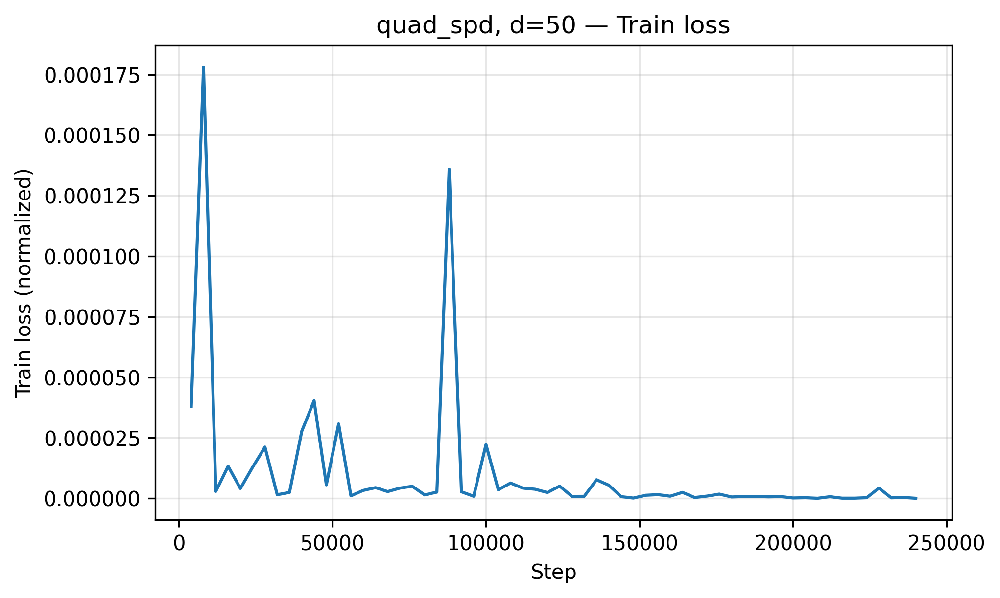

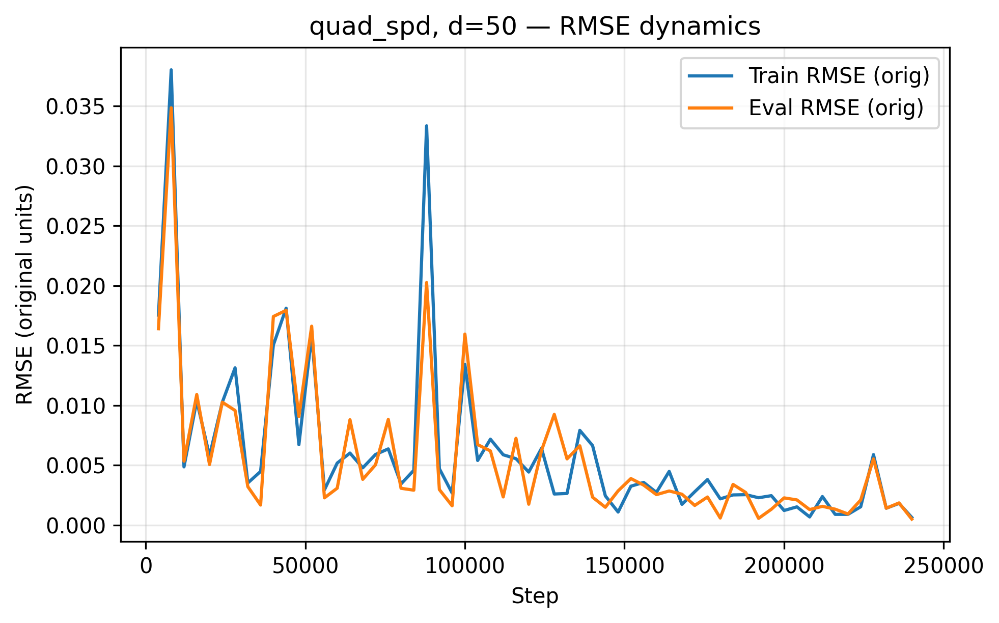

[csv] saved dlt_outputs/history_quad_spd_d50.csv

================= exp_minus_lin — d=10 =================
Exp−Linear: unit a,b; analytic μ(y), rank-1 cov + εI; symmetric whitening (+ z^2)
Model:    ResNet(width=384, depth=4), params=1.20M
Sampler:  MACRO | batch=640 (B_macro) | steps=120000 | lr=1.00e-03
[  1.7%] train loss=4.850e-04 | train RMSE=1.100e-01 | eval RMSE=1.428e+00 (rel=3.232e-01, tstd=4.419e+00) | calib RNMSE≈3.114e-02, σ_t≈3.533e+00, RNMSE×σ_t≈1.100e-01
[  3.3%] train loss=4.678e-05 | train RMSE=3.179e-02 | eval RMSE=2.748e-01 (rel=6.695e-02, tstd=4.105e+00) | calib RNMSE≈9.673e-03, σ_t≈3.286e+00, RNMSE×σ_t≈3.179e-02
[  5.0%] train loss=1.222e-03 | train RMSE=1.946e-01 | eval RMSE=2.801e-01 (rel=7.112e-02, tstd=3.938e+00) | calib RNMSE≈4.943e-02, σ_t≈3.936e+00, RNMSE×σ_t≈1.946e-01
[  6.7%] train loss=6.618e-05 | train RMSE=3.997e-02 | eval RMSE=3.947e-02 (rel=9.010e-03, tstd=4.381e+00) | calib RNMSE≈1.150e-02, σ_t≈3.474e+00, RNMSE×σ_t≈3.997e-02
[  8.3%] train loss=3.768

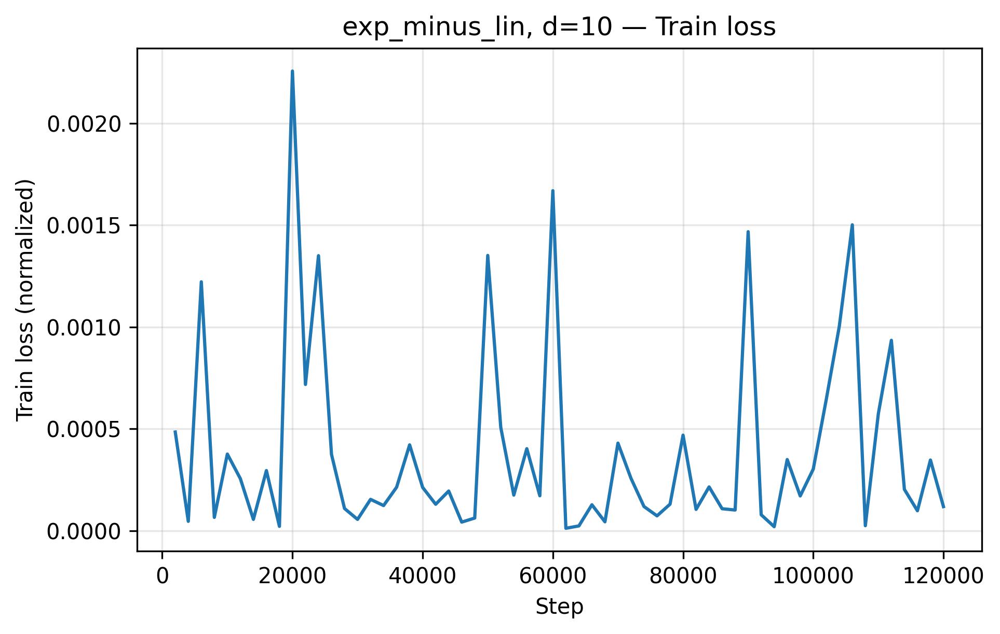

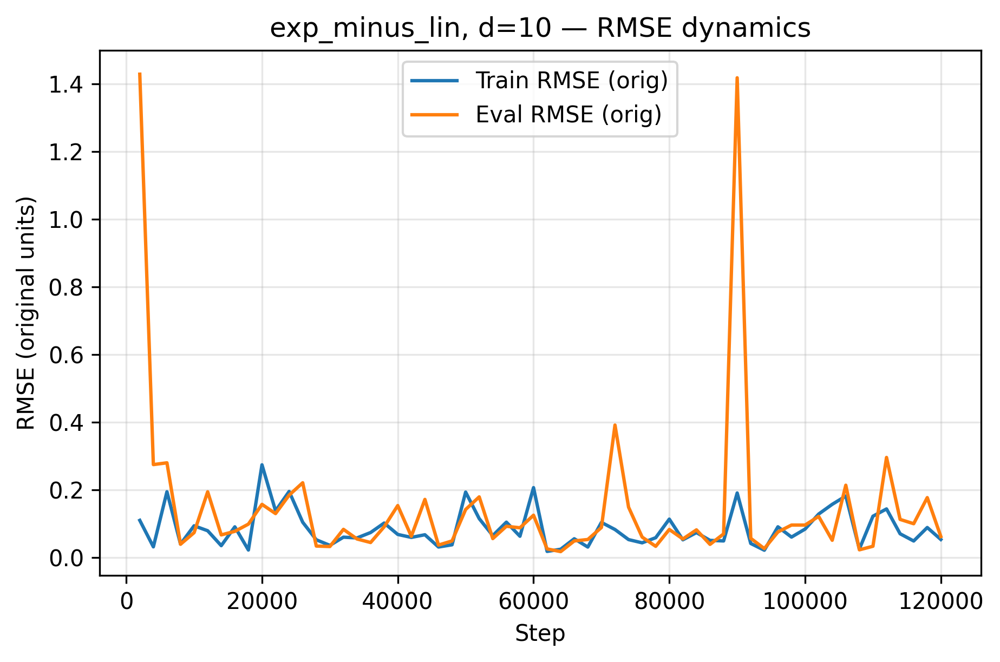

[csv] saved dlt_outputs/history_exp_minus_lin_d10.csv

================= exp_minus_lin — d=20 =================
Exp−Linear: unit a,b; analytic μ(y), rank-1 cov + εI; symmetric whitening (+ z^2)
Model:    ResNet(width=512, depth=5), params=2.66M
Sampler:  MACRO | batch=1280 (B_macro) | steps=180000 | lr=1.00e-03
[  1.7%] train loss=9.293e-04 | train RMSE=1.604e-01 | eval RMSE=1.694e-01 (rel=4.887e-02, tstd=3.465e+00) | calib RNMSE≈4.311e-02, σ_t≈3.721e+00, RNMSE×σ_t≈1.604e-01
[  3.3%] train loss=2.412e-04 | train RMSE=7.835e-02 | eval RMSE=9.629e-02 (rel=3.225e-02, tstd=2.985e+00) | calib RNMSE≈2.196e-02, σ_t≈3.568e+00, RNMSE×σ_t≈7.835e-02
[  5.0%] train loss=1.102e-04 | train RMSE=5.640e-02 | eval RMSE=5.595e-02 (rel=1.731e-02, tstd=3.232e+00) | calib RNMSE≈1.484e-02, σ_t≈3.799e+00, RNMSE×σ_t≈5.640e-02
[  6.7%] train loss=1.865e-05 | train RMSE=2.137e-02 | eval RMSE=2.734e-02 (rel=7.661e-03, tstd=3.569e+00) | calib RNMSE≈6.108e-03, σ_t≈3.499e+00, RNMSE×σ_t≈2.137e-02
[  8.3%] train loss

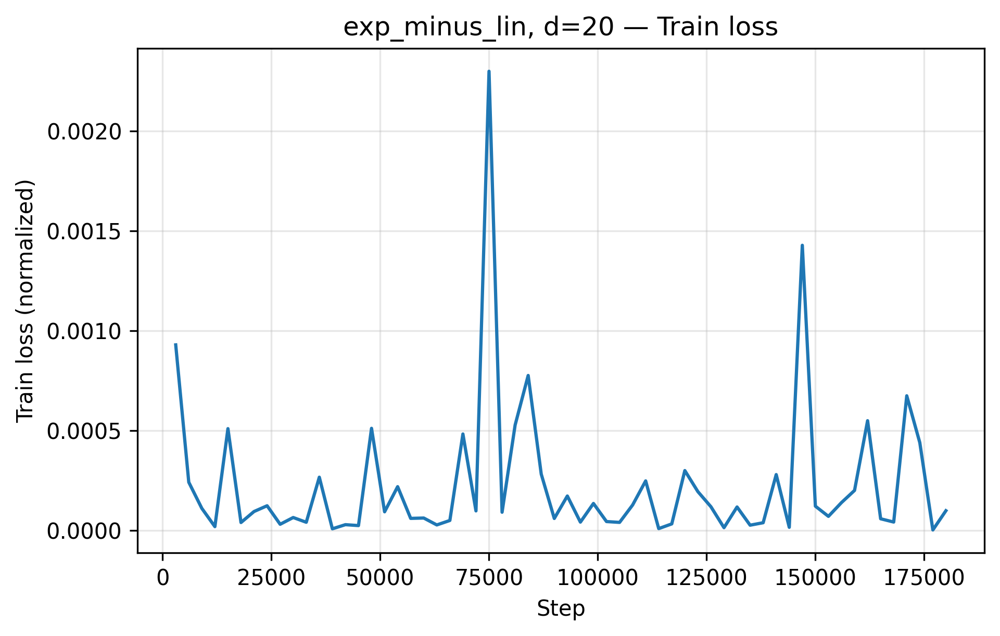

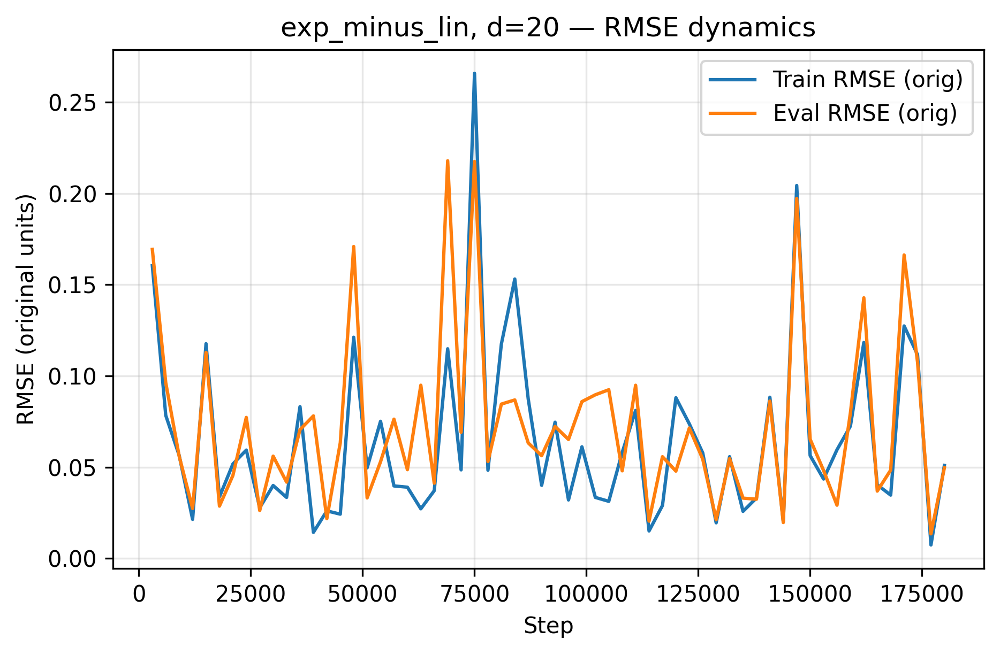

[csv] saved dlt_outputs/history_exp_minus_lin_d20.csv

================= exp_minus_lin — d=50 =================
Exp−Linear: unit a,b; analytic μ(y), rank-1 cov + εI; symmetric whitening (+ z^2)
Model:    ResNet(width=768, depth=6), params=7.19M
Sampler:  MACRO | batch=3200 (B_macro) | steps=240000 | lr=1.00e-03
[  1.7%] train loss=1.900e-03 | train RMSE=2.350e-01 | eval RMSE=3.577e-01 (rel=9.662e-02, tstd=3.702e+00) | calib RNMSE≈6.165e-02, σ_t≈3.811e+00, RNMSE×σ_t≈2.350e-01
[  3.3%] train loss=1.084e-04 | train RMSE=5.714e-02 | eval RMSE=8.475e-02 (rel=2.333e-02, tstd=3.633e+00) | calib RNMSE≈1.472e-02, σ_t≈3.881e+00, RNMSE×σ_t≈5.714e-02
[  5.0%] train loss=1.169e-04 | train RMSE=5.682e-02 | eval RMSE=6.217e-02 (rel=1.546e-02, tstd=4.022e+00) | calib RNMSE≈1.529e-02, σ_t≈3.716e+00, RNMSE×σ_t≈5.682e-02
[  6.7%] train loss=2.826e-05 | train RMSE=2.727e-02 | eval RMSE=4.175e-02 (rel=1.105e-02, tstd=3.779e+00) | calib RNMSE≈7.518e-03, σ_t≈3.628e+00, RNMSE×σ_t≈2.727e-02
[  8.3%] train loss

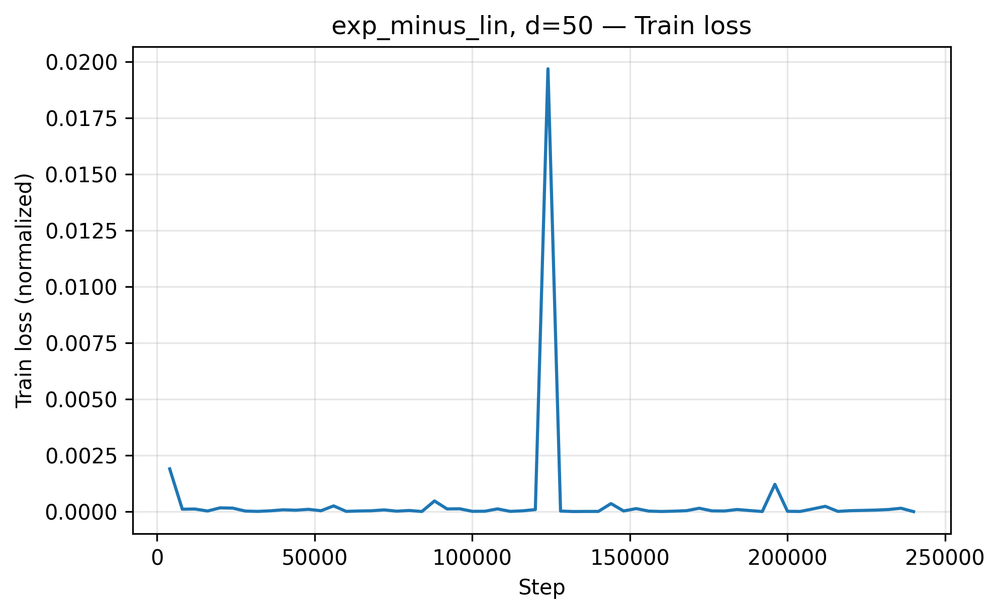

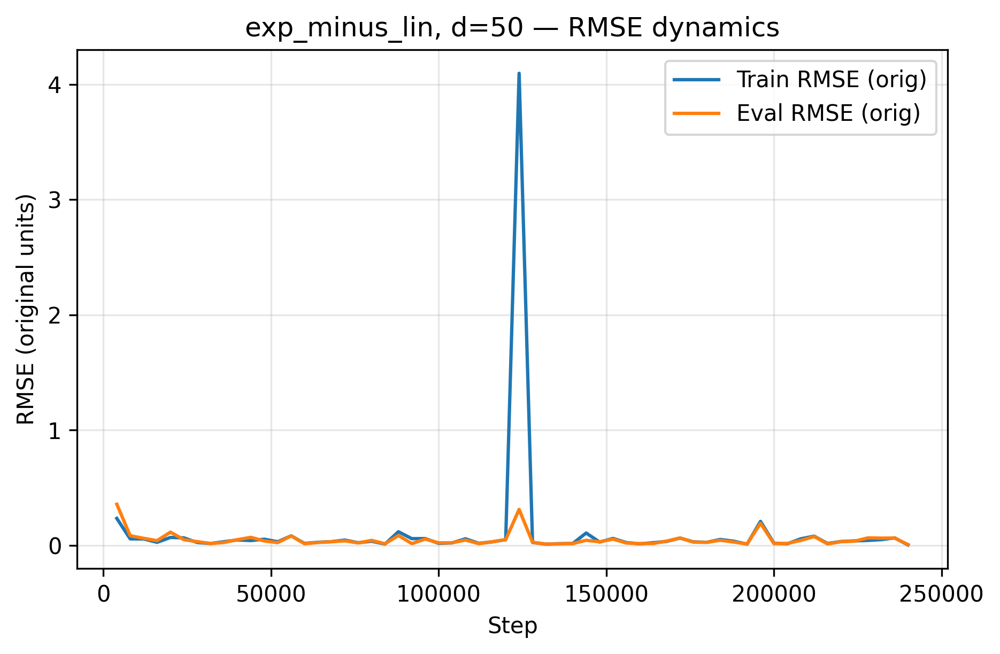

[csv] saved dlt_outputs/history_exp_minus_lin_d50.csv
ICNN pre-learn → quadratic: steps=50000, batch=2048, lr=1.00e-03, ||Q||₂≈1.010, κ=88.95, ridge=0.01
[pre  20.0%] train MSE=3.382e-03 | eval RMSE=5.746e-02
[pre  40.0%] train MSE=5.686e-04 | eval RMSE=2.381e-02
[pre  60.0%] train MSE=2.479e-04 | eval RMSE=1.643e-02
[pre  80.0%] train MSE=2.175e-04 | eval RMSE=1.452e-02
[pre 100.0%] train MSE=1.912e-04 | eval RMSE=1.460e-02
ICNN pre-learn done in 94.4s

================= rand_icnn2 — d=10 =================
ICNN(2) prelearn 50000 steps; median||y|| target=3.00 (obs=1.08 → scale=2.77); symmetric whitening
Model:    ResNet(width=384, depth=4), params=1.20M
Sampler:  MACRO | batch=640 (B_macro) | steps=120000 | lr=1.00e-03
[  1.7%] train loss=1.351e-03 | train RMSE=2.139e-01 | eval RMSE=2.058e-01 (rel=5.091e-02, tstd=4.042e+00) | calib RNMSE≈5.197e-02, σ_t≈4.116e+00, RNMSE×σ_t≈2.139e-01
[  3.3%] train loss=6.491e-04 | train RMSE=1.478e-01 | eval RMSE=1.475e-01 (rel=3.622e-02, tstd=4.073e+

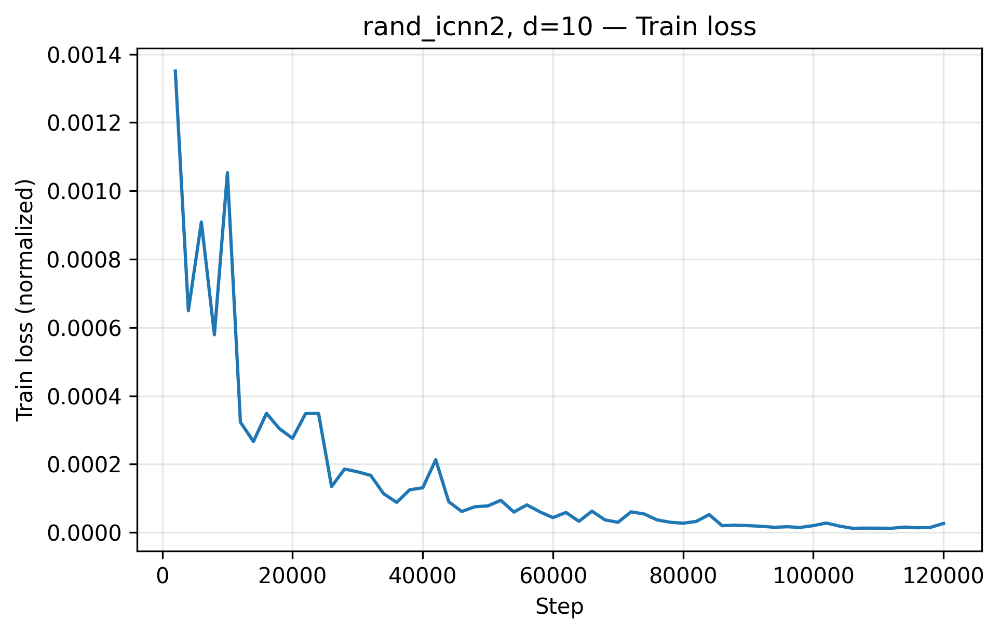

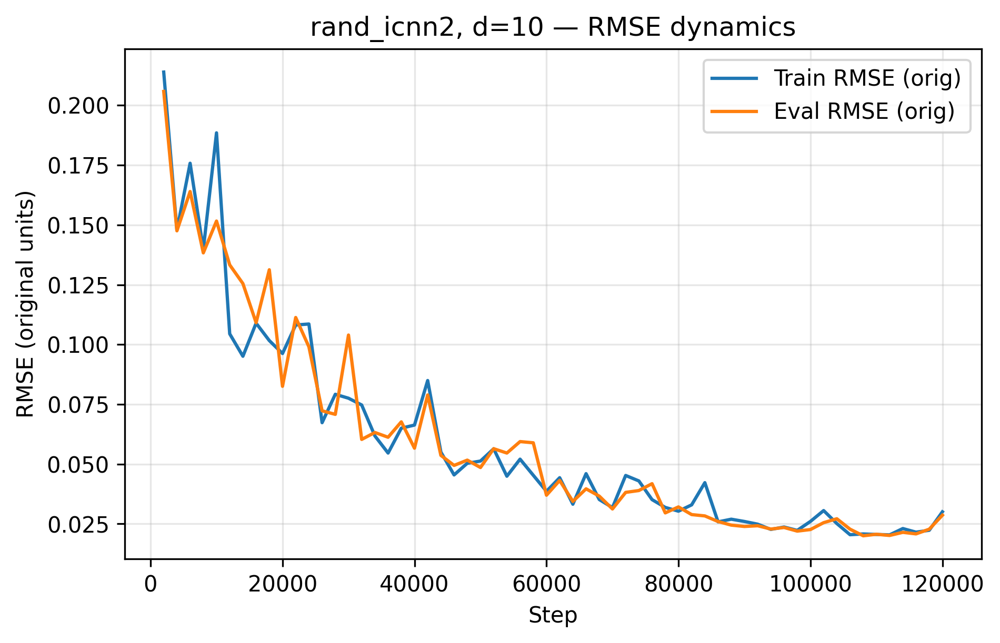

[csv] saved dlt_outputs/history_rand_icnn2_d10.csv
ICNN pre-learn → quadratic: steps=50000, batch=2048, lr=1.00e-03, ||Q||₂≈1.010, κ=85.69, ridge=0.01
[pre  20.0%] train MSE=4.946e-03 | eval RMSE=7.272e-02
[pre  40.0%] train MSE=1.994e-03 | eval RMSE=4.642e-02
[pre  60.0%] train MSE=1.227e-03 | eval RMSE=3.556e-02
[pre  80.0%] train MSE=1.137e-03 | eval RMSE=3.217e-02
[pre 100.0%] train MSE=9.368e-04 | eval RMSE=2.996e-02
ICNN pre-learn done in 95.9s

================= rand_icnn2 — d=20 =================
ICNN(2) prelearn 50000 steps; median||y|| target=3.00 (obs=1.72 → scale=1.75); symmetric whitening
Model:    ResNet(width=512, depth=5), params=2.66M
Sampler:  MACRO | batch=1280 (B_macro) | steps=180000 | lr=1.00e-03
[  1.7%] train loss=8.489e-03 | train RMSE=4.168e-01 | eval RMSE=2.745e-01 (rel=8.517e-02, tstd=3.223e+00) | calib RNMSE≈1.303e-01, σ_t≈3.199e+00, RNMSE×σ_t≈4.168e-01
[  3.3%] train loss=6.913e-04 | train RMSE=1.191e-01 | eval RMSE=1.298e-01 (rel=4.053e-02, tstd=3.202e+00

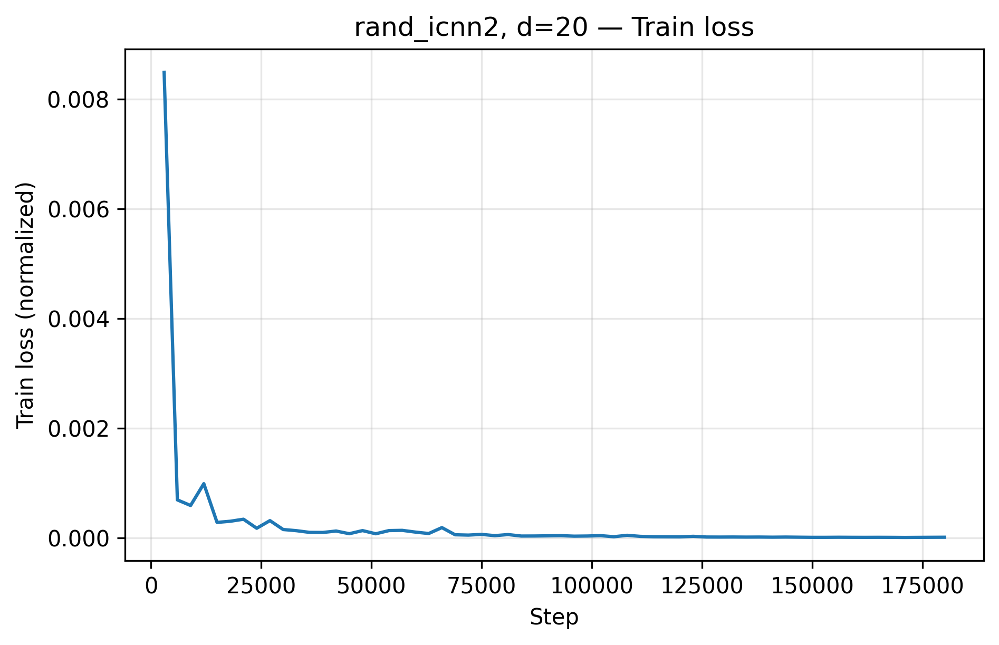

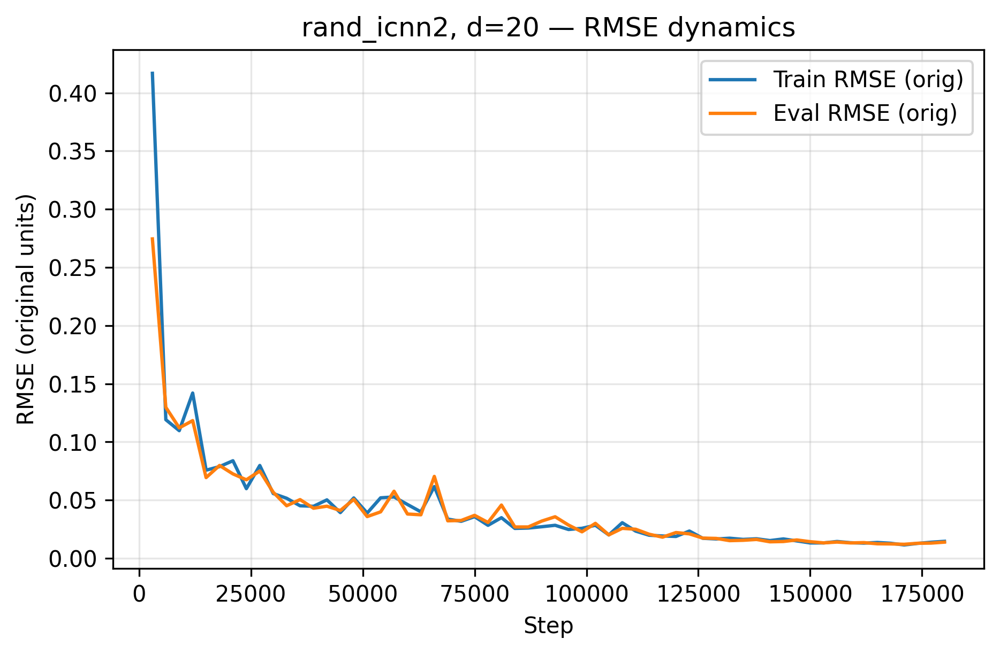

[csv] saved dlt_outputs/history_rand_icnn2_d20.csv
ICNN pre-learn → quadratic: steps=50000, batch=2048, lr=1.00e-03, ||Q||₂≈1.010, κ=100.94, ridge=0.01
[pre  20.0%] train MSE=1.436e-02 | eval RMSE=1.257e-01
[pre  40.0%] train MSE=8.107e-03 | eval RMSE=9.423e-02
[pre  60.0%] train MSE=6.346e-03 | eval RMSE=8.862e-02
[pre  80.0%] train MSE=6.577e-03 | eval RMSE=8.004e-02
[pre 100.0%] train MSE=5.403e-03 | eval RMSE=7.269e-02
ICNN pre-learn done in 96.9s

================= rand_icnn2 — d=50 =================
ICNN(2) prelearn 50000 steps; median||y|| target=3.00 (obs=2.67 → scale=1.13); symmetric whitening
Model:    ResNet(width=768, depth=6), params=7.19M
Sampler:  MACRO | batch=3200 (B_macro) | steps=240000 | lr=1.00e-03
[  1.7%] train loss=8.859e-04 | train RMSE=1.295e-01 | eval RMSE=1.297e-01 (rel=4.265e-02, tstd=3.041e+00) | calib RNMSE≈4.209e-02, σ_t≈3.077e+00, RNMSE×σ_t≈1.295e-01
[  3.3%] train loss=3.996e-04 | train RMSE=8.706e-02 | eval RMSE=9.092e-02 (rel=2.918e-02, tstd=3.116e+0

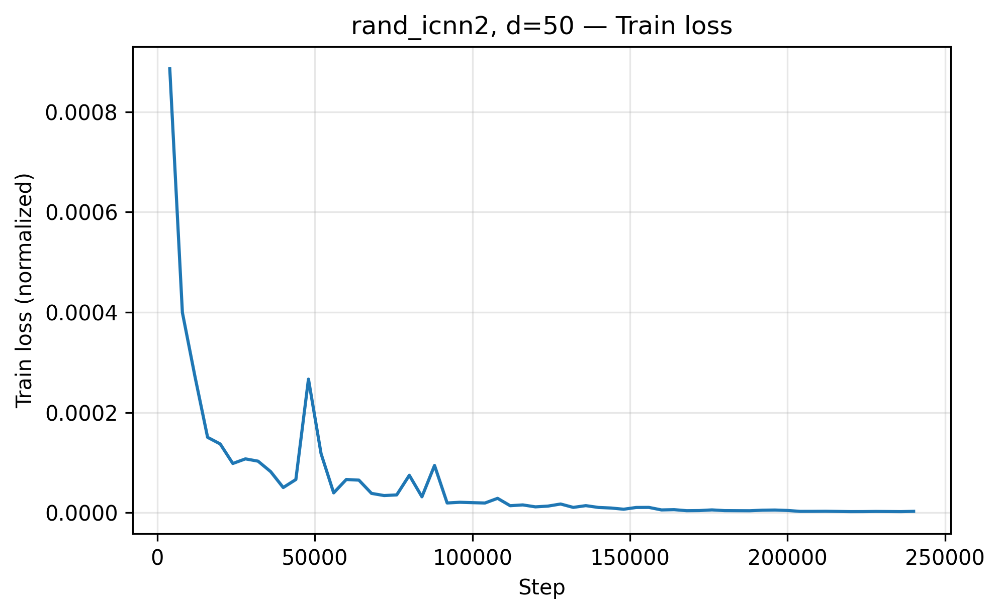

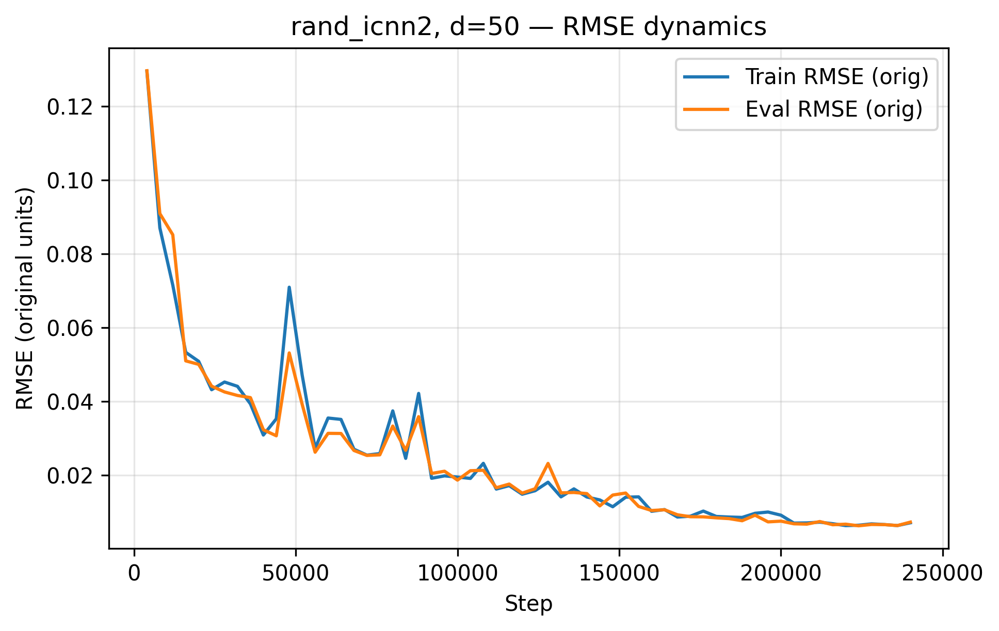

[csv] saved dlt_outputs/history_rand_icnn2_d50.csv

================= softplus_pairs — d=10 =================
Coupled Soft-plus: x_scale=1.0, block=64; symmetric whitening
Model:    ResNet(width=384, depth=4), params=1.20M
Sampler:  MACRO | batch=640 (B_macro) | steps=120000 | lr=1.00e-03
[  1.7%] train loss=3.736e-04 | train RMSE=5.970e-02 | eval RMSE=5.955e-02 (rel=2.710e-02, tstd=2.197e+00) | calib RNMSE≈2.734e-02, σ_t≈2.184e+00, RNMSE×σ_t≈5.970e-02
[  3.3%] train loss=2.534e-04 | train RMSE=4.928e-02 | eval RMSE=4.136e-02 (rel=1.903e-02, tstd=2.173e+00) | calib RNMSE≈2.251e-02, σ_t≈2.189e+00, RNMSE×σ_t≈4.928e-02
[  5.0%] train loss=1.058e-04 | train RMSE=3.166e-02 | eval RMSE=2.538e-02 (rel=1.154e-02, tstd=2.200e+00) | calib RNMSE≈1.455e-02, σ_t≈2.177e+00, RNMSE×σ_t≈3.166e-02
[  6.7%] train loss=3.516e-04 | train RMSE=5.812e-02 | eval RMSE=4.370e-02 (rel=1.968e-02, tstd=2.221e+00) | calib RNMSE≈2.652e-02, σ_t≈2.192e+00, RNMSE×σ_t≈5.812e-02
[  8.3%] train loss=1.058e-04 | train RMSE

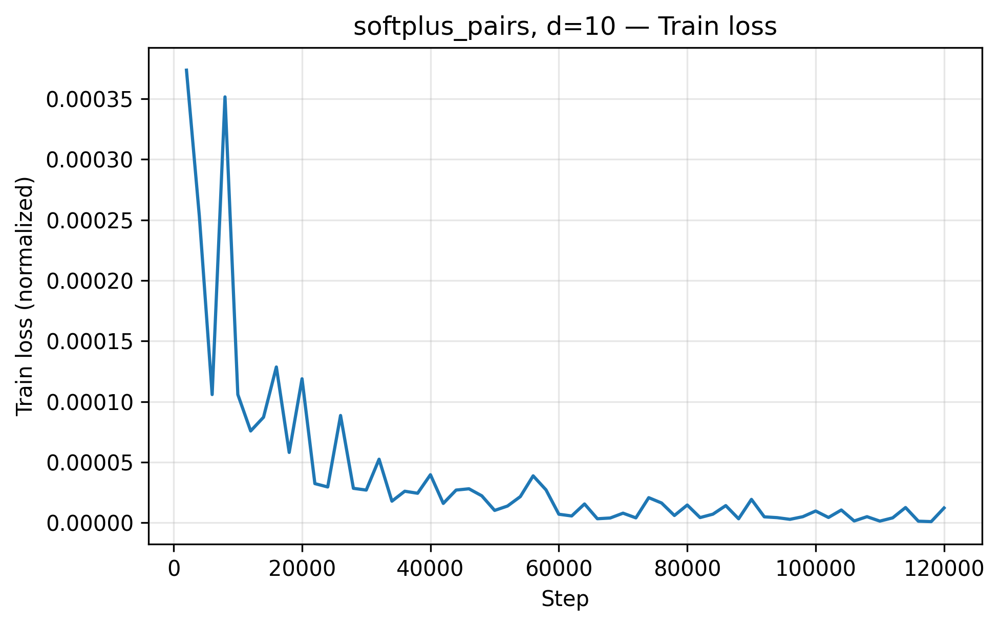

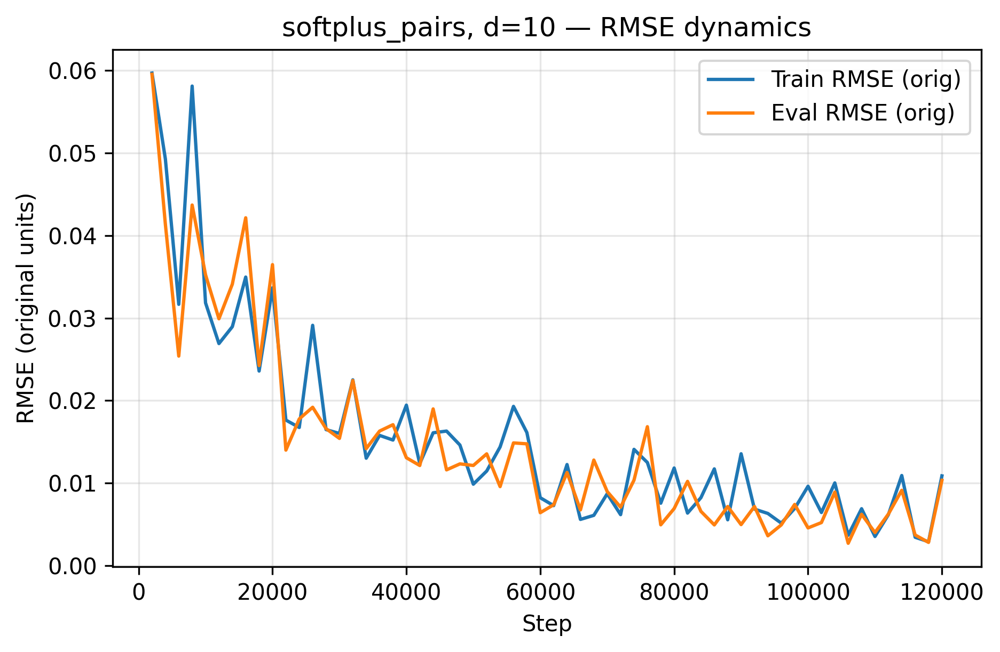

[csv] saved dlt_outputs/history_softplus_pairs_d10.csv

================= softplus_pairs — d=20 =================
Coupled Soft-plus: x_scale=1.0, block=64; symmetric whitening
Model:    ResNet(width=512, depth=5), params=2.66M
Sampler:  MACRO | batch=1280 (B_macro) | steps=180000 | lr=1.00e-03
[  1.7%] train loss=3.052e-04 | train RMSE=1.566e-01 | eval RMSE=1.595e-01 (rel=2.529e-02, tstd=6.306e+00) | calib RNMSE≈2.471e-02, σ_t≈6.340e+00, RNMSE×σ_t≈1.566e-01
[  3.3%] train loss=4.852e-04 | train RMSE=1.968e-01 | eval RMSE=1.807e-01 (rel=2.869e-02, tstd=6.300e+00) | calib RNMSE≈3.115e-02, σ_t≈6.318e+00, RNMSE×σ_t≈1.968e-01
[  5.0%] train loss=5.483e-05 | train RMSE=6.642e-02 | eval RMSE=6.825e-02 (rel=1.083e-02, tstd=6.305e+00) | calib RNMSE≈1.047e-02, σ_t≈6.343e+00, RNMSE×σ_t≈6.642e-02
[  6.7%] train loss=4.482e-05 | train RMSE=5.992e-02 | eval RMSE=6.275e-02 (rel=9.788e-03, tstd=6.411e+00) | calib RNMSE≈9.468e-03, σ_t≈6.329e+00, RNMSE×σ_t≈5.992e-02
[  8.3%] train loss=2.412e-04 | train

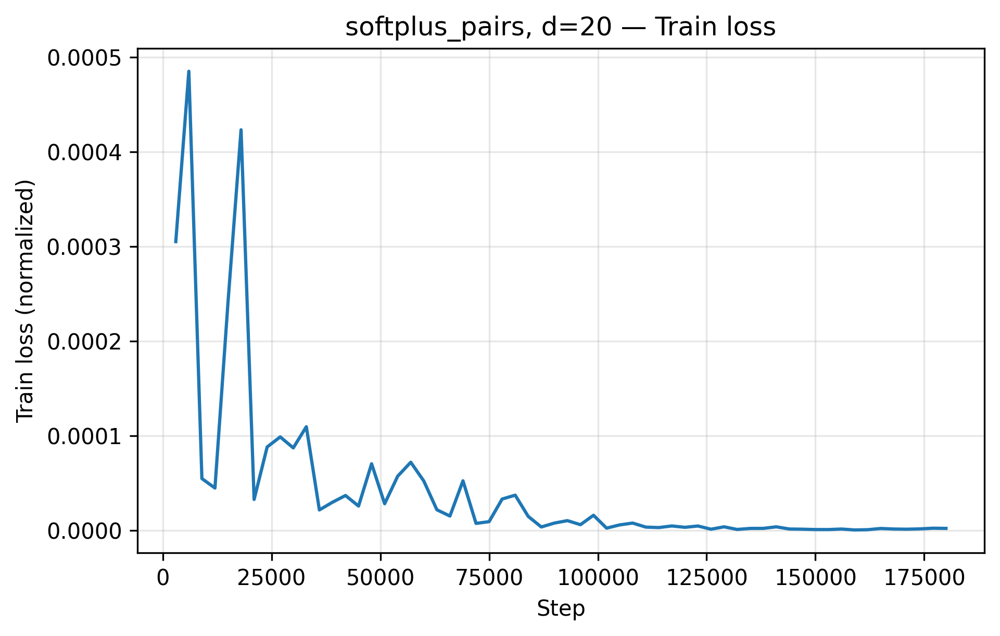

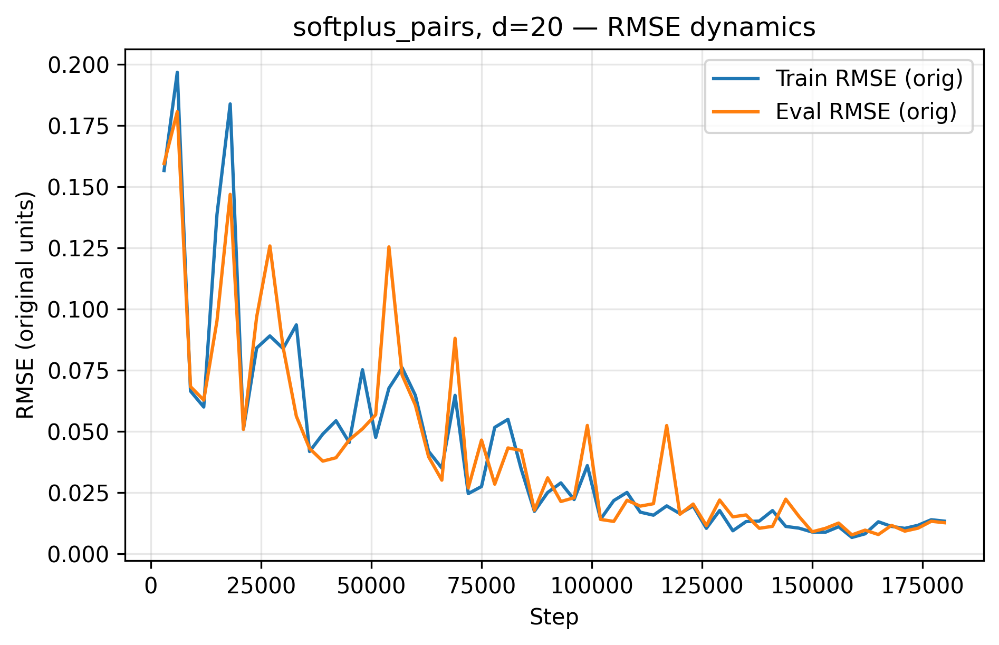

[csv] saved dlt_outputs/history_softplus_pairs_d20.csv

================= softplus_pairs — d=50 =================
Coupled Soft-plus: x_scale=1.0, block=64; symmetric whitening
Model:    ResNet(width=768, depth=6), params=7.19M
Sampler:  MACRO | batch=3200 (B_macro) | steps=240000 | lr=1.00e-03
[  1.7%] train loss=1.980e-03 | train RMSE=1.592e+00 | eval RMSE=1.543e+00 (rel=6.117e-02, tstd=2.523e+01) | calib RNMSE≈6.292e-02, σ_t≈2.530e+01, RNMSE×σ_t≈1.592e+00
[  3.3%] train loss=3.343e-04 | train RMSE=6.538e-01 | eval RMSE=5.937e-01 (rel=2.351e-02, tstd=2.526e+01) | calib RNMSE≈2.586e-02, σ_t≈2.529e+01, RNMSE×σ_t≈6.538e-01
[  5.0%] train loss=1.664e-04 | train RMSE=4.623e-01 | eval RMSE=4.533e-01 (rel=1.798e-02, tstd=2.521e+01) | calib RNMSE≈1.824e-02, σ_t≈2.534e+01, RNMSE×σ_t≈4.623e-01
[  6.7%] train loss=2.410e-04 | train RMSE=5.565e-01 | eval RMSE=6.029e-01 (rel=2.388e-02, tstd=2.525e+01) | calib RNMSE≈2.195e-02, σ_t≈2.535e+01, RNMSE×σ_t≈5.565e-01
[  8.3%] train loss=2.358e-04 | train

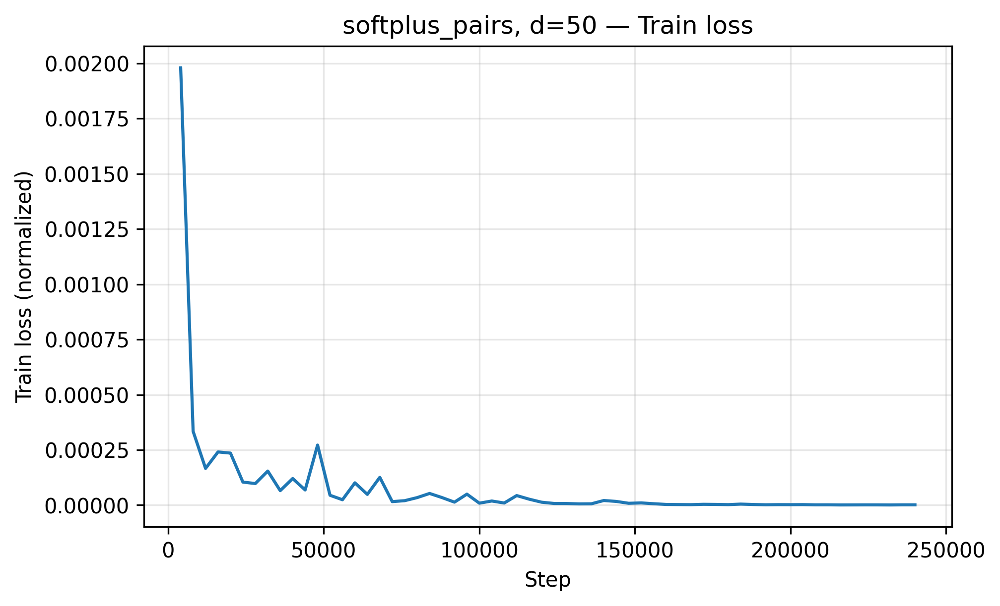

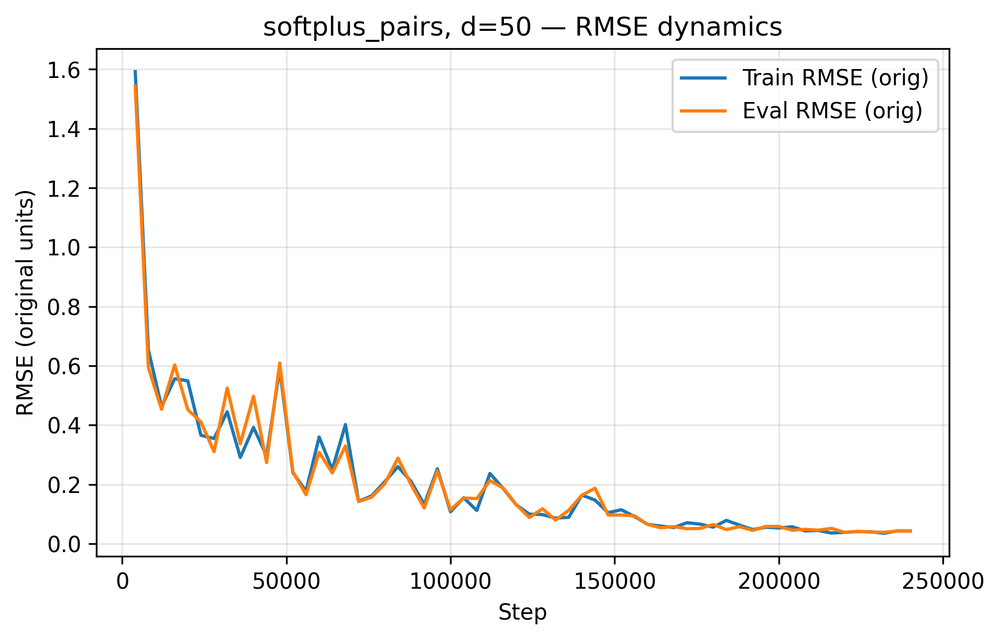

[csv] saved dlt_outputs/history_softplus_pairs_d50.csv

========================= PER-TRIAL RESULTS =========================
trial |           task |    d |       RMSE |    relRMSE | time(s)
------------------------------------------------------------------------
    0 |       quad_spd |   10 |  8.396e-03 |  8.032e-03 |   575.1
    0 |       quad_spd |   20 |  6.025e-03 |  4.544e-03 |  1005.3
    0 |       quad_spd |   50 |  1.298e-03 |  6.607e-04 |  2707.1
    0 |  exp_minus_lin |   10 |  4.984e-02 |  1.359e-02 |   589.9
    0 |  exp_minus_lin |   20 |  9.464e-02 |  2.589e-02 |  1018.7
    0 |  exp_minus_lin |   50 |  1.007e-01 |  2.491e-02 |  2711.5
    0 |     rand_icnn2 |   10 |  1.819e-02 |  5.105e-03 |   697.7
    0 |     rand_icnn2 |   20 |  1.652e-02 |  5.231e-03 |  1188.5
    0 |     rand_icnn2 |   50 |  1.277e-02 |  4.175e-03 |  2759.2
    0 | softplus_pairs |   10 |  2.371e-03 |  1.074e-03 |   954.2
    0 | softplus_pairs |   20 |  3.407e-02 |  5.371e-03 |  2168.8
    0 | s

In [ ]:
# dlt_resnet_suite_v12_whiten_plots.py
# ResNet-only DLT with correct whitening, longer training defaults, and plots
# that are saved at 300 dpi and also shown inline in notebooks/Colab.
#
# DLT guarantees:
#   • Fresh randomness every step (no dataset/replay)
#   • NEVER backprop through f (y is detached before features)
# Whitening (DLT-safe; applied to detached y):
#   • Quadratic SPD: z = Q^{-1/2} y  (full symmetric map via eigenbasis)
#   • Exp−Minus−Lin: analytic μ(y) and rank-1 covariance (εI-regularized), symmetric whitening
#   • ICNN/Soft-plus: probe-based μ/Σ of y, symmetric whitening
#
# Reporting:
#   • Fewer logs by default: ~60 points per run (configurable)
#   • Each log also runs eval; prints train-loss, train-RMSE(orig), eval-RMSE(orig)
# Plots:
#   • Two PNGs per (task, d): train loss (normalized), RMSE dynamics
#   • Saved at 300 dpi; also displayed inline in notebook if available
#
# Example (smoke):
#   python dlt_resnet_suite_v12_whiten_plots.py --functions quad_spd exp_minus_lin rand_icnn2 softplus_pairs \
#       --dims 5 10 --trials 1 --steps 8000 --out_dir dlt_outputs_smoke --softplus_block 48 --seed 123
#
# Example (full-ish):
#   python dlt_resnet_suite_v12_whiten_plots.py --functions quad_spd exp_minus_lin rand_icnn2 softplus_pairs \
#       --dims 20 50 --trials 3 --steps 120000 --out_dir dlt_outputs --seed 42

import os, sys, time, math, argparse, copy, csv
from dataclasses import dataclass
from typing import Optional, List, Dict, Tuple

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import matplotlib
matplotlib.use("Agg")  # headless backend; we display via IPython.display after saving
import matplotlib.pyplot as plt

# =========== Notebook/Colab display helpers ===========
def _in_ipython():
    try:
        from IPython import get_ipython
        return get_ipython() is not None
    except Exception:
        return False

def _maybe_display_png(path:str):
    if not _in_ipython():
        return
    try:
        from IPython.display import display, Image as IPyImage
        display(IPyImage(filename=path))
    except Exception:
        pass

# ========================= Device & seed =========================
def get_device():
    if torch.cuda.is_available(): return torch.device("cuda")
    if hasattr(torch.backends, "mps") and torch.backends.mps.is_available(): return torch.device("mps")
    return torch.device("cpu")

def set_seed(seed:int):
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

# ========================= SPD helpers ===========================
@torch.no_grad()
def make_spd(d:int, seed:int, norm:str="spectral", ridge:float=1e-2, device=None):
    """Build an SPD Q without touching the global RNG state (local generator)."""
    g = torch.Generator(device="cpu"); g.manual_seed(seed)
    A = torch.randn(d, d, dtype=torch.float32, generator=g)  # CPU
    Q = A.t() @ A
    if norm == "spectral":
        lam = torch.linalg.eigvalsh(Q)
        lam_max = lam.max().clamp_min(1e-12)
        Q = Q / lam_max
    elif norm == "mean":
        Q = Q / (torch.trace(Q) / float(d)).clamp_min(1e-12)
    else:
        raise ValueError(f"unknown spd_norm '{norm}'")
    Q = Q + ridge * torch.eye(d, dtype=torch.float32)
    return Q.to(device=device, dtype=torch.float32)

@torch.no_grad()
def spd_stats(Q:torch.Tensor)->Dict[str,float]:
    lam = torch.linalg.eigvalsh(Q)
    return {"lambda_min": float(lam.min()),
            "lambda_max": float(lam.max()),
            "kappa": float((lam.max()/lam.min()).item()),
            "trace": float(torch.trace(Q))}

# ========================= Utility: orth from unit vector ========
@torch.no_grad()
def orth_from_unit_vector(a:torch.Tensor) -> torch.Tensor:
    """
    Orthonormal basis U with first column aligned to a (unit).
    Construct by QR on a-complement then fix sign of the first column.
    """
    d = a.numel()
    B = torch.randn(d, d-1, device=a.device, dtype=a.dtype)
    B = B - a[:,None] * (a[None,:] @ B)  # project to a^⊥
    A = torch.cat([a[:,None], B], dim=1)
    Q, _ = torch.linalg.qr(A, mode="reduced")
    if torch.dot(Q[:,0], a) < 0:
        Q[:,0] = -Q[:,0]
    return Q

# ========================= Tasks ================================
@dataclass
class QuadSPD:
    d:int; Q:torch.Tensor; U:torch.Tensor; lam_inv_sqrt:torch.Tensor
    def sample_x(self,B:int): return torch.randn(B, self.d, device=self.Q.device)
    def f(self,x): return 0.5*torch.sum((x @ self.Q) * x, dim=-1)
    def grad(self,x): return x @ self.Q
    def z_from_y(self,y, x=None):
        # DLT-aware: z = Q^{-1/2} y = U diag(λ^{-1/2}) U^T y
        yz = (y @ self.U) * self.lam_inv_sqrt
        return yz @ self.U.t()

@dataclass
class ExpMinusLin:
    d:int; a:torch.Tensor; b:torch.Tensor
    Wy_U:torch.Tensor; Wy_diag_inv_sqrt:torch.Tensor; y_mu:torch.Tensor
    def sample_x(self,B:int): return torch.randn(B, self.d, device=self.a.device)
    def f(self,x):
        ax = x @ self.a
        return torch.exp(ax) - (x @ self.b)
    def grad(self,x):
        ax = x @ self.a
        return torch.exp(ax)[:,None]*self.a[None,:] - self.b[None,:]
    def z_from_y(self,y, x=None):
        yz = (y - self.y_mu[None,:]) @ self.Wy_U
        yz = yz * self.Wy_diag_inv_sqrt
        return yz @ self.Wy_U.t()

# ---- Trainable 2-layer ICNN (pre-learning target) ----
class ICNN2Trainable(nn.Module):
    """2-layer ICNN with softplus; convexity via softplus(raw) on z->z and z->out weights."""
    def __init__(self, d:int, h1:int=128, h2:int=128, seed:int=0, device=None):
        super().__init__()
        g = torch.Generator(device=device); g.manual_seed(seed)
        self.U1 = nn.Parameter(torch.randn(d, h1, generator=g, device=device)/math.sqrt(d))
        self.U2 = nn.Parameter(torch.randn(d, h2, generator=g, device=device)/math.sqrt(d))
        self.b1 = nn.Parameter(torch.zeros(h1, device=device))
        self.b2 = nn.Parameter(torch.zeros(h2, device=device))
        self.raw_W21 = nn.Parameter(torch.randn(h1, h2, generator=g, device=device)*0.5)
        self.raw_wout= nn.Parameter(torch.randn(h2, 1, generator=g, device=device)*0.5)
        self.uout = nn.Parameter(torch.randn(d, 1, generator=g, device=device)/math.sqrt(d))
    def forward(self, x):
        W21 = F.softplus(self.raw_W21)    # nonnegative
        wout= F.softplus(self.raw_wout)   # nonnegative
        z1 = F.softplus(x @ self.U1 + self.b1)
        z2 = F.softplus(z1 @ W21 + x @ self.U2 + self.b2)
        return (z2 @ wout).squeeze(-1) + (x @ self.uout).squeeze(-1)

@dataclass
class ICNNTask:
    d:int; net:nn.Module; device:torch.device
    y_mu:torch.Tensor; Wy_U:torch.Tensor; Wy_diag_inv_sqrt:torch.Tensor
    x_scale:float
    def sample_x(self,B:int): return self.x_scale * torch.randn(B, self.d, device=self.device)
    def f(self,x): return self.net(x)
    def grad(self,x):
        if not x.requires_grad:
            x = x.detach().requires_grad_(True)
        fx = self.net(x)
        (gy,) = torch.autograd.grad(fx.sum(), x, create_graph=False, retain_graph=False)
        return gy.detach()
    def z_from_y(self,y, x=None):
        yz = (y - self.y_mu[None,:]) @ self.Wy_U
        yz = yz * self.Wy_diag_inv_sqrt
        return yz @ self.Wy_U.t()

# ---- Coupled Soft-plus with chunked O(d^2) kernel ----
def softplus_pairs_f_grad(X:torch.Tensor, block:int=64):
    """f(x)=sum_{i<j} softplus(x_i+x_j).  Returns f, ∇f in O(d^2) using O(B*block) memory."""
    B, d = X.shape
    f = X.new_zeros(B)
    g = X.new_zeros(B, d)
    for i in range(d-1):
        xi = X[:, i:i+1]
        j = i + 1
        while j < d:
            J = slice(j, min(d, j+block))
            z = xi + X[:, J]
            sp = F.softplus(z)
            s  = torch.sigmoid(z)
            f += sp.sum(dim=1)
            g[:, i] += s.sum(dim=1)
            g[:, J] += s
            j += block
    return f, g

@dataclass
class SoftplusPairsTask:
    d:int; device:torch.device; block:int
    y_mu:torch.Tensor; Wy_U:torch.Tensor; Wy_diag_inv_sqrt:torch.Tensor
    x_scale:float
    def sample_x(self,B:int): return self.x_scale * torch.randn(B, self.d, device=self.device)
    def f(self,x): f,_ = softplus_pairs_f_grad(x, block=self.block); return f
    def grad(self,x): _,g = softplus_pairs_f_grad(x, block=self.block); return g
    def z_from_y(self,y, x=None):
        yz = (y - self.y_mu[None,:]) @ self.Wy_U
        yz = yz * self.Wy_diag_inv_sqrt
        return yz @ self.Wy_U.t()

# ========================= Probing & whitening ===================
def icnn_probe_y_stats(net:nn.Module, d:int, device, x_scale:float, nsamp:int=16384):
    """Probe y=∇f(x) via autograd (no global no_grad); stats computed on detached y."""
    B = 4096
    iters = max(1, (nsamp + B - 1)//B)
    norms = []
    y_sum = torch.zeros(d, device=device)
    yy_sum = torch.zeros(d, d, device=device)
    n = 0
    for _ in range(iters):
        b = min(B, nsamp - n)
        x = (x_scale * torch.randn(b, d, device=device)).requires_grad_(True)
        fx = net(x)
        (y,) = torch.autograd.grad(fx.sum(), x, create_graph=False, retain_graph=False)
        y = y.detach()
        norms.append(torch.linalg.norm(y, dim=1))
        y_sum += y.sum(dim=0)
        yy_sum += y.t() @ y
        n += b
    norms = torch.cat(norms, dim=0)
    mu = y_sum / n
    cov = (yy_sum / n) - mu[:,None] @ mu[None,:]
    eig = torch.linalg.eigvalsh(cov)
    return {"med_norm": float(torch.median(norms)),
            "mu": mu, "cov": cov,
            "eig_min": float(eig.min()), "eig_max": float(eig.max())}

def probe_y_stats(sample_x_fn, grad_fn, d:int, device, nsamp:int=16384, cov_reg:float=1e-3, B:int=4096):
    """Generic probe for y stats. Compute y (autograd if needed), then DETACH and accumulate."""
    y_sum = torch.zeros(d, device=device)
    yy_sum = torch.zeros(d, d, device=device)
    n = 0
    iters = max(1, (nsamp + B - 1)//B)
    for _ in range(iters):
        b = min(B, nsamp - n)
        x = sample_x_fn(b)
        y = grad_fn(x).detach()
        y_sum += y.sum(dim=0)
        yy_sum += y.t() @ y
        n += b
    mu = y_sum / n
    cov = (yy_sum / n) - mu[:,None] @ mu[None,:]
    cov = cov + cov_reg * torch.eye(d, device=device)
    lam, U = torch.linalg.eigh(cov)
    lam_inv_sqrt = 1.0 / torch.sqrt(lam.clamp_min(1e-12))
    return mu, U, lam_inv_sqrt

# ========================= Target scaler =========================
class TargetScaler:
    def __init__(self, momentum:float=0.98, eps:float=1e-8):
        self.momentum, self.eps = momentum, eps
        self.mu = None; self.sig = None
    @torch.no_grad()
    def fit_batch(self, t:torch.Tensor):
        bmu = t.mean()
        bsd = t.std(unbiased=False).clamp_min(self.eps)
        if self.mu is None: self.mu, self.sig = bmu, bsd
        else:
            self.mu  = self.momentum*self.mu  + (1-self.momentum)*bmu
            self.sig = self.momentum*self.sig + (1-self.momentum)*bsd
        return (t - self.mu)/self.sig, float(self.mu), float(self.sig)
    @torch.no_grad()
    def denorm(self, tzn:torch.Tensor):
        if self.mu is None or self.sig is None: return tzn
        return tzn*self.sig + self.mu

# ========================= ResNet learner ========================
class PreActBlock(nn.Module):
    def __init__(self, dim:int, hidden:int, alpha:float=0.5):
        super().__init__()
        self.ln1 = nn.LayerNorm(dim)
        self.fc1 = nn.Linear(dim, hidden)
        self.act = nn.GELU()
        self.ln2 = nn.LayerNorm(hidden)
        self.fc2 = nn.Linear(hidden, dim)
        self.alpha = alpha
        nn.init.xavier_uniform_(self.fc1.weight); nn.init.zeros_(self.fc1.bias)
        nn.init.xavier_uniform_(self.fc2.weight, gain=0.1); nn.init.zeros_(self.fc2.bias)
    def forward(self, x):
        y = self.fc1(self.ln1(x)); y = self.act(y); y = self.fc2(self.ln2(y))
        return x + self.alpha*y

class ResNetDLT(nn.Module):
    def __init__(self, in_dim:int, width:int, depth:int, square_feat:bool=True, use_layernorm:bool=False):
        super().__init__()
        self.square = square_feat
        eff_in = in_dim*(2 if self.square else 1)
        self.in_ln = nn.LayerNorm(eff_in) if use_layernorm else None
        self.embed = nn.Linear(eff_in, width)
        self.blocks = nn.ModuleList([PreActBlock(width, width) for _ in range(depth)])
        self.head_ln = nn.LayerNorm(width)
        self.head = nn.Linear(width, 1)
        nn.init.xavier_uniform_(self.embed.weight); nn.init.zeros_(self.embed.bias)
        nn.init.xavier_uniform_(self.head.weight);  nn.init.zeros_(self.head.bias)
    def forward(self, z):
        if self.square: z = torch.cat([z, z*z], dim=-1)
        if self.in_ln is not None: z = self.in_ln(z)
        h = self.embed(z)
        for b in self.blocks: h = b(h)
        return self.head(self.head_ln(h)).squeeze(-1)

def resnet_size_for_dim(dim:int)->Tuple[int,int]:
    if dim <= 10:  return 384, 4
    if dim <= 20:  return 512, 5
    if dim <= 50:  return 768, 6
    if dim <= 100: return 1024, 7
    return 1280, 8

# ========================= Batch rules & loss ====================
def macro_batch_size(d:int)->int:
    return max(600, 64*d)  # single fresh macro-batch per step

def huber_loss(pred, target, delta:float=1.0):
    return F.huber_loss(pred, target, delta=delta, reduction="mean")

# ========================= ICNN pre-learning =====================
def prelearn_icnn_to_quadratic(net:ICNN2Trainable,
                               d:int, device,
                               steps:int=50000, lr:float=1e-3, batch:int=2048,
                               spd_norm:str="spectral", ridge:float=1e-2,
                               seed:int=12345):
    Q = make_spd(d, seed=seed, norm=spd_norm, ridge=ridge, device=device)
    stats = spd_stats(Q)
    opt = optim.AdamW(net.parameters(), lr=lr, weight_decay=1e-4)
    sched = optim.lr_scheduler.CosineAnnealingLR(opt, T_max=steps, eta_min=1e-5)
    print(f"ICNN pre-learn → quadratic: steps={steps}, batch={batch}, lr={lr:.2e}, "
          f"||Q||₂≈{stats['lambda_max']:.3f}, κ={stats['kappa']:.2f}, ridge={ridge:g}")
    t0 = time.time()
    for s in range(1, steps+1):
        x = torch.randn(batch, d, device=device)
        target = 0.5*torch.sum((x @ Q)*x, dim=-1)
        pred = net(x)
        loss = F.mse_loss(pred, target)
        opt.zero_grad(set_to_none=True); loss.backward()
        torch.nn.utils.clip_grad_norm_(net.parameters(), 1.0)
        opt.step(); sched.step()
        if s % max(1, steps//5) == 0 or s == steps:
            with torch.no_grad():
                xe = torch.randn(batch, d, device=device)
                te = 0.5*torch.sum((xe @ Q)*xe, dim=-1)
                pe = net(xe)
                rmse = torch.sqrt(F.mse_loss(pe, te)).item()
            print(f"[pre {100*s/steps:5.1f}%] train MSE={loss.item():.3e} | eval RMSE={rmse:.3e}")
    print(f"ICNN pre-learn done in {time.time()-t0:.1f}s")

# ========================= Macro/mini sample =====================
DEBUG_FRESH = os.environ.get("DLT_DEBUG_FRESH", "0") == "1"

def compute_macro_batch(obj, B:int):
    """Fresh batch with no gradient through f. Returns (y_detached, t_detached, x_detached)."""
    with torch.enable_grad():
        x = obj["sample_x"](B)
        if DEBUG_FRESH:
            s = float(x.double().mul(1e6).round().sum().item())
            last = getattr(compute_macro_batch, "_last_sum", None)
            if last is not None and s == last:
                raise RuntimeError("Fresh randomness assertion tripped: identical x-sum across consecutive calls.")
            compute_macro_batch._last_sum = s
        x.requires_grad_(True)
        y = obj["grad"](x)
        y = y.detach()
        x_det = x.detach()
    with torch.no_grad():
        t = (x_det*y).sum(dim=-1) - obj["f"](x_det)
    return y, t, x_det

# ========================= Evaluation ============================
def evaluate_generic(model:nn.Module, obj, z_map, tscaler:Optional[TargetScaler], test_B:int=8192) -> Dict[str, float]:
    y, t, x = compute_macro_batch(obj, test_B)
    with torch.no_grad():
        z = z_map(y, x)
        pred_zn = model(z)
        pred = tscaler.denorm(pred_zn) if tscaler is not None else pred_zn
        mse  = torch.mean((pred - t)**2).item()
        rmse = math.sqrt(mse)
        mae  = torch.mean((pred - t).abs()).item()
        t_std = t.std(unbiased=False).item()
        rel = rmse / max(t_std, 1e-8)
    return {"rmse":rmse, "mae":mae, "rel_rmse":rel, "t_std":t_std}

# ========================= Task builders =========================
def build_task_quad_spd(d:int, args, device):
    Q = make_spd(d, seed=args.seed + d*17, norm=args.spd_norm, ridge=args.ridge, device=device)
    stats = spd_stats(Q)
    lam, U = torch.linalg.eigh(Q)
    lam_inv_sqrt = (1.0 / torch.sqrt(lam.clamp_min(1e-12))).to(device)
    quad = QuadSPD(d=d, Q=Q, U=U, lam_inv_sqrt=lam_inv_sqrt)
    obj = {"sample_x": quad.sample_x, "f": quad.f, "grad": quad.grad,
           "z_from_y": lambda y,x: quad.z_from_y(y, x), "z_dim": d}
    meta = (f"Quadratic SPD: ||Q||₂≈{stats['lambda_max']:.3f}, κ={stats['kappa']:.2f}; "
            f"features: z = Q^{-1/2} y (+ z^2)")
    return obj, meta

def build_task_exp_minus_lin(d:int, args, device):
    g = torch.Generator(device=device); g.manual_seed(args.seed + d*31)
    a_raw = torch.randn(d, generator=g, device=device)
    b_raw = torch.randn(d, generator=g, device=device)
    a = a_raw / (a_raw.norm() + 1e-12)
    b = b_raw / (b_raw.norm() + 1e-12)

    # Analytic y-stats for x~N(0,I): y = e^{a·x} a − b
    mu_y = (math.exp(0.5) * a) - b
    var_e = (math.e**2 - math.e)
    U = orth_from_unit_vector(a)
    lam = torch.full((d,), args.exp_cov_reg, device=device, dtype=torch.float32)
    lam[0] = float(var_e + args.exp_cov_reg)
    lam_inv_sqrt = 1.0 / torch.sqrt(lam.clamp_min(1e-12))

    task = ExpMinusLin(d=d, a=a, b=b, Wy_U=U, Wy_diag_inv_sqrt=lam_inv_sqrt, y_mu=mu_y)
    obj = {"sample_x": task.sample_x, "f": task.f, "grad": task.grad,
           "z_from_y": lambda y,x: task.z_from_y(y, x), "z_dim": d}
    meta = (f"Exp−Linear: unit a,b; analytic μ(y), rank-1 cov + εI; symmetric whitening (+ z^2)")
    return obj, meta

def build_task_rand_icnn2(d:int, args, device):
    net = ICNN2Trainable(d=d, h1=128, h2=128, seed=args.seed + d*53, device=device)
    if args.icnn_prelearn_steps > 0:
        prelearn_icnn_to_quadratic(net, d, device,
                                   steps=args.icnn_prelearn_steps,
                                   lr=args.icnn_prelearn_lr,
                                   batch=args.icnn_prelearn_batch,
                                   spd_norm=args.icnn_prelearn_spd_norm,
                                   ridge=args.icnn_prelearn_ridge,
                                   seed=args.seed + 777*d)
    for p in net.parameters(): p.requires_grad_(False)
    net.eval()

    # Auto-scale to target median ||y||, then probe μ/Σ
    def probe_med_norm(x_scale:float, nsamp:int)->float:
        B=4096; iters=max(1,(nsamp+B-1)//B); norms=[]
        for _ in range(iters):
            b=min(B, nsamp); x=(x_scale*torch.randn(b,d,device=device)).requires_grad_(True)
            fx=net(x); (y,)=torch.autograd.grad(fx.sum(), x, create_graph=False, retain_graph=False)
            norms.append(torch.linalg.norm(y.detach(),dim=1))
        return float(torch.median(torch.cat(norms,dim=0)).item())

    med = probe_med_norm(1.0, min(args.icnn_whiten_samples, 32768))
    target = args.icnn_target_y_med
    scale = float(np.clip(target / max(med, 1e-6), 0.1, 10.0))

    def sample_x_scaled(B:int): return scale * torch.randn(B, d, device=device)
    def grad_icnn(x):
        if not x.requires_grad: x=x.detach().requires_grad_(True)
        fx=net(x); (gy,)=torch.autograd.grad(fx.sum(), x, create_graph=False, retain_graph=False)
        return gy.detach()

    mu, U, lam_inv_sqrt = probe_y_stats(sample_x_scaled, grad_icnn, d, device,
                                        nsamp=args.icnn_whiten_samples, cov_reg=args.icnn_cov_reg, B=4096)

    task = ICNNTask(d=d, net=net, device=device, y_mu=mu, Wy_U=U, Wy_diag_inv_sqrt=lam_inv_sqrt, x_scale=scale)
    obj = {"sample_x": task.sample_x, "f": task.f, "grad": task.grad,
           "z_from_y": lambda y,x: task.z_from_y(y, x), "z_dim": d}
    meta = (f"ICNN(2) prelearn {args.icnn_prelearn_steps} steps; "
            f"median||y|| target={target:.2f} (obs={med:.2f} → scale={scale:.2f}); symmetric whitening")
    return obj, meta

def build_task_softplus_pairs(d:int, args, device):
    def sample_x(B:int): return args.softplus_x_scale * torch.randn(B, d, device=device)
    def grad_fn(x): _,g = softplus_pairs_f_grad(x, block=args.softplus_block); return g
    mu, U, lam_inv_sqrt = probe_y_stats(sample_x, grad_fn, d, device,
                                        nsamp=args.softplus_whiten_samples, cov_reg=args.softplus_cov_reg, B=2048)
    task = SoftplusPairsTask(d=d, device=device, block=args.softplus_block,
                             y_mu=mu, Wy_U=U, Wy_diag_inv_sqrt=lam_inv_sqrt,
                             x_scale=args.softplus_x_scale)
    obj = {"sample_x": task.sample_x, "f": task.f, "grad": task.grad,
           "z_from_y": lambda y,x: task.z_from_y(y, x), "z_dim": d}
    meta = (f"Coupled Soft-plus: x_scale={args.softplus_x_scale}, block={args.softplus_block}; symmetric whitening")
    return obj, meta

TASK_BUILDERS = {
    "quad_spd": build_task_quad_spd,
    "exp_minus_lin": build_task_exp_minus_lin,
    "rand_icnn2": build_task_rand_icnn2,
    "softplus_pairs": build_task_softplus_pairs,
}

# ========================= Plotting helpers ======================
def ensure_dir(path:str):
    if not os.path.isdir(path):
        os.makedirs(path, exist_ok=True)

def save_and_show_plot(fig, path:str, dpi:int=300):
    fig.savefig(path, dpi=dpi, bbox_inches="tight")
    plt.close(fig)
    _maybe_display_png(path)

# ========================= Training (macro / stream) =============
def resnet_size_for_dim(dim:int)->Tuple[int,int]:
    if dim <= 10:  return 384, 4
    if dim <= 20:  return 512, 5
    if dim <= 50:  return 768, 6
    if dim <= 100: return 1024, 7
    return 1280, 8

def train_task(task_name:str, d:int, build_task, args, device):
    obj, meta = build_task(d, args, device)
    zdim = obj["z_dim"]
    width, depth = resnet_size_for_dim(max(d, zdim))
    model = ResNetDLT(in_dim=zdim, width=width, depth=depth, square_feat=True, use_layernorm=False).to(device)
    n_params = sum(p.numel() for p in model.parameters())

    total_steps = (args.steps if d<=10 else
                   int(args.steps*1.5) if d<=20 else
                   int(args.steps*2.0) if d<=50 else
                   int(args.steps*2.5) if d<=100 else
                   int(args.steps*3.0))

    B_macro = macro_batch_size(d)
    if args.sampler == "macro":
        B = B_macro; lr_used = args.lr
    else:
        B = max(1, int(args.mb_factor * B_macro))
        lr_used = args.lr * (B / float(B_macro))

    if task_name == "softplus_pairs" and args.softplus_max_batch > 0:
        B = min(B, args.softplus_max_batch)

    opt = optim.AdamW(model.parameters(), lr=lr_used, weight_decay=1e-4)
    sched = optim.lr_scheduler.CosineAnnealingLR(opt, T_max=total_steps, eta_min=1e-6)
    tscaler = TargetScaler(momentum=0.98)

    print(f"\n================= {task_name} — d={d} =================")
    print(meta)
    print(f"Model:    ResNet(width={width}, depth={depth}), params={n_params/1e6:.2f}M")
    print(f"Sampler:  {args.sampler.upper()} | batch={B} "
          f"({'B_macro' if args.sampler=='macro' else f'{args.mb_factor:.2f}×B_macro'}) "
          f"| steps={total_steps} | lr={lr_used:.2e}")

    history = []
    # Fewer logs: either by log_points or min_log_interval safeguard
    log_every = max(args.min_log_interval, max(1, total_steps // max(1, args.log_points)))
    best_rmse = float("inf"); best_state = None
    t0 = time.time()
    for step in range(1, total_steps+1):
        y, t, x = compute_macro_batch(obj, B)  # detached y
        z = obj["z_from_y"](y, x)
        assert not y.requires_grad and not z.requires_grad

        tzn, _, _ = tscaler.fit_batch(t)
        pred_zn = model(z)
        loss = huber_loss(pred_zn, tzn, delta=args.huber_delta) if args.loss == "huber" \
               else torch.mean((pred_zn - tzn)**2)

        opt.zero_grad(set_to_none=True)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0 if d <= 20 else 0.5)
        opt.step(); sched.step()

        if (step % log_every == 0) or (step == total_steps):
            with torch.no_grad():
                train_pred = tscaler.denorm(pred_zn)
                train_rmse = torch.sqrt(torch.mean((train_pred - t)**2)).item()
                ev = evaluate_generic(model, obj, lambda yy,xx: obj["z_from_y"](yy,xx),
                                      tscaler, test_B=max(8192, 2*B_macro//3))
                if ev["rmse"] < best_rmse:
                    best_rmse = ev["rmse"]; best_state = {k:v.detach().clone() for k,v in model.state_dict().items()}

                if args.loss == "huber":
                    approx_rnmse = math.sqrt(2.0*float(loss.item()))
                else:
                    approx_rnmse = math.sqrt(float(loss.item()))
                sigma_t = float(tscaler.sig) if tscaler.sig is not None else float("nan")
                expected_eval_rmse = approx_rnmse * sigma_t

            print(f"[{100.0*step/total_steps:5.1f}%] train loss={loss.item():.3e} | "
                  f"train RMSE={train_rmse:.3e} | eval RMSE={ev['rmse']:.3e} "
                  f"(rel={ev['rel_rmse']:.3e}, tstd={ev['t_std']:.3e}) | "
                  f"calib RNMSE≈{approx_rnmse:.3e}, σ_t≈{sigma_t:.3e}, RNMSE×σ_t≈{expected_eval_rmse:.3e}")

            history.append({"step": step,
                            "train_loss": float(loss.item()),
                            "train_rmse": float(train_rmse),
                            "eval_rmse": float(ev["rmse"]),
                            "eval_rel": float(ev["rel_rmse"]),
                            "t_std": float(ev["t_std"])})

    if best_state is not None:
        model.load_state_dict(best_state)

    total_time = time.time() - t0
    final = evaluate_generic(model, obj, lambda yy,xx: obj["z_from_y"](yy,xx),
                             tscaler, test_B=max(16384, B_macro))
    print(f"Final: RMSE={final['rmse']:.3e} (rel={final['rel_rmse']:.3e}) | time={total_time:.1f}s")

    # Plots + CSV
    if args.plot_curves or args.save_csv:
        ensure_dir(args.out_dir)
        title = f"{task_name}, d={d}"
        prefix = f"{task_name}_d{d}"

        # Loss plot (normalized units)
        fig1 = plt.figure(figsize=(7,4.2))
        xs = [h["step"] for h in history]
        ys = [h["train_loss"] for h in history]
        plt.plot(xs, ys, linewidth=1.5)
        plt.xlabel("Step"); plt.ylabel("Train loss (normalized)")
        plt.title(title + " — Train loss"); plt.grid(True, alpha=0.3)
        f1 = os.path.join(args.out_dir, f"{prefix}_train_loss.png")
        save_and_show_plot(fig1, f1, dpi=args.dpi)

        # RMSE plot (original units)
        fig2 = plt.figure(figsize=(7,4.2))
        ys_tr = [h["train_rmse"] for h in history]
        ys_ev = [h["eval_rmse"] for h in history]
        plt.plot(xs, ys_tr, linewidth=1.5, label="Train RMSE (orig)")
        plt.plot(xs, ys_ev,  linewidth=1.5, label="Eval RMSE (orig)")
        plt.xlabel("Step"); plt.ylabel("RMSE (original units)")
        plt.title(title + " — RMSE dynamics"); plt.legend(); plt.grid(True, alpha=0.3)
        f2 = os.path.join(args.out_dir, f"{prefix}_rmse.png")
        save_and_show_plot(fig2, f2, dpi=args.dpi)

        if args.save_csv:
            csv_path = os.path.join(args.out_dir, f"history_{prefix}.csv")
            with open(csv_path, "w", newline="") as f:
                w = csv.DictWriter(f, fieldnames=["step","train_loss","train_rmse","eval_rmse","eval_rel","t_std"])
                w.writeheader(); w.writerows(history)
            print(f"[csv] saved {csv_path}")

    return {"task":task_name, "d":d, "rmse":final["rmse"], "rel_rmse":final["rel_rmse"],
            "time":total_time, "params":n_params}

# ========================= Aggregation utils =====================
def _agg_mean_std(xs:List[float])->Tuple[float,float]:
    if not xs: return float("nan"), float("nan")
    if len(xs)==1: return xs[0], 0.0
    arr = np.array(xs, dtype=np.float64)
    return float(arr.mean()), float(arr.std(ddof=1))

def print_aggregate_table(rows:List[Dict]):
    key_to_vals = {}
    for r in rows:
        key = (r["task"], r["d"])
        key_to_vals.setdefault(key, {"rmse":[], "rel":[], "time":[], "params":r["params"]})
        key_to_vals[key]["rmse"].append(r["rmse"])
        key_to_vals[key]["rel"].append(r["rel_rmse"])
        key_to_vals[key]["time"].append(r["time"])
    print("\n========================= AGGREGATED (mean ± sd over trials) =========================")
    print(f"{'task':>14} | {'d':>4} | {'RMSE mean±sd':>22} | {'relRMSE mean±sd':>22} | {'time mean±sd (s)':>20}")
    print("-"*92)
    for (task,d), vals in sorted(key_to_vals.items(), key=lambda k:(k[0][0], k[0][1])):
        m_rmse, s_rmse = _agg_mean_std(vals["rmse"])
        m_rel,  s_rel  = _agg_mean_std(vals["rel"])
        m_t,    s_t    = _agg_mean_std(vals["time"])
        print(f"{task:>14} | {d:4d} | {m_rmse:10.3e} ± {s_rmse:10.3e} | {m_rel:10.3e} ± {s_rel:10.3e} | {m_t:7.1f} ± {s_t:7.1f}")

# ========================= Orchestrators =========================
def build_parser():
    ap = argparse.ArgumentParser()
    ap.add_argument("--functions", nargs="+", default=["quad_spd","exp_minus_lin","rand_icnn2","softplus_pairs"])
    ap.add_argument("--dims", nargs="+", type=int, default=[10,20,50])
    ap.add_argument("--trials", type=int, default=3)
    ap.add_argument("--steps", type=int, default=120000)
    ap.add_argument("--lr", type=float, default=1e-3)
    ap.add_argument("--seed", type=int, default=42)
    ap.add_argument("--spd_norm", choices=["spectral","mean"], default="spectral")
    ap.add_argument("--ridge", type=float, default=1e-2)
    # Exp−Minus−Lin whitening reg
    ap.add_argument("--exp_cov_reg", type=float, default=1e-3)
    # ICNN pre-learn
    ap.add_argument("--icnn_prelearn_steps", type=int, default=50000)
    ap.add_argument("--icnn_prelearn_lr", type=float, default=1e-3)
    ap.add_argument("--icnn_prelearn_batch", type=int, default=2048)
    ap.add_argument("--icnn_prelearn_spd_norm", choices=["spectral","mean"], default="spectral")
    ap.add_argument("--icnn_prelearn_ridge", type=float, default=1e-2)
    # ICNN conditioning
    ap.add_argument("--icnn_whiten_samples", type=int, default=32768)
    ap.add_argument("--icnn_target_y_med", type=float, default=3.0)
    ap.add_argument("--icnn_cov_reg", type=float, default=1e-3)
    # Soft-plus knobs
    ap.add_argument("--softplus_x_scale", type=float, default=1.0)
    ap.add_argument("--softplus_block", type=int, default=64)
    ap.add_argument("--softplus_max_batch", type=int, default=0)
    ap.add_argument("--softplus_whiten_samples", type=int, default=32768)
    ap.add_argument("--softplus_cov_reg", type=float, default=1e-3)
    # Learner loss
    ap.add_argument("--loss", choices=["mse","huber"], default="huber")
    ap.add_argument("--huber_delta", type=float, default=1.0)
    # Sampler
    ap.add_argument("--sampler", choices=["macro","stream"], default="macro")
    ap.add_argument("--mb_factor", type=float, default=0.25)
    # Reporting / plots
    ap.add_argument("--log_points", type=int, default=60, help="target number of logs per run (fewer=less frequent)")
    ap.add_argument("--min_log_interval", type=int, default=1000, help="min steps between logs/evals")
    ap.add_argument("--plot_curves", action="store_true", default=True)
    ap.add_argument("--save_csv", action="store_true", default=True)
    ap.add_argument("--out_dir", type=str, default="dlt_outputs")
    ap.add_argument("--dpi", type=int, default=300, help="PNG save DPI")
    return ap

def run_trials(args):
    device = get_device()
    print(f"Device: {device.type}, torch {torch.__version__}")
    if args.plot_curves or args.save_csv:
        ensure_dir(args.out_dir)
    all_rows = []
    base_seed = int(args.seed)
    for t in range(args.trials):
        trial_seed = base_seed + 1000003*t
        print(f"\n============================ TRIAL {t+1}/{args.trials} (seed={trial_seed}) ============================")
        set_seed(trial_seed)
        args_t = copy.deepcopy(args); args_t.seed = trial_seed

        for fn in args.functions:
            if fn not in TASK_BUILDERS:
                print(f"Skipping unknown function '{fn}'")
                continue
            for d in args.dims:
                out = train_task(fn, d, TASK_BUILDERS[fn], args_t, device)
                out["trial"] = t
                all_rows.append(out)
                if torch.cuda.is_available():
                    torch.cuda.empty_cache()

    # Per-trial table
    print("\n========================= PER-TRIAL RESULTS =========================")
    print(f"{'trial':>5} | {'task':>14} | {'d':>4} | {'RMSE':>10} | {'relRMSE':>10} | {'time(s)':>7}")
    print("-"*72)
    for r in all_rows:
        print(f"{r['trial']:5d} | {r['task']:>14} | {r['d']:4d} | {r['rmse']:10.3e} | {r['rel_rmse']:10.3e} | {r['time']:7.1f}")

    print_aggregate_table(all_rows)
    return all_rows

def run_cli(argv: Optional[List[str]] = None):
    parser = build_parser()
    args, _ = parser.parse_known_args(argv)
    rows = run_trials(args)
    return rows

# ============================ MAIN ===============================
if __name__ == "__main__":
    # quick_args = [
    #     "--functions", "quad_spd", "exp_minus_lin", "rand_icnn2", "softplus_pairs",
    #     "--dims", "5", "10",
    #     "--trials", "1",
    #     "--steps", "8000",
    #     "--out_dir", "dlt_outputs_smoke",
    #     "--softplus_block", "48",
    #     "--seed", "123"
    # ]
    # run_cli(quick_args)
    run_cli()
